# Project 2 - Ames Housing Data and Kaggle Challenge
### Supriya Sambhus

## Problem Statement

As part of the Data Science team of a real estate company, I have been with tasked with analysing the Ames Housing Dataset and finding the key factors that influence the Sales Price of a house in Ames city. Through this analysis, I will make recommendations to homeowners on improving their property’s value and give them insights about which features of their house will influence the sales price the most. 

In [893]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statistics
import matplotlib.ticker as ticker
from numpy import median

In [894]:
df_ames = pd.read_csv("datasets/train.csv")
df_ames_test = pd.read_csv('datasets/test.csv')

In [895]:
df_ames.head()

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


In [896]:
df_ames_test.head()

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,...,0,0,0,NaN,NaN,NaN,0,4,2006,WD
1,2718,905108090,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,...,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2,2414,528218130,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,...,0,0,0,NaN,NaN,NaN,0,9,2006,New
3,1989,902207150,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,...,0,0,0,NaN,NaN,NaN,0,7,2007,WD
4,625,535105100,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,...,0,185,0,NaN,NaN,NaN,0,7,2009,WD


## Data Cleaning

In [897]:
# Display summary statistics

df_ames.describe()

,Id,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2051.000000,2.051000e+03,2051.000000,1721.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2029.000000,...,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000
mean,1474.033642,7.135900e+08,57.008776,69.055200,10065.208191,6.112140,5.562165,1971.708922,1984.190151,99.695909,...,93.833740,47.556802,22.571916,2.591419,16.511458,2.397855,51.574354,6.219893,2007.775719,181469.701609
std,843.980841,1.886918e+08,42.824223,23.260653,6742.488909,1.426271,1.104497,30.177889,21.036250,174.963129,...,128.549416,66.747241,59.845110,25.229615,57.374204,37.782570,573.393985,2.744736,1.312014,79258.659352
min,1.000000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,753.500000,5.284581e+08,20.000000,58.000000,7500.000000,5.000000,5.000000,1953.500000,1964.500000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129825.000000
50%,1486.000000,5.354532e+08,50.000000,68.000000,9430.000000,6.000000,5.000000,1974.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162500.000000
75%,2198.000000,9.071801e+08,70.000000,80.000000,11513.500000,7.000000,6.000000,2001.000000,2004.000000,161.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,2930.000000,9.241520e+08,190.000000,313.000000,159000.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,547.000000,432.000000,508.000000,490.000000,800.000000,17000.000000,12.000000,2010.000000,611657.000000


In [898]:
# Display summary statistics

df_ames_test.describe()

,Id,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
count,878.000000,8.780000e+02,878.000000,718.000000,878.000000,878.000000,878.000000,878.000000,878.000000,877.000000,...,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,1444.749431,7.162867e+08,58.268793,69.545961,10307.033030,6.050114,5.566059,1970.492027,1984.417995,106.236032,...,470.362187,93.430524,47.070615,24.064920,2.597950,14.830296,1.884966,48.498861,6.202733,2007.825740
std,850.838263,1.889103e+08,42.235407,23.533945,10002.674602,1.369065,1.128903,30.395895,20.450725,187.158908,...,212.734075,121.181702,68.180939,73.249463,24.962482,53.003794,29.916672,550.169317,2.642498,1.327861
min,2.000000,5.263021e+08,20.000000,21.000000,1477.000000,2.000000,1.000000,1880.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,692.250000,5.284841e+08,20.000000,59.000000,7297.250000,5.000000,5.000000,1954.000000,1967.000000,0.000000,...,322.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000
50%,1433.000000,5.354542e+08,50.000000,68.000000,9446.000000,6.000000,5.000000,1972.000000,1992.000000,0.000000,...,473.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2197.500000,9.071904e+08,70.000000,80.000000,11589.000000,7.000000,6.000000,1999.750000,2003.000000,172.000000,...,576.000000,170.750000,69.750000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2928.000000,1.007100e+09,190.000000,182.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,...,1488.000000,690.000000,742.000000,1012.000000,360.000000,576.000000,555.000000,15500.000000,12.000000,2010.000000


In [899]:
# Shape of the data

df_ames.shape

(2051, 81)

In [900]:
df_ames_test.shape

(878, 80)

In [901]:
# Information about the columns, non-null values & Data Types
df_ames.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   int64  
 1   PID              2051 non-null   int64  
 2   MS SubClass      2051 non-null   int64  
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     1721 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Alley            140 non-null    object 
 8   Lot Shape        2051 non-null   object 
 9   Land Contour     2051 non-null   object 
 10  Utilities        2051 non-null   object 
 11  Lot Config       2051 non-null   object 
 12  Land Slope       2051 non-null   object 
 13  Neighborhood     2051 non-null   object 
 14  Condition 1      2051 non-null   object 
 15  Condition 2      2051 non-null   object 
 16  Bldg Type        2051 non-null   object 
 17  House Style   

In [902]:
df_ames_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               878 non-null    int64  
 1   PID              878 non-null    int64  
 2   MS SubClass      878 non-null    int64  
 3   MS Zoning        878 non-null    object 
 4   Lot Frontage     718 non-null    float64
 5   Lot Area         878 non-null    int64  
 6   Street           878 non-null    object 
 7   Alley            58 non-null     object 
 8   Lot Shape        878 non-null    object 
 9   Land Contour     878 non-null    object 
 10  Utilities        878 non-null    object 
 11  Lot Config       878 non-null    object 
 12  Land Slope       878 non-null    object 
 13  Neighborhood     878 non-null    object 
 14  Condition 1      878 non-null    object 
 15  Condition 2      878 non-null    object 
 16  Bldg Type        878 non-null    object 
 17  House Style     

In [903]:
# Rename all columns to replace spaces with "_" and change case to lower case

def fix_col_name (col_name):
    col_name = col_name.replace(" ", "_")
    col_name = col_name.lower()
    return col_name

df_ames = df_ames.rename(columns = {orig_name: fix_col_name(orig_name) for orig_name in df_ames.columns})

df_ames_test = df_ames_test.rename(columns = {orig_name: fix_col_name(orig_name) for orig_name in df_ames_test.columns})



In [904]:
df_ames.columns

Index(['id', 'pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area',
       'street', 'alley', 'lot_shape', 'land_contour', 'utilities',
       'lot_config', 'land_slope', 'neighborhood', 'condition_1',
       'condition_2', 'bldg_type', 'house_style', 'overall_qual',
       'overall_cond', 'year_built', 'year_remod/add', 'roof_style',
       'roof_matl', 'exterior_1st', 'exterior_2nd', 'mas_vnr_type',
       'mas_vnr_area', 'exter_qual', 'exter_cond', 'foundation', 'bsmt_qual',
       'bsmt_cond', 'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_sf_1',
       'bsmtfin_type_2', 'bsmtfin_sf_2', 'bsmt_unf_sf', 'total_bsmt_sf',
       'heating', 'heating_qc', 'central_air', 'electrical', '1st_flr_sf',
       '2nd_flr_sf', 'low_qual_fin_sf', 'gr_liv_area', 'bsmt_full_bath',
       'bsmt_half_bath', 'full_bath', 'half_bath', 'bedroom_abvgr',
       'kitchen_abvgr', 'kitchen_qual', 'totrms_abvgrd', 'functional',
       'fireplaces', 'fireplace_qu', 'garage_type', 'garage_yr_blt',
       'g

In [905]:
df_ames_test.columns

Index(['id', 'pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area',
       'street', 'alley', 'lot_shape', 'land_contour', 'utilities',
       'lot_config', 'land_slope', 'neighborhood', 'condition_1',
       'condition_2', 'bldg_type', 'house_style', 'overall_qual',
       'overall_cond', 'year_built', 'year_remod/add', 'roof_style',
       'roof_matl', 'exterior_1st', 'exterior_2nd', 'mas_vnr_type',
       'mas_vnr_area', 'exter_qual', 'exter_cond', 'foundation', 'bsmt_qual',
       'bsmt_cond', 'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_sf_1',
       'bsmtfin_type_2', 'bsmtfin_sf_2', 'bsmt_unf_sf', 'total_bsmt_sf',
       'heating', 'heating_qc', 'central_air', 'electrical', '1st_flr_sf',
       '2nd_flr_sf', 'low_qual_fin_sf', 'gr_liv_area', 'bsmt_full_bath',
       'bsmt_half_bath', 'full_bath', 'half_bath', 'bedroom_abvgr',
       'kitchen_abvgr', 'kitchen_qual', 'totrms_abvgrd', 'functional',
       'fireplaces', 'fireplace_qu', 'garage_type', 'garage_yr_blt',
       'g

### Handle missing data

In [906]:
df_ames[df_ames['pool_area'] > 0]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
52,2351,527356020,60,RL,80.0,16692,Pave,NaN,IR1,Lvl,...,440,519,Fa,MnPrv,TenC,2000,7,2006,WD,250000
657,1567,914475020,80,RL,76.0,9880,Pave,NaN,Reg,Lvl,...,0,576,Gd,GdPrv,NaN,0,7,2008,WD,171000
761,2499,532476050,80,RL,100.0,14330,Pave,NaN,IR1,Low,...,0,800,Gd,GdPrv,NaN,0,1,2006,WD,260000
952,2231,909475230,20,RL,70.0,18044,Pave,NaN,IR1,HLS,...,0,228,Ex,NaN,NaN,0,8,2007,WD,315000
960,1499,908154235,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,...,0,480,Gd,NaN,NaN,0,1,2008,New,160000
1130,2358,527377030,20,RL,78.0,10140,Pave,NaN,Reg,Lvl,...,0,648,Fa,GdPrv,NaN,0,1,2006,WD,181000
1249,2736,905426150,80,RL,NaN,19690,Pave,NaN,IR1,Lvl,...,0,738,Gd,GdPrv,NaN,0,8,2006,WD,274970
1635,1941,535353050,20,RL,75.0,9532,Pave,NaN,Reg,Lvl,...,0,368,TA,GdPrv,NaN,0,2,2007,WD,153000
1875,2279,923202220,20,RL,200.0,43500,Pave,NaN,Reg,Lvl,...,0,561,TA,GdPrv,NaN,0,6,2007,WD,130000


In [907]:
df_ames[df_ames['pool_qc'].isnull()]['pool_area']

0       0
1       0
2       0
3       0
4       0
       ..
2046    0
2047    0
2048    0
2049    0
2050    0
Name: pool_area, Length: 2042, dtype: int64

In [908]:
# It appears that pool_qc column has nulls when the pool area is zero. As per the Data Dictionary 
# The values of pool_qc are: Ex Excellent, Gd Good, TA Average/Typical, Fa Fair, NA No Pool
# So we set all null values to "NA" in pool_qc column

df_ames.loc[df_ames['pool_area'] == 0, ["pool_qc"]] = "NA"

df_ames_test.loc[df_ames_test['pool_area'] == 0, ["pool_qc"]] = "NA"


In [909]:
df_ames['pool_qc'].isnull().sum()

0

In [910]:
df_ames_test['pool_qc'].isnull().sum()

0

In [911]:
df_ames.loc[df_ames['misc_feature'].isnull(), ['misc_feature', 'misc_val']]

,misc_feature,misc_val
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
2046,NaN,0
2047,NaN,0
2048,NaN,0
2049,NaN,0


In [912]:
df_ames_test.loc[df_ames['misc_feature'].isnull(), ['misc_feature', 'misc_val']]


,misc_feature,misc_val
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
872,NaN,0
873,NaN,0
875,NaN,0
876,NaN,0


In [913]:
# It appears that misc_feature column has nulls when the misc_val is zero. As per the Data Dictionary 
# The values of misc_feature are: Elev Elevator, Gar2 2nd Garage (if not described in garage section),
# Othr Other, Shed Shed (over 100 SF), TenC Tennis Court, NA None
# So we set all null values to "NA" in misc_feature column

df_ames.loc[df_ames['misc_val'] == 0, ["misc_feature"]] = "NA"

df_ames_test.loc[df_ames_test['misc_val'] == 0, ["misc_feature"]] = "NA"


In [914]:
df_ames['misc_feature'].isnull().sum()

0

In [915]:
df_ames['alley'].isnull().sum()

1911

In [916]:
df_ames_test['alley'].isnull().sum()

820

In [917]:
df_ames['fence'].isnull().sum()

1651

In [918]:
df_ames_test['fence'].isnull().sum()

706

In [919]:

# Columns Alley, Fence have been updated to "NaN" when reading the csv file. 
# So we update back the value to "NA" to indicate that  there is no Alley/Fence
df_ames.loc[df_ames['alley'].isnull(), ["alley"]] = "NA"

df_ames.loc[df_ames['fence'].isnull(), ["fence"]] = "NA"

df_ames_test.loc[df_ames_test['alley'].isnull(), ["alley"]] = "NA"

df_ames_test.loc[df_ames_test['fence'].isnull(), ["fence"]] = "NA"


In [920]:
# Look at all columns which have null values. It helps to store them in a data frame, 
# as all columns can be listed, otherwise Jupyter Notebook tends to hide some column names 
# if there are too many
df = pd.DataFrame(df_ames.isnull().sum(), columns=['null_count'])

df_test = pd.DataFrame(df_ames_test.isnull().sum(), columns=['null_count'])


In [921]:
df[df['null_count'] > 0]


,null_count
lot_frontage,330
mas_vnr_type,22
mas_vnr_area,22
bsmt_qual,55
bsmt_cond,55
bsmt_exposure,58
bsmtfin_type_1,55
bsmtfin_sf_1,1
bsmtfin_type_2,56
bsmtfin_sf_2,1


In [922]:
df_test[df_test['null_count'] > 0]


,null_count
lot_frontage,160
mas_vnr_type,1
mas_vnr_area,1
bsmt_qual,25
bsmt_cond,25
bsmt_exposure,25
bsmtfin_type_1,25
bsmtfin_type_2,25
electrical,1
fireplace_qu,422


In [923]:
print(df_ames.loc[(df_ames['fireplace_qu'].isnull()), ['fireplaces', 'fireplace_qu']].shape)

print(df_ames.loc[((df_ames['fireplace_qu'].isnull()) & (df_ames['fireplaces'] > 0)), ['fireplaces', 'fireplace_qu']].shape)


(1000, 2)
(0, 2)


In [924]:
print(df_ames_test.loc[((df_ames_test['fireplace_qu'].isnull()) & (df_ames_test['fireplaces'] > 0)), ['fireplaces', 'fireplace_qu']].shape)


(0, 2)


In [925]:
# It appears that fireplace_qu column has nulls when the fireplaces is zero. As per the Data Dictionary 
# The values of fireplace_qu are:  
# Ex Excellent - Exceptional Masonry Fireplace, Gd Good - Masonry Fireplace in main level,
# TA Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement,
# Fa Fair - Prefabricated Fireplace in basement, Po Poor - Ben Franklin Stove, NA No Fireplace
# So we set all null values to "NA" in fireplace_qu column

df_ames.loc[df_ames['fireplaces'] == 0, ["fireplace_qu"]] = "NA"

df_ames_test.loc[df_ames_test['fireplaces'] == 0, ["fireplace_qu"]] = "NA"


In [926]:
# We handle the null value of total_bsmt_sf. This indicates the square footage of the basement. 
# if this value is null all basement features will also be null. 

df_ames.loc[df_ames['total_bsmt_sf'].isnull(), ['total_bsmt_sf', 'bsmt_qual', 
'bsmt_cond','bsmt_exposure', 'bsmtfin_type_1','bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2', 
            'bsmt_unf_sf', 'total_bsmt_sf', 'bsmt_full_bath', 'bsmt_half_bath']]



,total_bsmt_sf,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,bsmt_full_bath,bsmt_half_bath
1327,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [927]:
# Since there is only 1 such observation, where total_bsmt_sf is null, we assign the value 0 to total_bsmt_sf here. 
# This will imply that the house has no basement and help to disregard other 
# basement related features for this observation. 

df_ames.loc[df_ames['total_bsmt_sf'].isnull(), ["total_bsmt_sf"]] = 0


In [928]:
df_ames.loc[df_ames['bsmt_qual'].isnull(), ['total_bsmt_sf', 'bsmt_qual', 
'bsmt_cond','bsmt_exposure', 'bsmtfin_type_1','bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2', 
            'bsmt_unf_sf', 'total_bsmt_sf', 'bsmt_full_bath', 'bsmt_half_bath']]


,total_bsmt_sf,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,bsmt_full_bath,bsmt_half_bath
12,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
93,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
114,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
146,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
183,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
240,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
249,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
256,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
390,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
437,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [929]:
df_ames_test.loc[df_ames_test['bsmt_qual'].isnull(), ['total_bsmt_sf', 'bsmt_qual', 
'bsmt_cond','bsmt_exposure', 'bsmtfin_type_1','bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2', 
            'bsmt_unf_sf', 'total_bsmt_sf', 'bsmt_full_bath', 'bsmt_half_bath']]


,total_bsmt_sf,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,bsmt_full_bath,bsmt_half_bath
15,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
37,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
76,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
78,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
112,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
144,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
189,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
205,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
278,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
291,0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


In [930]:
# It is seen that wherever the bsmt_qual feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmt_qual: Ex Excellent (100+ inches)
# Gd Good (90-99 inches)
# TA Typical (80-89 inches)
# Fa Fair (70-79 inches)
# Po Poor (<70 inches)
# NA No Basement
# So we update the bsmt_qual to "NA" wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmt_qual"]] = "NA"

df_ames_test.loc[df_ames_test['total_bsmt_sf'] == 0, ["bsmt_qual"]] = "NA"


In [931]:
df_ames.loc[df_ames['bsmt_cond'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    55
Name: total_bsmt_sf, dtype: int64

In [932]:
df_ames_test.loc[df_ames_test['bsmt_cond'].isnull(), 'total_bsmt_sf'].value_counts()


0    25
Name: total_bsmt_sf, dtype: int64

In [933]:
# It is seen that wherever the bsmt_cond feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmt_cond: Ex Excellent
# Gd Good
# TA Typical - slight dampness allowed
# Fa Fair - dampness or some cracking or settling
# Po Poor - Severe cracking, settling, or wetness
# NA No Basement
# So we update the bsmt_cond to "NA" wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmt_cond"]] = "NA"

df_ames_test.loc[df_ames_test['total_bsmt_sf'] == 0, ["bsmt_cond"]] = "NA"


In [934]:
df_ames.loc[df_ames['bsmt_exposure'].isnull(), 'total_bsmt_sf'].value_counts()


0.0       55
936.0      1
1595.0     1
725.0      1
Name: total_bsmt_sf, dtype: int64

In [935]:
df_ames_test.loc[df_ames_test['bsmt_exposure'].isnull(), 'total_bsmt_sf'].value_counts()


0    25
Name: total_bsmt_sf, dtype: int64

In [936]:
# It is seen that for most obervations where the bsmt_exposure feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmt_exposure: Gd Good Exposure
# Av Average Exposure (split levels or foyers typically score average or above)
# Mn Mimimum Exposure
# No No Exposure
# NA No Basement
# So we update the bsmt_exposure to "NA" wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmt_exposure"]] = "NA"



In [937]:
# We examine the rows where the bsmt_exposure is null and the total_bsmt_sf != 0, 
# these are the real missing values. 
df_ames.loc[df_ames['bsmt_exposure'].isnull(), 'total_bsmt_sf'].value_counts()


936.0     1
1595.0    1
725.0     1
Name: total_bsmt_sf, dtype: int64

In [938]:
# Since the count of these observations is very low,
# we also set them to "NA". This way we don't have to lose the data related to other 
# features in these observations

# We set the bsmt_exposure to "NA" where it is null

df_ames.loc[(df_ames['bsmt_exposure'].isnull()), ["bsmt_exposure"]] = 'NA'

df_ames_test.loc[(df_ames_test['bsmt_exposure'].isnull()), ["bsmt_exposure"]] = 'NA'


In [939]:
df_ames.loc[df_ames['bsmtfin_type_1'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    55
Name: total_bsmt_sf, dtype: int64

In [940]:
df_ames_test.loc[df_ames_test['bsmtfin_type_1'].isnull(), 'total_bsmt_sf'].value_counts()


0    25
Name: total_bsmt_sf, dtype: int64

In [941]:
# It is seen that wherever the bsmtfin_type_1 feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmtfin_type_1: Quality of basement finished area
# GLQ Good Living Quarters
# ALQ Average Living Quarters
# BLQ Below Average Living Quarters
# Rec Average Rec Room
# LwQ Low Quality
# Unf Unfinshed
# NA No Basement
# So we update the bsmtfin_type_1 to "NA" wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmtfin_type_1"]] = "NA"

df_ames_test.loc[df_ames_test['total_bsmt_sf'] == 0, ["bsmtfin_type_1"]] = "NA"


In [942]:
df_ames.loc[df_ames['bsmtfin_sf_1'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    1
Name: total_bsmt_sf, dtype: int64

In [943]:
# It is seen that wherever the bsmtfin_sf_1 feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmtfin_sf_1: is the Type 1 finished square feet
# So we update the bsmtfin_type_1 to 0 wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmtfin_sf_1"]] = 0


In [944]:
df_ames.loc[df_ames['bsmtfin_type_2'].isnull(), 'total_bsmt_sf'].value_counts()


0.0       55
3206.0     1
Name: total_bsmt_sf, dtype: int64

In [945]:
df_ames_test.loc[df_ames_test['bsmtfin_type_2'].isnull(), 'total_bsmt_sf'].value_counts()



0    25
Name: total_bsmt_sf, dtype: int64

In [946]:
# It is seen that most observations the bsmtfin_type_2 feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmtfin_type_2: Quality of second finished area (if present)
# GLQ Good Living Quarters
# ALQ Average Living Quarters
# BLQ Below Average Living Quarters
# Rec Average Rec Room
# LwQ Low Quality
# Unf Unfinshed
# NA No Basement
# In addition there is only one observation where total_bsmt_sf != 0. We also set the
# bsmtfin_type_2 for this observation to "NA". This way we don't have to lose the data related to other 
# features in these observations. 

# So we update the bsmtfin_type_2 to "NA" it is null.= (this covers both cases above)


df_ames.loc[df_ames['bsmtfin_type_2'].isnull(), ["bsmtfin_type_2"]] = "NA"

df_ames_test.loc[df_ames_test['bsmtfin_type_2'].isnull(), ["bsmtfin_type_2"]] = "NA"


In [947]:
df_ames.loc[df_ames['bsmtfin_sf_2'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    1
Name: total_bsmt_sf, dtype: int64

In [948]:
# It is seen that wherever the bsmtfin_sf_2 feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmtfin_sf_2: is the Type 2 finished square feet
# So we update the bsmtfin_type_2 to 0 wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmtfin_sf_2"]] = 0


In [949]:
df_ames.loc[df_ames['bsmt_unf_sf'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    1
Name: total_bsmt_sf, dtype: int64

In [950]:
# It is seen that wherever the bsmt_unf_sf feature is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmt_unf_sf: Unfinished square feet of basement area
# So we update the bsmt_unf_sf to 0 wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmt_unf_sf"]] = 0


In [951]:
df_ames.loc[df_ames['bsmt_full_bath'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    2
Name: total_bsmt_sf, dtype: int64

In [952]:
# It is seen that wherever the bsmt_full_bath is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmt_full_bath: Basement full bathrooms
# So we update the bsmt_full_bath to 0 wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmt_full_bath"]] = 0


In [953]:
df_ames.loc[df_ames['bsmt_half_bath'].isnull(), 'total_bsmt_sf'].value_counts()


0.0    2
Name: total_bsmt_sf, dtype: int64

In [954]:
# It is seen that wherever the bsmt_half_bath is null the total_bsmt_sf = 0, 
# indicating that there is no basement. As per the data dictionary following are the values of 
# bsmt_half_bath: Basement half bathrooms
# So we update the bsmt_half_bath to 0 wherever the total_bsmt_sf = 0 

df_ames.loc[df_ames['total_bsmt_sf'] == 0, ["bsmt_half_bath"]] = 0


In [955]:
df = pd.DataFrame(df_ames.isnull().sum(), columns=['null_count'])

In [956]:
df[df['null_count'] > 0]


,null_count
lot_frontage,330
mas_vnr_type,22
mas_vnr_area,22
garage_type,113
garage_yr_blt,114
garage_finish,114
garage_cars,1
garage_area,1
garage_qual,114
garage_cond,114


In [957]:
# We handle the null value of garage_area. This indicates the area of the garage. 
# if this value is null all garage features will also be null. 

df_ames[df_ames['garage_area'].isnull()]


,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
1712,2237,910201180,70,RM,50.0,9060,Pave,NA,Reg,Lvl,...,0,0,NA,MnPrv,NA,0,3,2007,WD,150909


In [958]:
# Since there is only 1 such observation, where garage_area is null, we assign the value 0 to garage_area here. 
# This will imply that the house has no garage and help to disregard other 
# garage related features for this observation. 

df_ames.loc[df_ames['garage_area'].isnull(), ["garage_area"]] = 0


In [959]:
df_ames[df_ames['garage_type'].isnull()]['garage_area'].value_counts()


0.0    113
Name: garage_area, dtype: int64

In [960]:
df_ames_test[df_ames_test['garage_type'].isnull()]['garage_area'].value_counts()


0    44
Name: garage_area, dtype: int64

In [961]:
# It is seen that wherever the garage_type feature is null the garage_area = 0, 
# indicating that there is no garage. As per the data dictionary following are the values of 
# garage_type: Garage location
# 2Types More than one type of garage
# Attchd Attached to home
# Basment Basement Garage
# BuiltIn Built-In (Garage part of house - typically has room above garage)
# CarPort Car Port
# Detchd Detached from home
# NA No Garage
# So we update the garage_type to "NA" wherever garage_type is null 

df_ames.loc[df_ames['garage_type'].isnull(), ["garage_type"]] = "NA"

df_ames_test.loc[df_ames_test['garage_type'].isnull(), ["garage_type"]] = "NA"


In [962]:
df_ames[df_ames['garage_finish'].isnull()]['garage_area'].value_counts()


0.0    114
Name: garage_area, dtype: int64

In [963]:
df_ames_test[df_ames_test['garage_finish'].isnull()]['garage_area'].value_counts()


0      44
360     1
Name: garage_area, dtype: int64

In [964]:
# It is seen that wherever the garage_finish feature is null the garage_area = 0, 
# indicating that there is no garage. As per the data dictionary following are the values of 
# garage_finish:  Interior finish of the garage
# Fin Finished
# RFn Rough Finished
# Unf Unfinished
# NA No Garage
# So we update the garage_finish to "NA" wherever garage_finish is null 

df_ames.loc[df_ames['garage_finish'].isnull(), ["garage_finish"]] = "NA"

# Only 1 value in the test dataset has a garage_area > 0 where garage finish is null, 
# hence we also set it to "NA", like other null values
df_ames_test.loc[df_ames_test['garage_finish'].isnull(), ["garage_finish"]] = "NA"


In [965]:
df_ames[df_ames['garage_cars'].isnull()]['garage_area'].value_counts()


0.0    1
Name: garage_area, dtype: int64

In [966]:
# It is seen that wherever the garage_cars feature is null the garage_area = 0, 
# indicating that there is no garage. As per the data dictionary following are the values of 
# garage_finish:  Size of garage in car capacity
# So we update the garage_cars to 0 wherever garage_cars is null 

df_ames.loc[df_ames['garage_cars'].isnull(), ["garage_cars"]] = 0


In [967]:
df_ames[df_ames['garage_qual'].isnull()]['garage_area'].value_counts()


0.0    114
Name: garage_area, dtype: int64

In [968]:
df_ames_test[df_ames_test['garage_qual'].isnull()]['garage_area'].value_counts()


0      44
360     1
Name: garage_area, dtype: int64

In [969]:
# It is seen that most data points (except 1 in test dataset) where the garage_qual feature is null the garage_area = 0, 
# indicating that there is no garage. As per the data dictionary following are the values of 
# garage_qual:  Garage quality
# Ex Excellent
# Gd Good
# TA Typical/Average
# Fa Fair
# Po Poor
# NA No Garage

# So we update the garage_qual to "NA" wherever garage_qual is null 
df_ames.loc[df_ames['garage_qual'].isnull(), ["garage_qual"]] = "NA"

df_ames_test.loc[df_ames_test['garage_qual'].isnull(), ["garage_qual"]] = "NA"


In [970]:
df_ames[df_ames['garage_cond'].isnull()]['garage_area'].value_counts()


0.0    114
Name: garage_area, dtype: int64

In [971]:
df_ames_test[df_ames_test['garage_cond'].isnull()]['garage_area'].value_counts()


0      44
360     1
Name: garage_area, dtype: int64

In [972]:
# It is seen that most data points (except 1 in test dataset) where the garage_cond feature is null the garage_area = 0, 
# indicating that there is no garage. As per the data dictionary following are the values of 
# garage_cond:  Garage condition
# Ex Excellent
# Gd Good
# TA Typical/Average
# Fa Fair
# Po Poor
# NA No Garage

# So we update the garage_qual to "NA" wherever garage_qual is null 
df_ames.loc[df_ames['garage_cond'].isnull(), ['garage_cond']] = "NA"

df_ames_test.loc[df_ames_test['garage_cond'].isnull(), ['garage_cond']] = "NA"


In [973]:
df_ames['garage_yr_blt'] == 0

0       False
1       False
2       False
3       False
4       False
        ...  
2046    False
2047    False
2048    False
2049    False
2050    False
Name: garage_yr_blt, Length: 2051, dtype: bool

In [974]:
df = pd.DataFrame(df_ames.isnull().sum(), columns=['null_count'])

In [975]:
df[df['null_count'] > 0]

,null_count
lot_frontage,330
mas_vnr_type,22
mas_vnr_area,22
garage_yr_blt,114


In [976]:
df_test = pd.DataFrame(df_ames_test.isnull().sum(), columns=['null_count'])

In [977]:
df_test[df_test['null_count'] > 0]

,null_count
lot_frontage,160
mas_vnr_type,1
mas_vnr_area,1
electrical,1
garage_yr_blt,45


In [978]:
df_ames[df_ames['lot_frontage'].isnull()]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,533352170,60,RL,NaN,13517,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,3,2010,WD,130500
7,145,535154050,20,RL,NaN,12160,Pave,NA,IR1,Lvl,...,0,0,NA,MnPrv,NA,0,5,2010,COD,142000
8,1942,535353130,20,RL,NaN,15783,Pave,NA,Reg,Lvl,...,0,0,NA,MnPrv,Shed,400,6,2007,WD,112500
23,12,527165230,20,RL,NaN,7980,Pave,NA,IR1,Lvl,...,0,0,NA,GdPrv,Shed,500,3,2010,WD,185000
27,1534,909277040,50,RL,NaN,11700,Pave,Grvl,IR1,HLS,...,0,0,NA,NA,NA,0,7,2008,WD,198000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016,560,532376110,20,RL,NaN,7791,Pave,NA,IR1,Lvl,...,0,0,NA,GdWo,NA,0,10,2009,WD,129000
2022,2872,909475020,20,RL,NaN,16381,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,12,2006,WD,223000
2028,2526,534127190,20,RL,NaN,20781,Pave,NA,IR2,Lvl,...,0,0,NA,NA,NA,0,6,2006,WD,262500
2031,25,527402250,20,RL,NaN,12537,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,4,2010,WD,149900


In [979]:
df_ames_test[df_ames_test['lot_frontage'].isnull()]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type
1,2718,905108090,90,RL,NaN,9662,Pave,NA,IR1,Lvl,...,0,0,0,NA,NA,NA,0,8,2006,WD
4,625,535105100,20,RL,NaN,9500,Pave,NA,IR1,Lvl,...,0,185,0,NA,NA,NA,0,7,2009,WD
7,858,907202130,20,RL,NaN,9286,Pave,NA,IR1,Lvl,...,0,0,0,NA,NA,NA,0,10,2009,WD
13,818,906230030,90,RL,NaN,7976,Pave,NA,Reg,Lvl,...,0,0,0,NA,NA,NA,0,10,2009,WD
20,222,905105070,20,RL,NaN,8246,Pave,NA,IR1,Lvl,...,0,0,0,NA,MnPrv,NA,0,5,2010,WD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,2582,535301010,90,RL,NaN,7032,Pave,NA,IR1,Lvl,...,0,0,0,NA,NA,NA,0,12,2006,WD
859,984,923275140,20,RL,NaN,8780,Pave,NA,IR1,Lvl,...,0,0,0,NA,MnPrv,NA,0,3,2009,WD
866,2271,916460020,20,RL,NaN,7777,Pave,NA,IR1,Lvl,...,0,0,0,NA,NA,NA,0,11,2007,WD
867,1633,527182170,160,RL,NaN,5062,Pave,NA,IR1,Lvl,...,0,0,0,NA,NA,NA,0,9,2007,WD


In [980]:
median_frontage = df_ames['lot_frontage'].agg('median')
print(median_frontage)

68.0


In [981]:
median_frontage_test = df_ames_test['lot_frontage'].agg('median')
print(median_frontage_test)

68.0


In [982]:
# we impute the null values of lot_frontage to its median value
df_ames['lot_frontage'] = df_ames['lot_frontage'].fillna(median_frontage)

df_ames_test['lot_frontage'] = df_ames_test['lot_frontage'].fillna(median_frontage_test)

In [983]:
df_ames[df_ames['garage_yr_blt'].isnull()]['garage_area'].value_counts()

0.0    114
Name: garage_area, dtype: int64

In [984]:
df_ames_test[df_ames_test['garage_yr_blt'].isnull()]['garage_area'].value_counts()

0      44
360     1
Name: garage_area, dtype: int64

In [985]:
garage_yr_median = df_ames['garage_yr_blt'].agg("median")

garage_yr_median_test = df_ames_test['garage_yr_blt'].agg("median")


In [986]:
# Since most observations with 'garage_yr_blt' = null have garage_area = 0 (except 1 in test dataset), 
# we set theimpute the garage_year_built value to 0 for these fields. 
df_ames['garage_yr_blt'] = df_ames['garage_yr_blt'].fillna(garage_yr_median)

df_ames_test['garage_yr_blt'] = df_ames_test['garage_yr_blt'].fillna(garage_yr_median)


In [987]:
df_ames['garage_yr_blt'].isnull().sum()

0

In [988]:
df_ames[df_ames['mas_vnr_type'].isnull()]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
22,2393,528142010,60,RL,103.0,12867,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,7,2006,New,344133
41,2383,528110050,20,RL,107.0,13891,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,9,2006,New,465000
86,539,531371050,20,RL,67.0,10083,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,8,2009,WD,184900
212,518,528458020,20,FV,90.0,7993,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,10,2009,New,225000
276,2824,908130020,20,RL,75.0,8050,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,4,2006,WD,117250
338,1800,528458150,60,FV,112.0,12217,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,12,2007,New,310013
431,1455,907251090,60,RL,75.0,9473,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,3,2008,WD,237000
451,1120,528439010,20,RL,87.0,10037,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,8,2008,WD,247000
591,1841,533208040,120,FV,35.0,4274,Pave,Pave,IR1,Lvl,...,0,0,NA,NA,NA,0,11,2007,New,199900
844,1840,533208030,120,FV,30.0,5330,Pave,Pave,IR2,Lvl,...,0,0,NA,NA,NA,0,7,2007,New,207500


In [989]:
df_ames_test[df_ames_test['mas_vnr_type'].isnull()]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type
865,868,907260030,60,RL,70.0,8749,Pave,NA,Reg,Lvl,...,0,0,0,NA,NA,NA,0,11,2009,WD


In [990]:
# Since the number of observations with mas_vnr_type = null is very low (around 1%), we set the 'mas_vnr_type' to 'None' and 'ms_vnr_area'
df_ames.loc[df_ames['mas_vnr_type'].isnull(), ["mas_vnr_type"]] = 'None'

df_ames_test.loc[df_ames_test['mas_vnr_type'].isnull(), ["mas_vnr_type"]] = 'None'


In [991]:
# Since the number of observations mas_vnr_area = null is very low (around 1%), we set the 'mas_vnr_type' to 'None' and 'ms_vnr_area'
df_ames.loc[df_ames['mas_vnr_area'].isnull(), ["mas_vnr_area"]] = 0

df_ames_test.loc[df_ames_test['mas_vnr_area'].isnull(), ["mas_vnr_area"]] = 0


In [992]:
df_ames_test[df_ames_test['electrical'].isnull()]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type
634,1578,916386080,80,RL,73.0,9735,Pave,NA,Reg,Lvl,...,0,0,0,NA,NA,NA,0,5,2008,WD


In [993]:
 
# For the 1 value in the test dataset where 'electrical' is null we set it to
# the most occurring value of 'electrical'
df_ames_test['electrical'].value_counts()


SBrkr    813
FuseA     48
FuseF     15
FuseP      1
Name: electrical, dtype: int64

In [994]:
df_ames_test.loc[df_ames_test['electrical'].isnull(), ["electrical"]] = 'SBrkr'

### Correcting datatypes

Columns - *id, pid* are of dtype int64 but they should actually be object (string) data type as they are identity columns on which no numerical calculations or analysis can be done. Similarly ms_subclass is a categorical variable rather than a numerical one, so we change it's data type to string.

In [995]:
df_ames['id'] = df_ames['id'].astype(object)
df_ames['pid'] = df_ames['pid'].astype(object)
df_ames['ms_subclass'] = df_ames['ms_subclass'].astype(object)

df_ames_test['id'] = df_ames_test['id'].astype(object)
df_ames_test['pid'] = df_ames_test['pid'].astype(object)
df_ames_test['ms_subclass'] = df_ames_test['ms_subclass'].astype(object)


In [996]:
df_ames.dtypes

id               object
pid              object
ms_subclass      object
ms_zoning        object
lot_frontage    float64
                 ...   
misc_val          int64
mo_sold           int64
yr_sold           int64
sale_type        object
saleprice         int64
Length: 81, dtype: object

In [997]:
df_ames_test.dtypes

id               object
pid              object
ms_subclass      object
ms_zoning        object
lot_frontage    float64
                 ...   
misc_feature     object
misc_val          int64
mo_sold           int64
yr_sold           int64
sale_type        object
Length: 80, dtype: object

### EDA, Handling Outliers and observing distributions of data in training data

In [998]:
# Let's look for outliers in our numerical data

df_ames_nums =  df_ames.select_dtypes(include=['int64','float64'])
print(df_ames_nums.columns)

Index(['lot_frontage', 'lot_area', 'overall_qual', 'overall_cond',
       'year_built', 'year_remod/add', 'mas_vnr_area', 'bsmtfin_sf_1',
       'bsmtfin_sf_2', 'bsmt_unf_sf', 'total_bsmt_sf', '1st_flr_sf',
       '2nd_flr_sf', 'low_qual_fin_sf', 'gr_liv_area', 'bsmt_full_bath',
       'bsmt_half_bath', 'full_bath', 'half_bath', 'bedroom_abvgr',
       'kitchen_abvgr', 'totrms_abvgrd', 'fireplaces', 'garage_yr_blt',
       'garage_cars', 'garage_area', 'wood_deck_sf', 'open_porch_sf',
       'enclosed_porch', '3ssn_porch', 'screen_porch', 'pool_area', 'misc_val',
       'mo_sold', 'yr_sold', 'saleprice'],
      dtype='object')


### Some functions for visualisation of numerical variables.

In [999]:
def change_label_back(column_name):
    column_name = column_name.replace('_', ' ')
    column_name = column_name.title()
    return column_name


In [1000]:
def num_col_box_plot (column_name, dataset=df_ames, title=""):
    plt.figure(figsize=(15,7))
    bp = sns.boxplot(x= column_name, data=dataset)
    plt.grid(True)
    bp.set_xlabel(column_name, fontsize=14)
    bp.tick_params(labelsize=14)

    if title != "":
        bp.set_title(title)
    
    return bp

In [1001]:
def num_col_dist_plot(column_name, bins_count=20, dataset=df_ames, title=""):
    plt.figure(figsize=(15,8))
    dist = sns.histplot(dataset[column_name], bins=bins_count, kde=True)
    plt.grid(True)
    dist.set_xlabel(column_name, fontsize=14)
    dist.set_ylabel("Count", fontsize=14)

    dist.tick_params(labelsize=14)
    
    if title != "":
        dist.set_title(title)
        
    return dist


In [1002]:
def scatter_plot_with_saleprice(column_name, data_set=df_ames, title="", colour="", outlier_dataset=None):
    plt.figure(figsize=(15,8))
    plt.grid(True)
    sns.set(style='whitegrid')
    if(colour == ""):
        sctr = sns.scatterplot(data=data_set, x=column_name, y='saleprice')
    else:
        sctr = sns.scatterplot(data=data_set, x=column_name, y='saleprice', color = colour)

    if(outlier_dataset is not None):
        sns.scatterplot(data=outlier_dataset, x=column_name, y='saleprice', color = "#000000")

    sctr.set_xlabel(change_label_back(column_name), fontsize=25)
    sctr.set_ylabel('Sale Price', fontsize=25)
    sctr.tick_params(labelsize=22) 
    sctr.xaxis.labelpad=15.0
    sctr.yaxis.labelpad=15.0
    sctr.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))

    
    if title != "":
        sctr.set_title(title)
        
    return sctr


### Some functions for visualisation of categorical variables.

In [1003]:
# Bar Plot
def bar_plot_with_saleprice(column_name, data_set=df_ames, title="", colour=""):
    plt.figure(figsize=(15,8))
    plt.grid(True)
    
    if(colour == ""):
        bp = sns.barplot(data=data_set, x=column_name, y='saleprice')
    else:
        bp = sns.barplot(data=data_set, x=column_name, y='saleprice', color = colour)

    bp.set_xlabel(change_label_back(column_name), fontsize=25)
    bp.set_ylabel('Sale Price', fontsize=25)
    bp.tick_params(labelsize=22) 
    bp.xaxis.labelpad=15.0
    bp.yaxis.labelpad=15.0
    bp.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))
    
    if title != "":
        bp.set_title(title)
        
    return bp

<AxesSubplot:xlabel='Sale Price ($)', ylabel='Overall Cond'>

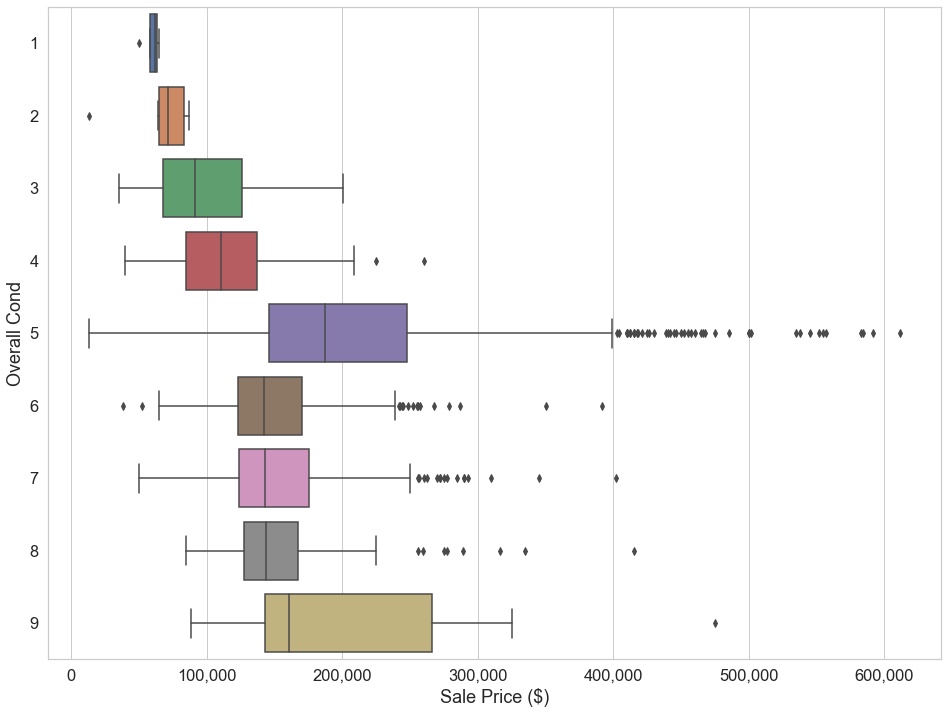

In [1004]:
# Box Plot
def cat_col_box_plot (column_name, dataset=df_ames, title="", orient='v', font_scale=1.5):
    sns.set(font_scale=font_scale, style='whitegrid')
    if(orient == "h"):
        plt.figure(figsize=(16,12))
        bp = sns.boxplot(y=column_name, x='saleprice', data=dataset, orient=orient)
        bp.set_ylabel(change_label_back(column_name), fontsize=18)
        bp.set_xlabel('Sale Price ($)', fontsize=18)
        bp.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))
    else:
        plt.figure(figsize=(16,8))
        bp = sns.boxplot(x=column_name, y='saleprice', data=dataset, orient=orient)
        bp.set_xlabel(change_label_back(column_name), fontsize=18)
        bp.set_ylabel('Sale Price ($)', fontsize=18)
        bp.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))

    if title != "":
        bp.set_title(title)
    
    return bp
cat_col_box_plot('overall_cond', orient='h')

In [1005]:
# Various kinds of categorical plots
def cat_plot (column_name, dataset=df_ames, title="", kind='swarm', font_scale=1.5, jitter=0, orient='v', height=25):
    sns.set(font_scale=font_scale)
    
    if (orient == 'h'):
        x_col = 'saleprice'
        y_col = column_name
    else:
        x_col = column_name
        y_col = 'saleprice'

   
    if jitter > 0:
        cp = sns.catplot(x=x_col, y=y_col, data=dataset, jitter=jitter, kind=kind, s=8, height=height, aspect=2.5, orient=orient)
    else:
        cp = sns.catplot(x=x_col, y=y_col, data=dataset, kind=kind, s=8, height=height, aspect=2.5, orient=orient)
    plt.xlabel(change_label_back(column_name))
    plt.ylabel('Sale Price')

 
    plt.grid(True)
    #bp.set_xlabel(column_name, fontsize=14)
    if title != "":
        bp.set_title(title)
    
    return bp


In [1006]:
df_ames.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,533352170,60,RL,68.0,13517,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,3,2010,WD,138500


In [1007]:
df_corr = pd.DataFrame(df_ames.corr()['saleprice'])

df_corr['abs_corr'] = abs(df_corr['saleprice'])
df_corr.sort_values(by='abs_corr', ascending=False)

,saleprice,abs_corr
saleprice,1.000000,1.000000
overall_qual,0.800207,0.800207
gr_liv_area,0.697038,0.697038
garage_area,0.649897,0.649897
garage_cars,0.647781,0.647781
total_bsmt_sf,0.629303,0.629303
1st_flr_sf,0.618486,0.618486
year_built,0.571849,0.571849
year_remod/add,0.550370,0.550370
full_bath,0.537969,0.537969


0.6970384443056634

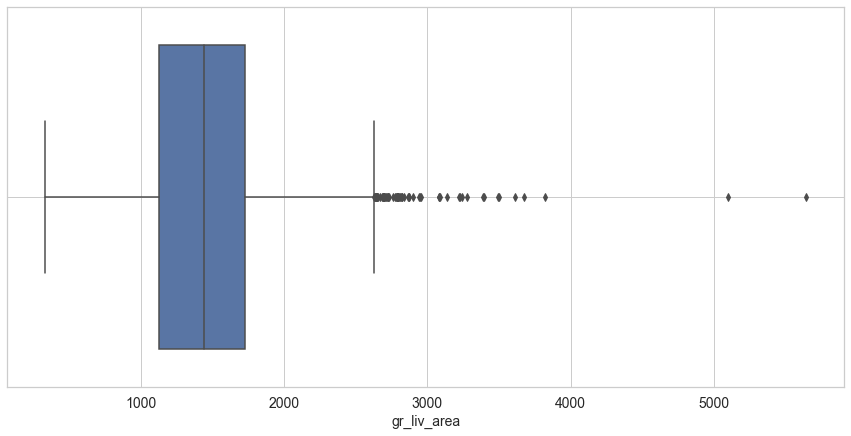

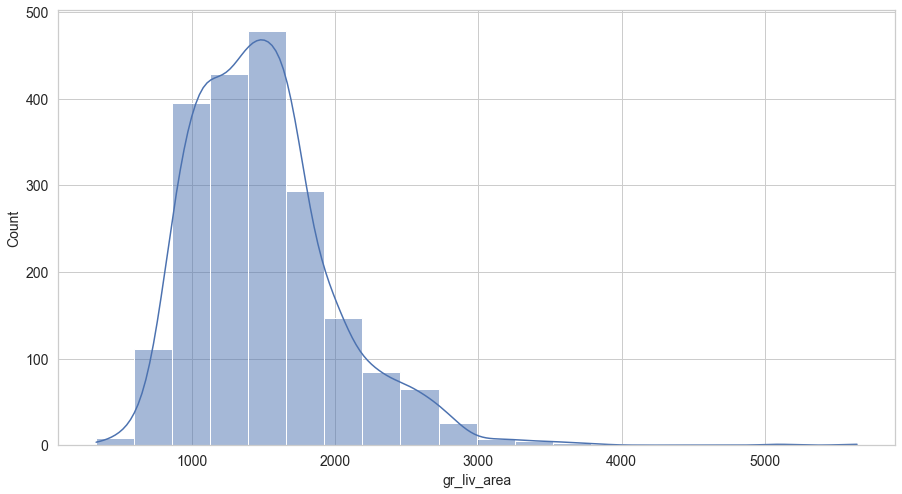

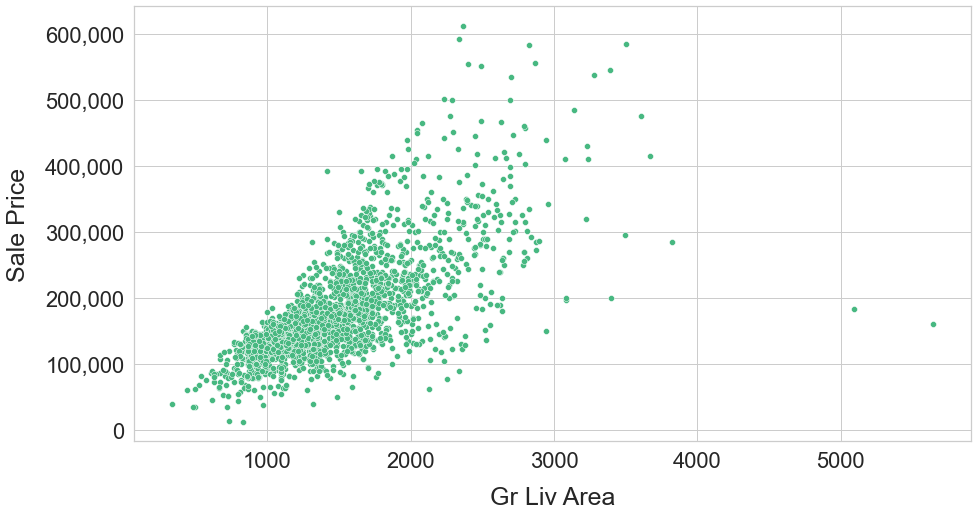

In [1008]:
# gr_liv_area - Boxplot to find outliers
bp = num_col_box_plot('gr_liv_area')

#Histogram to look at distribution
dp = num_col_dist_plot('gr_liv_area')

#Scatter Plot to look at distribution
sp = scatter_plot_with_saleprice('gr_liv_area', colour='#47B881')

df_ames['gr_liv_area'].corr(df_ames['saleprice'])


In [1009]:
df_ames[df_ames['gr_liv_area'] >= 4000]['saleprice']

960     160000
1885    183850
Name: saleprice, dtype: int64

In [1010]:
# As instructed in the Special Notes we remove all rows with ground living area greater than 
# 4000 as these rows are outliers. These could likely be unusual or partial sales, as they are very large houses with relatively reasonable prices.


df_ames.drop(df_ames.index[df_ames['gr_liv_area'] >= 4000], inplace=True)

0.3382803680506222


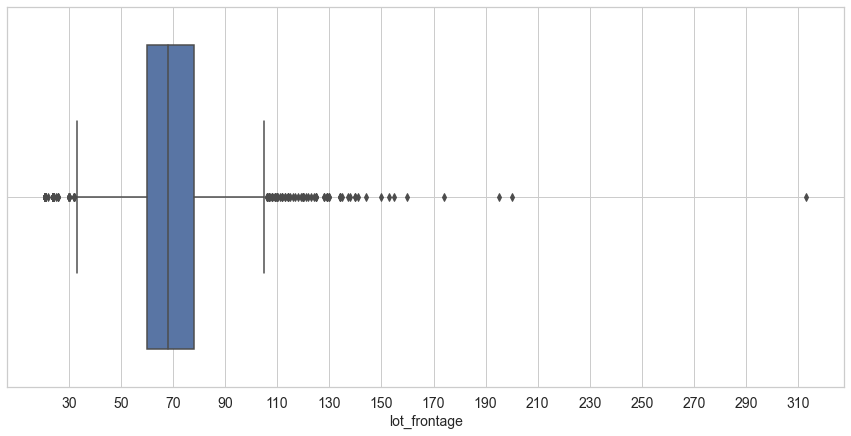

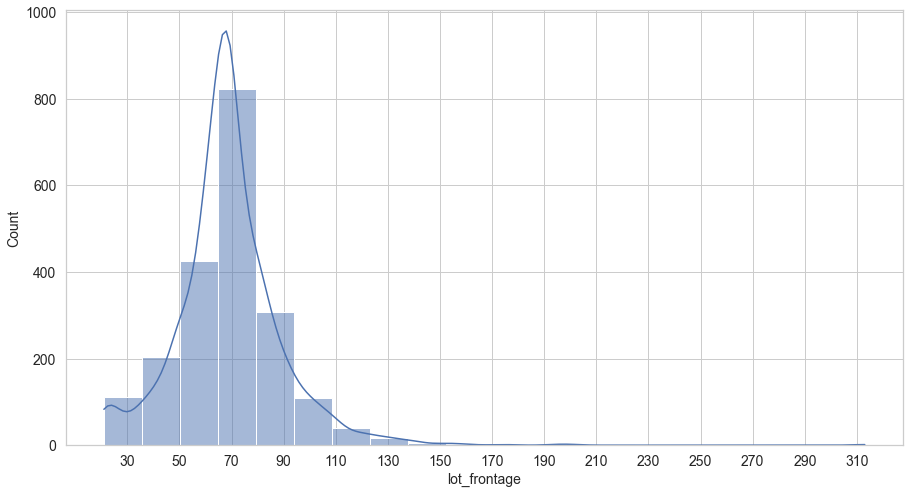

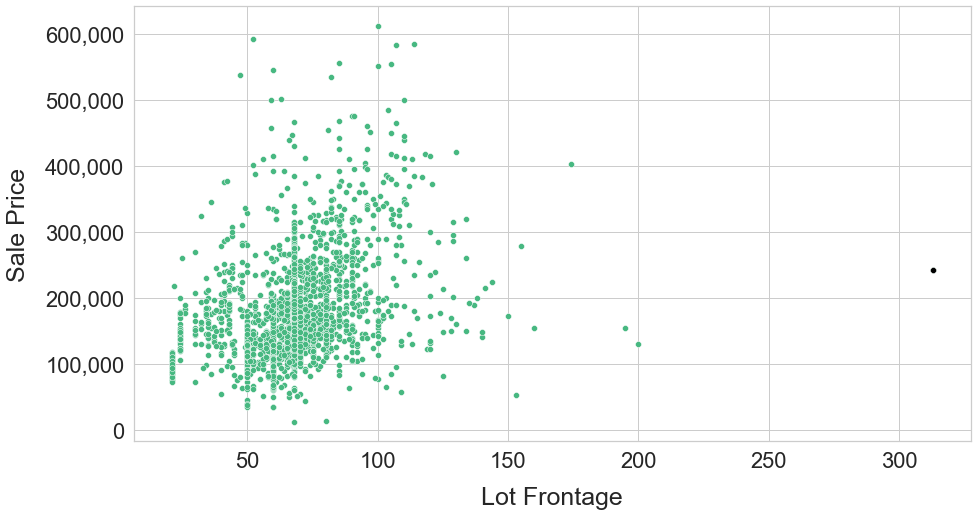

In [1011]:
# Linear feet of street connected to property
# lot_frontage - Boxplot to find outliers
bp = num_col_box_plot('lot_frontage')
bp.set_xticks(range(30, 320, 20))

#lot_frontage - Histogram to look at distribution
dist = num_col_dist_plot('lot_frontage', )
dist.set_xticks(range(30, 320, 20))

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('lot_frontage', colour="#47b881", outlier_dataset=df_ames[df_ames['lot_frontage'] > 300])

# check correlation
print(df_ames['lot_frontage'].corr(df_ames['saleprice']))

**Boxplot Interpretation:**
The box plot shows that values for lot_frontage lie within the range of  30 to 105. The interquartile range shows that most houses have lot_frontage between 60 and 80 square feet (Inter Quartile Range) and the median lot_frontage is around 68 square feet. 

Values above and below 30 and 105 range are being considered as outliers. However we see a high number of data points being considered outliers, which seem to be valid values.  It's not possible to identify if these data points are indeed incorrect data, just by looking at the data set. The scatter plot also indicates that although these data points are sparse they could be valid data points. Hence we accept most of these outliers as valid data. We only consider the data point above 300 to be the outlier. 

**Scatter Plot & Correlation:**
The scatter plot shows that there is moderate correlation between the lot_frontage and the sales price, the pearson's coeeficient is 0.34. 

In [1012]:
df_ames.drop(df_ames[df_ames['lot_frontage'] > 300].index, inplace=True)
print(df_ames['lot_frontage'].corr(df_ames['saleprice']))

0.3460162877447855


0.3033201807862675


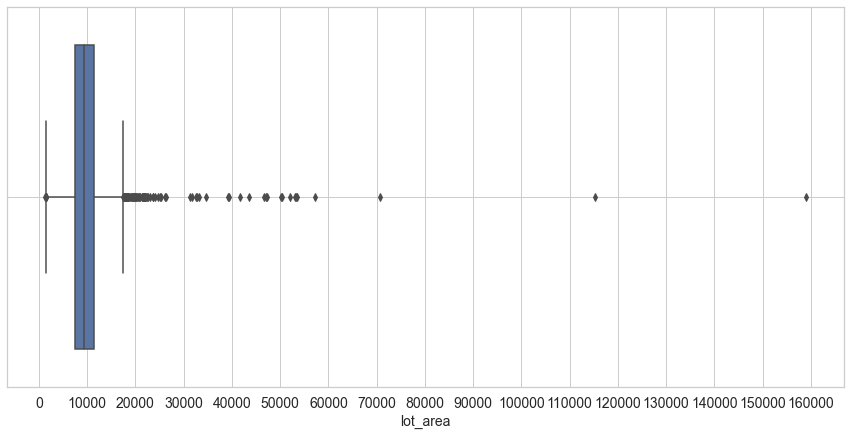

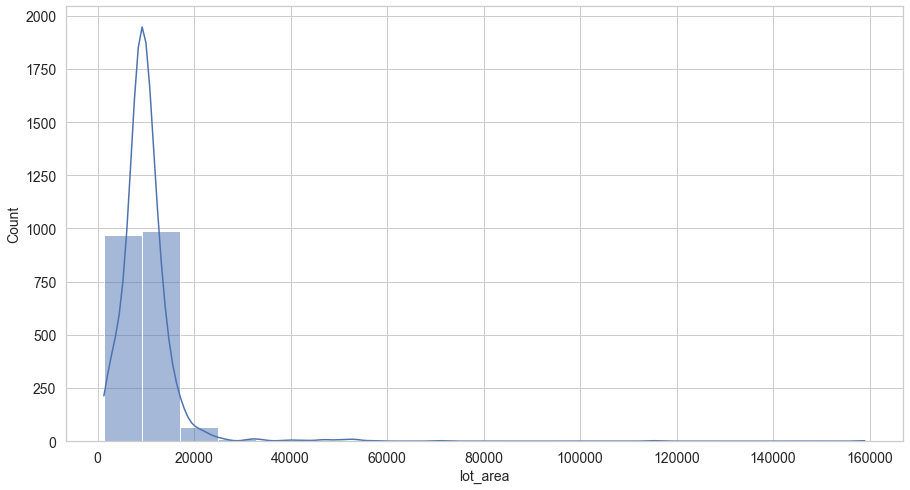

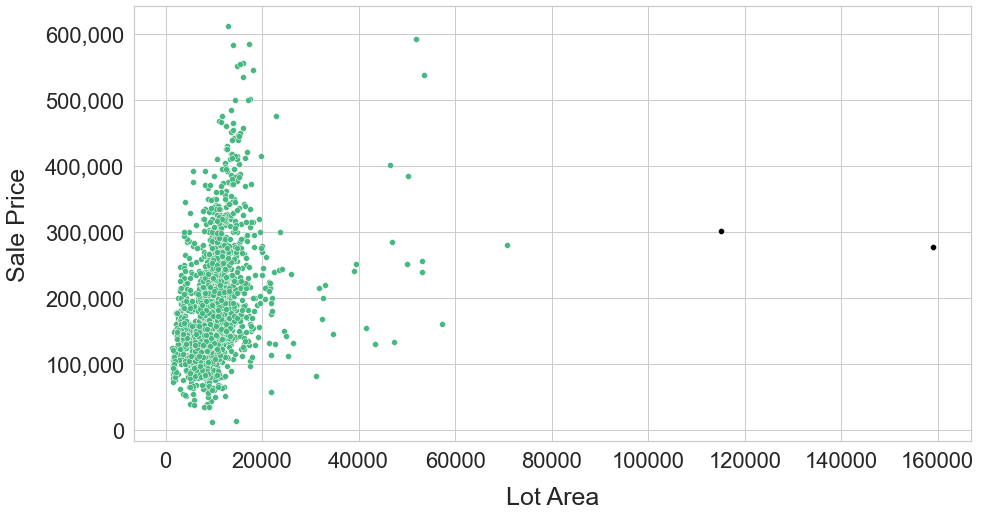

In [1013]:
# lot_area - Lot size in square feet

# Boxplot to find outliers
bp = num_col_box_plot('lot_area')
bp.set_xticks(range(0, 170000, 10000))

#Histogram to look at distribution
num_col_dist_plot('lot_area')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('lot_area', colour="#47B881", outlier_dataset=df_ames[df_ames['lot_area'] > 100000])

# check correlation
print(df_ames['lot_area'].corr(df_ames['saleprice']))

**Boxplot Interpretation:** The box plot shows that values for **lot_area** lie within the range of 2000 to 17000. Values above and below this range are being considered as outliers. The interquartile range shows that most houses have lot_area between 8000 and 12000 square feet (Inter Quartile Range) and the median lot_area is around 9000 square feet. 

However we see a high number of data points being considered outliers. After examining the outlier range, these seem to be valid values.  It's not possible to identify if these data points are indeed incorrect data, just by looking at the data set. The scatter plot also indicates that although these data points are sparse they could be valid data points. Hence we accept most of these outliers as valid data, except lot_area > 60000.

**Scatter Plot & Correlation**
The scatter plot shows that there is moderate correlation between the lot_area and the sales price, the pearson's coeeficient is 0.30.

In [1014]:
# We consider the values above 60000 to be outliers
print(len(df_ames[df_ames['lot_area'] > 100000]))
df_ames.drop(df_ames[df_ames['lot_area'] > 100000].index, inplace=True)
print(print(df_ames['lot_area'].corr(df_ames['saleprice'])))

2
0.3517380174138158
None


0.5734921806827272


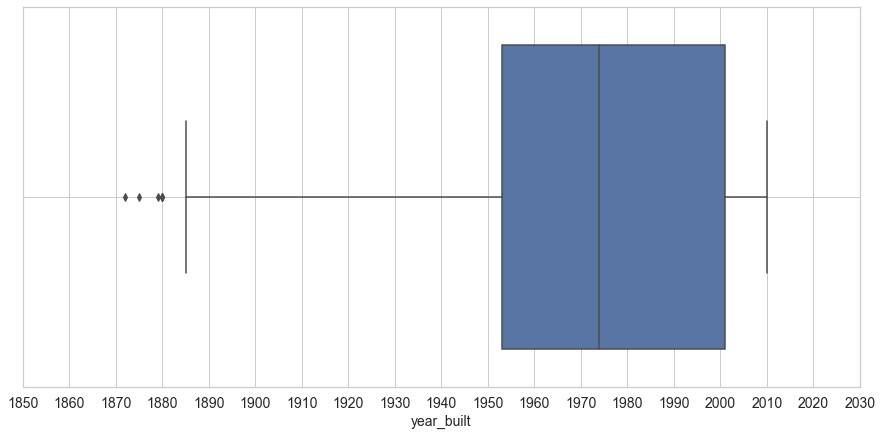

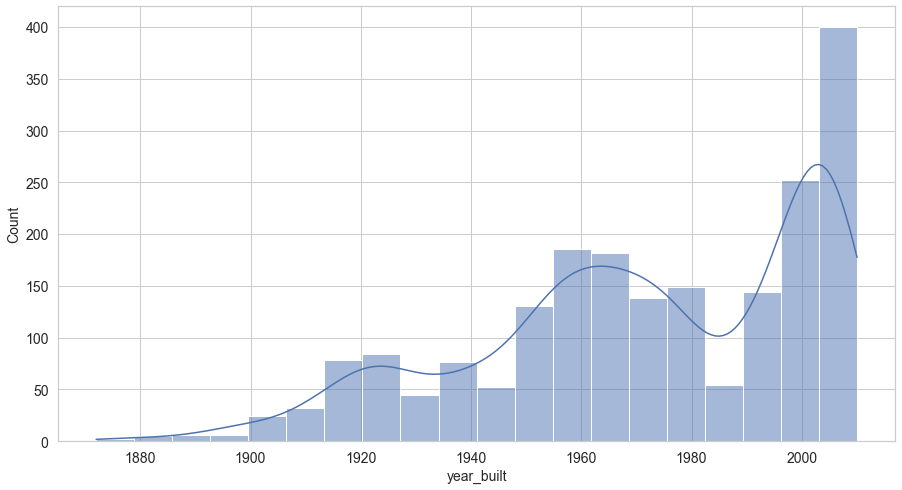

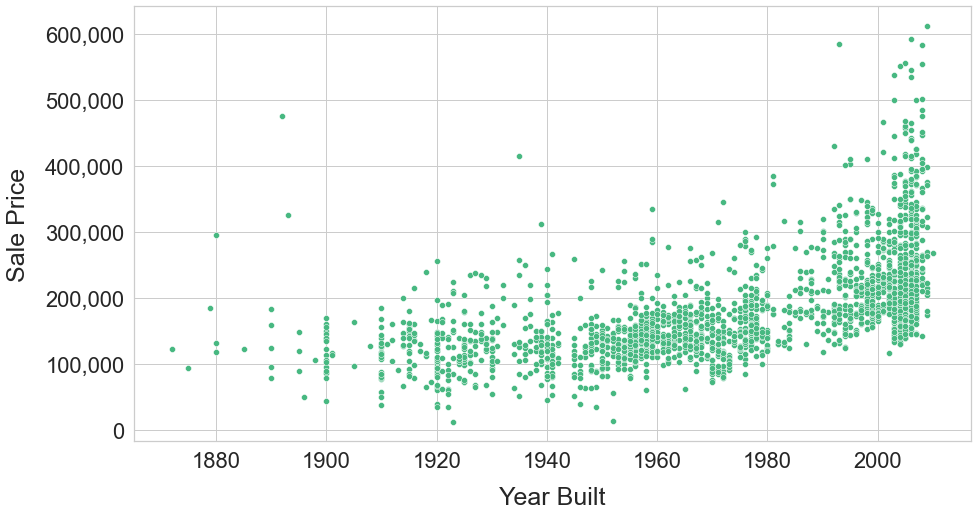

In [1015]:
# year_built - Original construction date
# Boxplot to find outliers
bp = num_col_box_plot('year_built')
bp.set_xticks(range(1850, 2040, 10))

#lot_frontage - Histogram to look at distribution
num_col_dist_plot('year_built')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('year_built', colour="#47b881")

# Most onservations are in the range 1880 to 2000. Hence even though some observations are a little below 1880, 
# we don't consider them as outliers

# check correlation
print(df_ames['year_built'].corr(df_ames['saleprice']))


**Boxplot Interpretation:** The box plot shows that values for **year_built** lie within the range of 1872 to 2010. Values above and below this range are being considered as outliers. The interquartile range shows that most houses were built between 1952 and 2002 (Inter Quartile Range) and the median year_built is around 1972.<br>

However we see a high number of data points being considered outliers. After examining the outlier range, the data points less than 1872 seem to be valid values. The scatter plot also indicates that although these data points are sparse they could be valid data points. Hence we accept these outliers as valid data.

**Scatter Plot & Correlation:** The scatter plot shows that there is a high correlation between the year_built and the sales price, the pearson's coeeficient is 0.57.

0.5502091594716757


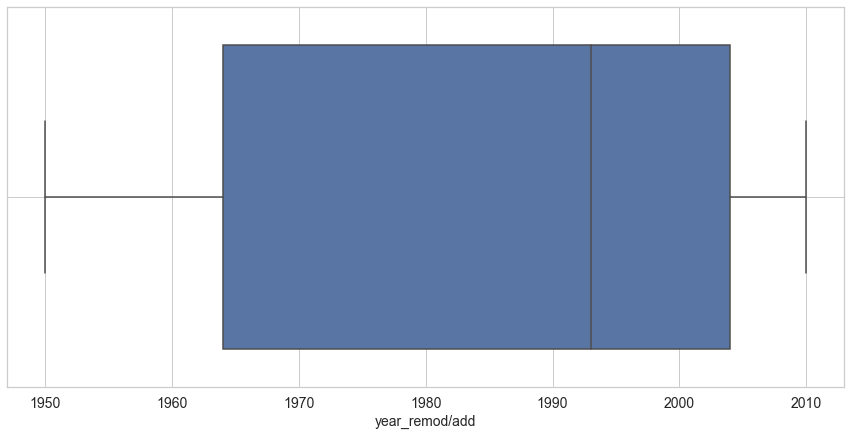

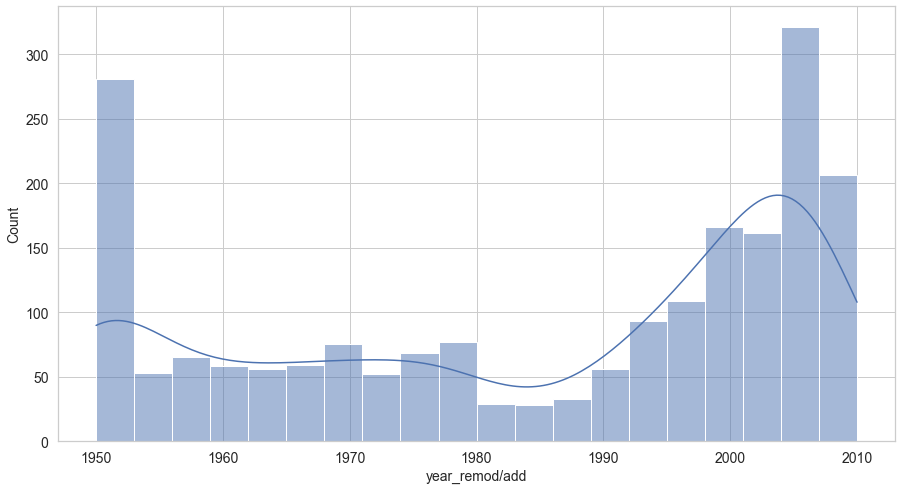

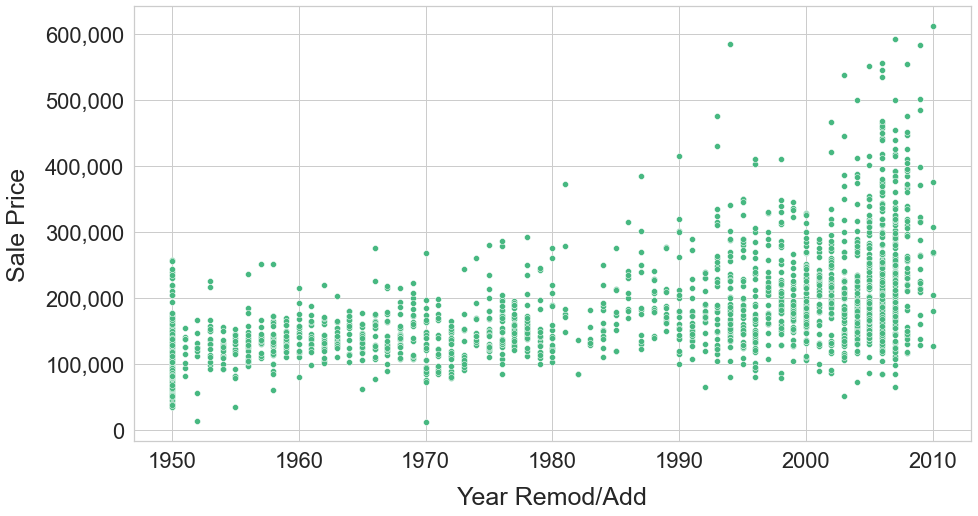

In [1016]:
# year_remod/add - Boxplot to find outliers
bp = num_col_box_plot('year_remod/add')

#Histogram to look at distribution
num_col_dist_plot('year_remod/add')

#Scatter Plot to look at correlation
scatter_plot_with_saleprice('year_remod/add', colour='#47B881')

print(df_ames['year_remod/add'].corr(df_ames['saleprice']))

**Boxplot Interpretation:** The box plot shows that values for **year_remod/add** lie within the range of 1950 to 2010. There are no outliers found. The interquartile range shows that most houses were built between 1964 to 2005 (Inter Quartile Range) and the median year_remod/add is around 1993.<br>

**Scatter Plot & Correlation:** The scatter plot shows that there is a high correlation between the year_remod/add and the sales price, the pearson's coeeficient is 0.55.

0.8038165887580123


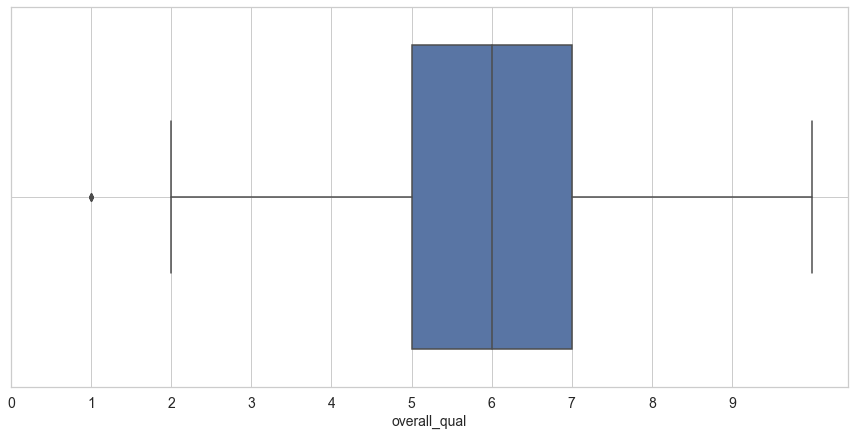

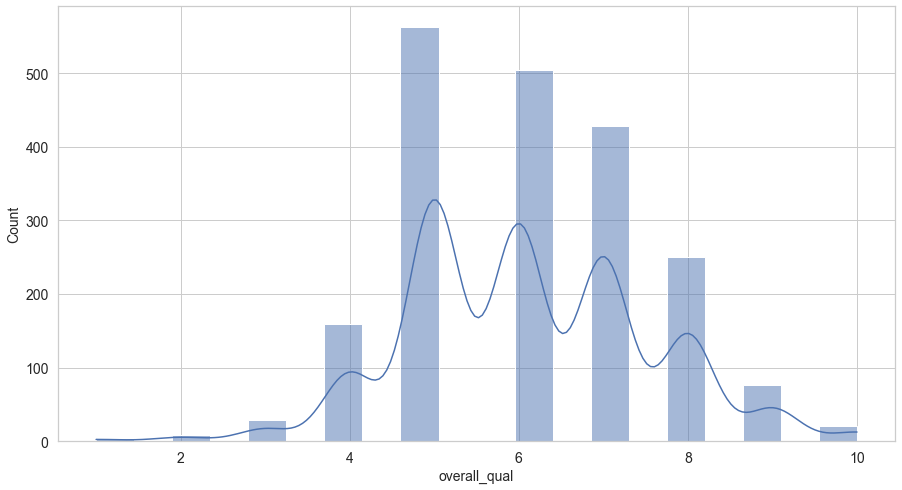

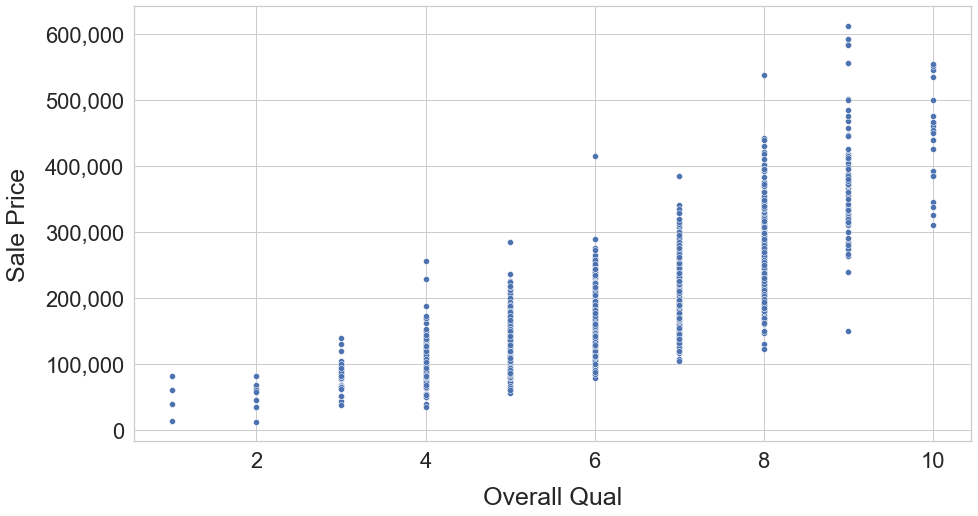

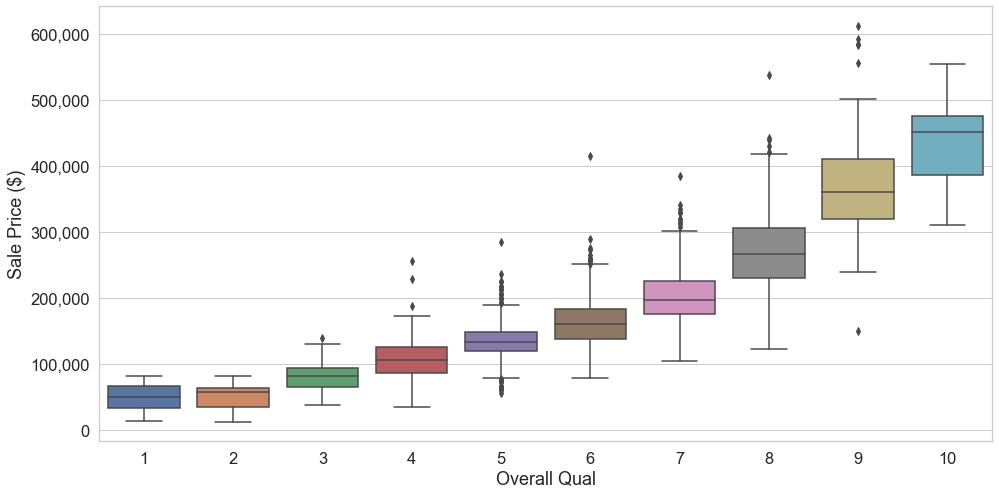

In [1017]:
# overall_qual - Boxplot to find outliers
bp = num_col_box_plot('overall_qual')
bp.set_xticks(range(0, 10, 1))

#Histogram to look at distribution
num_col_dist_plot('overall_qual')

#Scatter Plot to look at correlation
scatter_plot_with_saleprice('overall_qual')

cat_col_box_plot('overall_qual')

print(df_ames['overall_qual'].corr(df_ames['saleprice']))

**Boxplot Interpretation:** The box plot shows that values for **overall_qual (Rates the overall material and finish of the house)** lie within the range of 1 to 10. Data points above and below this range are considered outliers. The interquartile range shows that most houses have overall_qual lie between 5 and 7 and the median overall_qual is around 6. 

The only data points considered outlier have value 1. Thus the outliers may actually be valid data points. The scatter plot also indicates that although these data points are scarce they could be valid data points. Hence we accept these outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a high degree of correlation between the overall quality and the sales price, the pearson's coeeficient is 0.8.

-0.09815812002733666


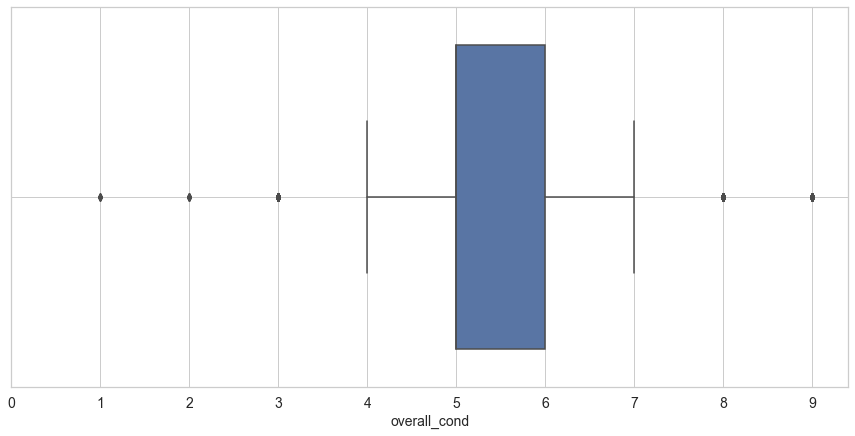

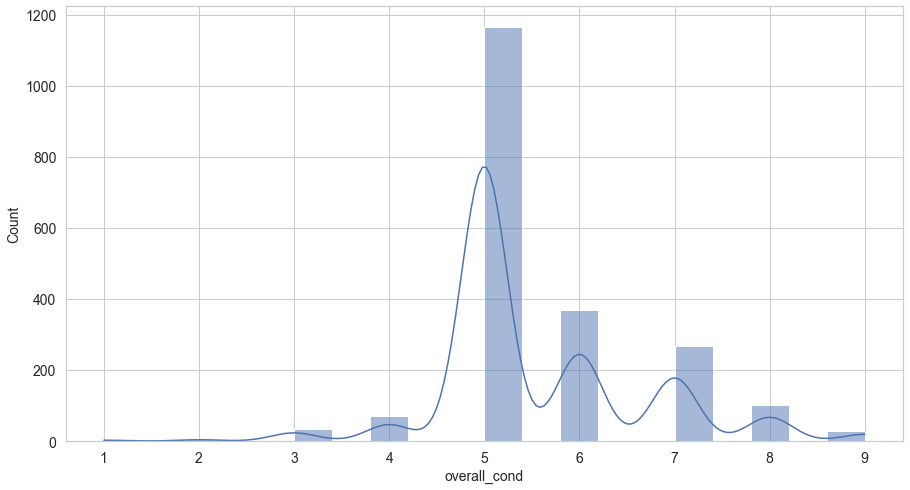

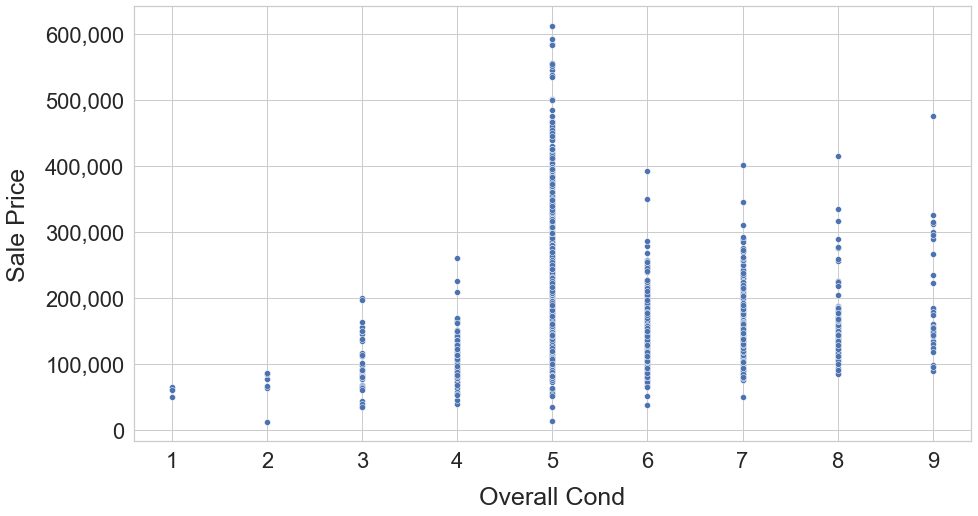

In [1018]:
# overall_cond - Boxplot to find outliers
bp = num_col_box_plot('overall_cond')
bp.set_xticks(range(0, 10, 1))

#Histogram to look at distribution
num_col_dist_plot('overall_cond')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('overall_cond')

print(df_ames['overall_cond'].corr(df_ames['saleprice']))

**Boxplot Interpretation:** The box plot shows that values for **overall_cond (Rates the overall condition of the house)** lie within the range of 4 to 7. Data points above and below this range are considered outliers. The interquartile range shows that most houses have overall_qual lie between 5 and 6 and the median overall_qual is around 5. 

The overall condition can range between 1 and 10, hence the outliers from the boxplots may actually be valid data points. Hence we accept these outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a very weak negative correlation between the overall quality and the sales price, the pearson's coeeficient is -0.1.

0.5105529352122068


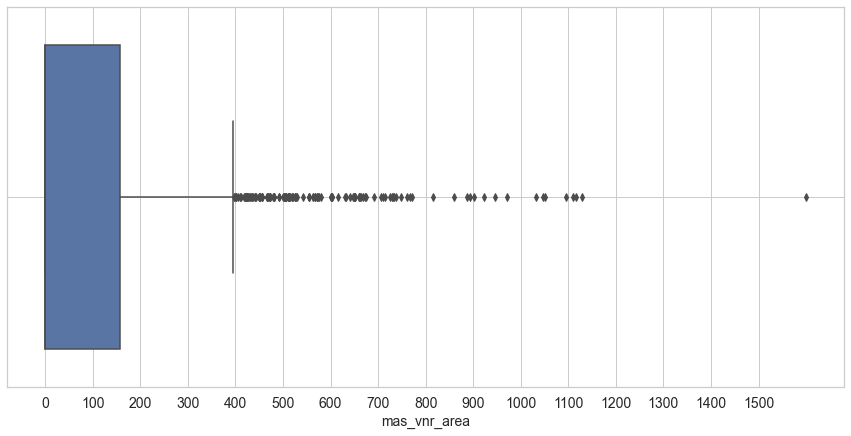

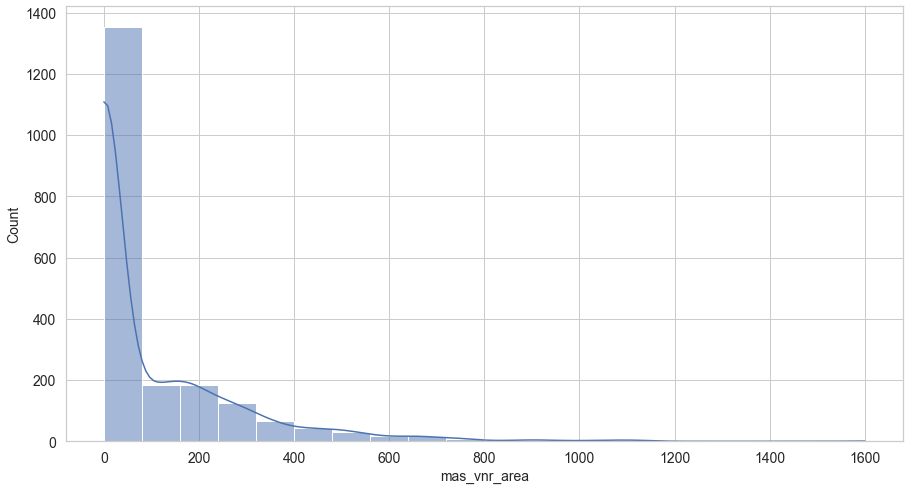

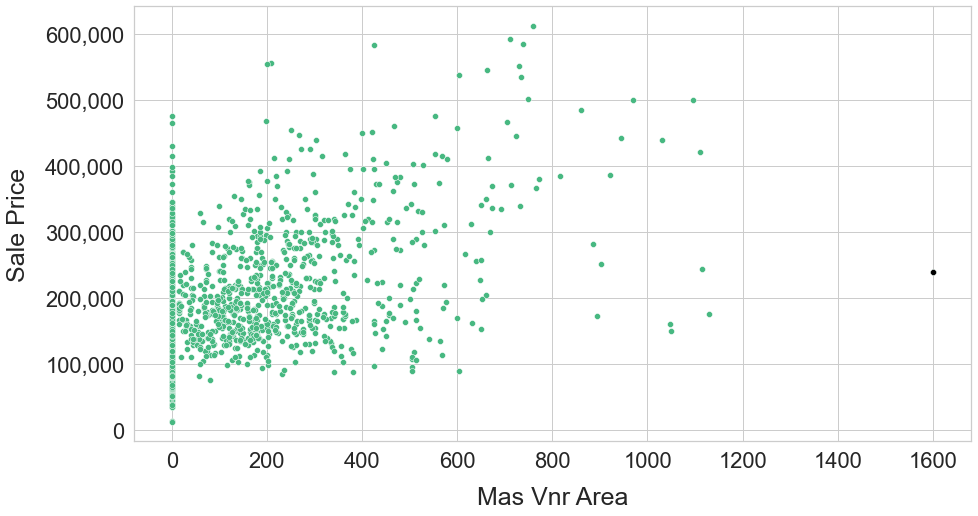

In [1019]:
# mas_vnr_area - Masonry veneer area in square feet
# Boxplot to find outliers
bp = num_col_box_plot('mas_vnr_area')
bp.set_xticks(range(0, 1600, 100))

#lot_frontage - Histogram to look at distribution
num_col_dist_plot('mas_vnr_area')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('mas_vnr_area', colour='#47B881', outlier_dataset=df_ames[df_ames['mas_vnr_area'] > 1500])

# check correlation
print(df_ames['mas_vnr_area'].corr(df_ames['saleprice']))


**Boxplot Interpretation:** The box plot shows that values for **mas_vnr_area (Masonry veneer area in square feet)** lie within the range of 0 to 400 sq feet. Values above and below this range are being considered as outliers. The interquartile range shows that most houses have lot_area between 0 and 170 square feet and the median mas_vnr_area is around 0 square feet. 

However we see a high number of data points being considered outliers. It's not possible to identify if these data points are indeed incorrect data, just by looking at the data set. The scatter plot also indicates that although these data points are sparse they could be valid data points. Hence we accept most of these outliers as valid data, except lot_area > 1500.

**Scatter Plot & Correlation**
The scatter plot shows that there is high correlation between the mas_vnr_area and the sales price, the pearson's coeeficient is 0.51.

In [1020]:
print(len(df_ames[df_ames['mas_vnr_area'] > 1500]))

df_ames.drop(df_ames[df_ames['mas_vnr_area'] > 1500].index, inplace=True)

print(df_ames['mas_vnr_area'].corr(df_ames['saleprice']))


1
0.5172813969969221


0.4452127346458157


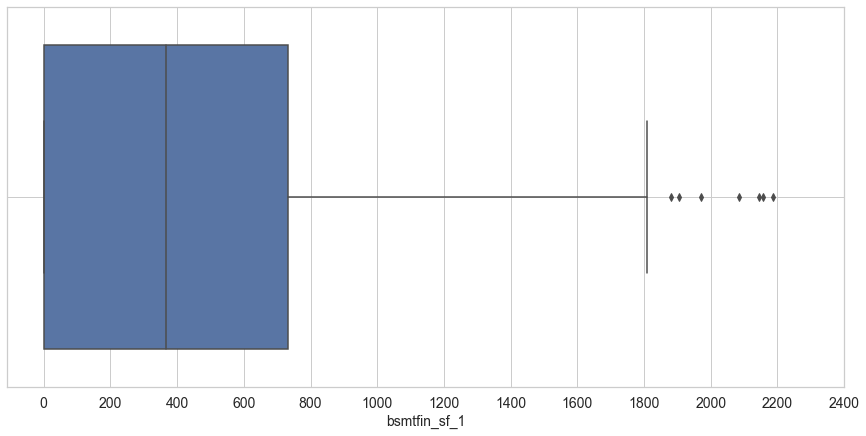

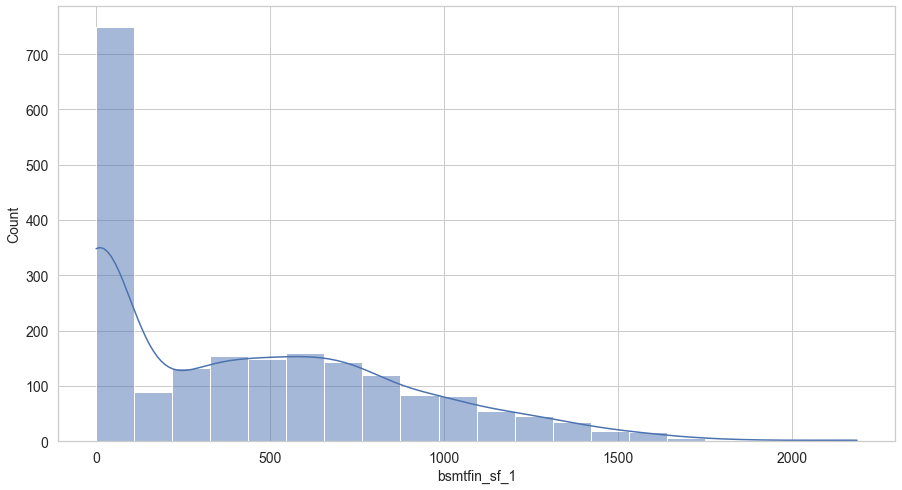

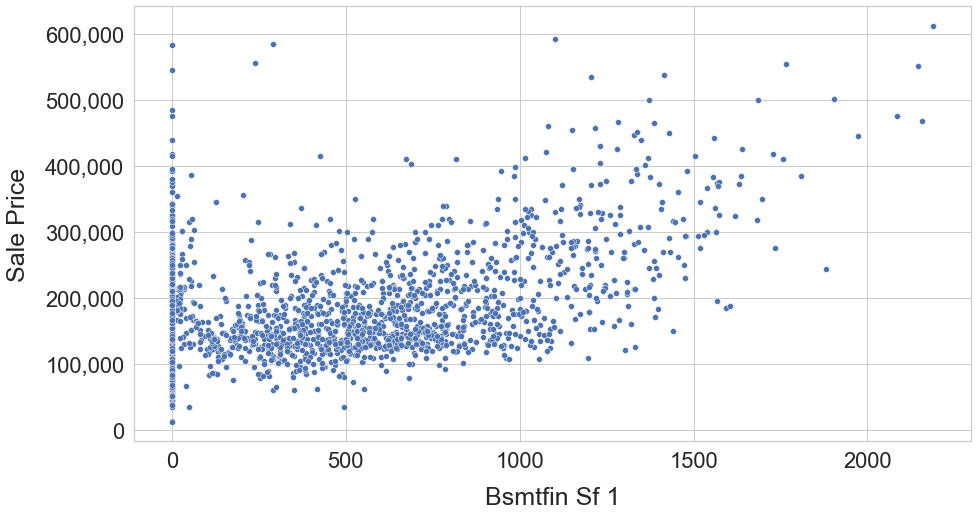

In [1021]:
# bsmtfin_sf_1 - Boxplot to find outliers
bp = num_col_box_plot('bsmtfin_sf_1')
bp.set_xticks(range(0, 2500, 200))


#bsmtfin_sf_1 - Histogram to look at distribution
num_col_dist_plot('bsmtfin_sf_1')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('bsmtfin_sf_1')

# check correlation
print(df_ames['bsmtfin_sf_1'].corr(df_ames['saleprice']))


**Boxplot Interpretation:** The box plot shows that values for **bsmtfin_sf_1 (Type 1 finished square feet)** lie within the range of 0 to 1800 sq feet. Values above and below this range are being considered as outliers. The interquartile range shows that most houses have lot_area between 0 and 740 square feet and the median bsmtfin_sf_1 is around 380 square feet. 

The outliers identified are not too far off from the actual points, it's not possible to identify if the outlier data points are indeed incorrect data, just by looking at the data set. The scatter plot also indicates that although these data points are sparse they could be valid data points. Hence we accept these outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is moderate correlation between the bsmtfin_sf_1 and the sales price, the pearson's coeeficient is 0.45.

0.01701945228743172


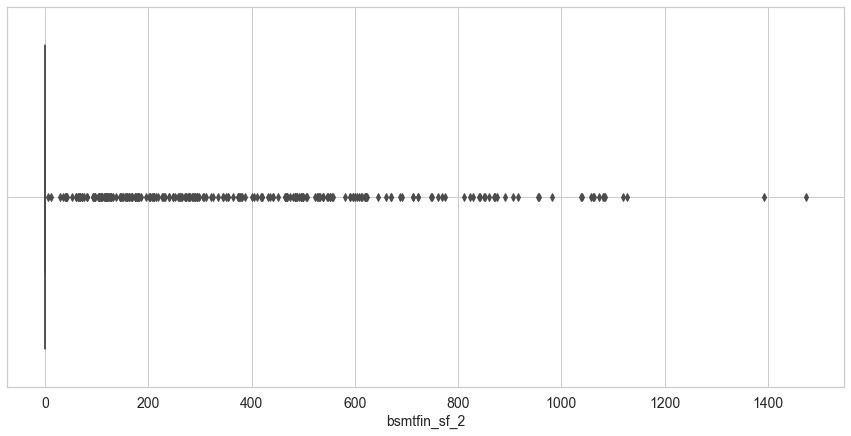

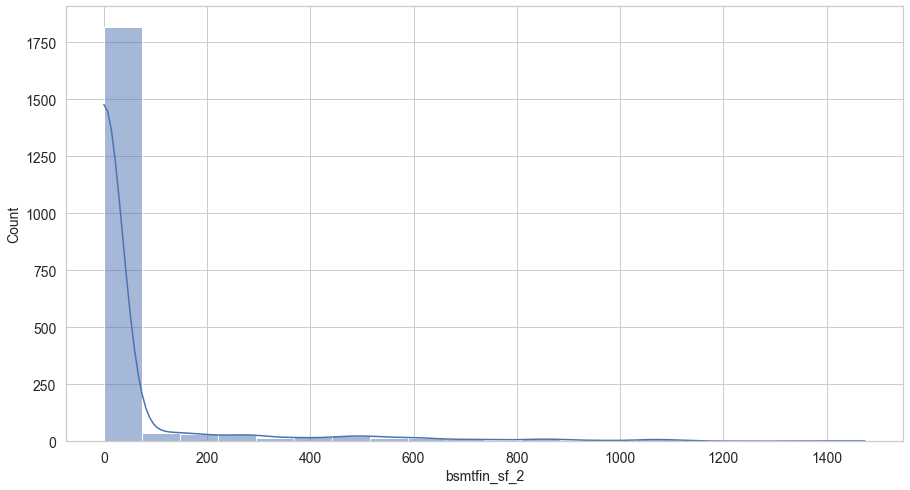

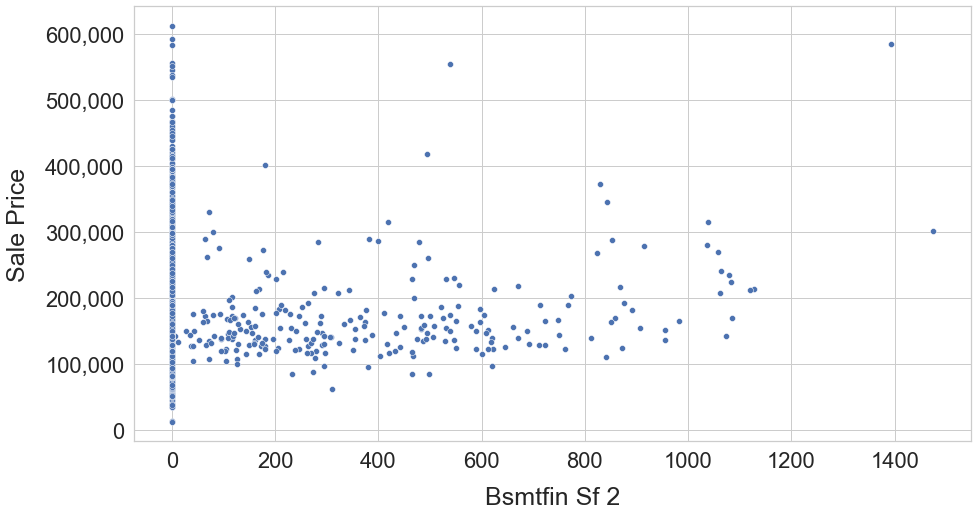

In [1022]:
# lot_area - Boxplot to find outliers
bp = num_col_box_plot('bsmtfin_sf_2')
bp.set_xticks(range(0, 1500, 200))

#Histogram to look at distribution
num_col_dist_plot('bsmtfin_sf_2')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('bsmtfin_sf_2')

print(df_ames['bsmtfin_sf_2'].corr(df_ames['saleprice']))


In [1023]:
df_ames['bsmtfin_sf_2'].value_counts()

0.0      1798
294.0       5
162.0       3
483.0       3
180.0       3
         ... 
174.0       1
154.0       1
278.0       1
230.0       1
259.0       1
Name: bsmtfin_sf_2, Length: 205, dtype: int64

**Boxplot Interpretation:** The box plot shows that values for **bsmtfin_sf_2 (Type 2 finished square feet)** lie within the range of 0 to 1500 sq feet. However most datapoints have value 0 (also demonstrated by value counts). Values above 0 are being considered as outliers. The interquartile range shows that most houses have bsmtfin_sf_2 equal to 0 and the median bsmtfin_sf_2 is around 0 square feet. 

This variable only seems to have data if a house ha two different types of finishes in the basement. Thus the outliers may actually be valid data points. The scatter plot also indicates that although these data points could be valid data points. Hence we accept these outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a very low degree of correlation between the bsmtfin_sf_2 and the sales price, the pearson's coeeficient is 0.02.

In [1024]:
df_ames_nums.iloc[:, np.r_[0:10]]

,lot_frontage,lot_area,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,bsmtfin_sf_1,bsmtfin_sf_2,bsmt_unf_sf
0,68.0,13517,6,8,1976,2005,289.0,533.0,0.0,192.0
1,43.0,11492,7,5,1996,1997,132.0,637.0,0.0,276.0
2,68.0,7922,5,7,1953,2007,0.0,731.0,0.0,326.0
3,73.0,9802,5,5,2006,2007,0.0,0.0,0.0,384.0
4,82.0,14235,6,8,1900,1993,0.0,0.0,0.0,676.0
...,...,...,...,...,...,...,...,...,...,...
2046,79.0,11449,8,5,2007,2007,0.0,1011.0,0.0,873.0
2047,68.0,12342,4,5,1940,1950,0.0,262.0,0.0,599.0
2048,57.0,7558,6,6,1928,1950,0.0,0.0,0.0,896.0
2049,80.0,10400,4,5,1956,1956,0.0,155.0,750.0,295.0


0.1917125484223637

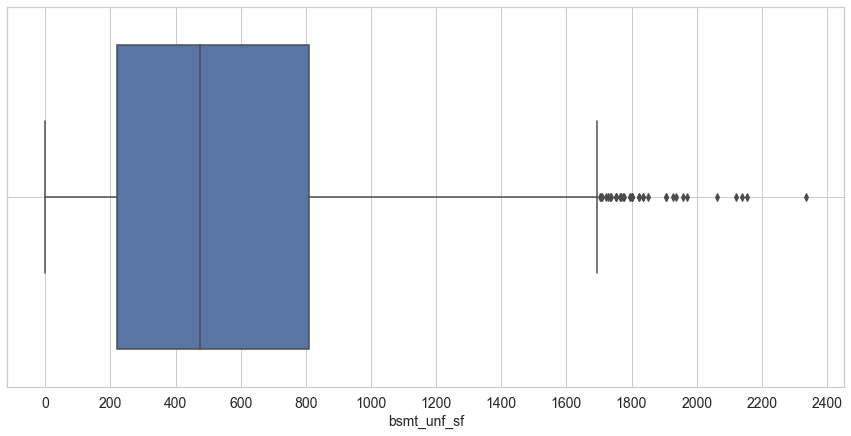

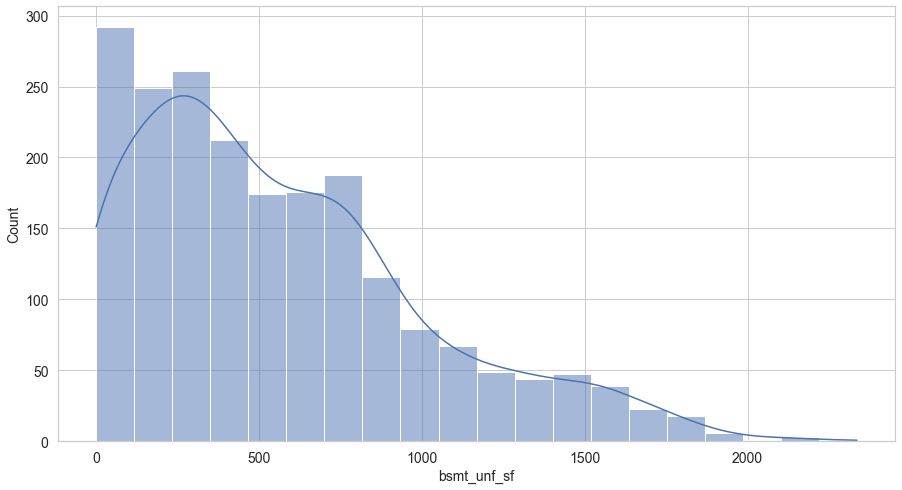

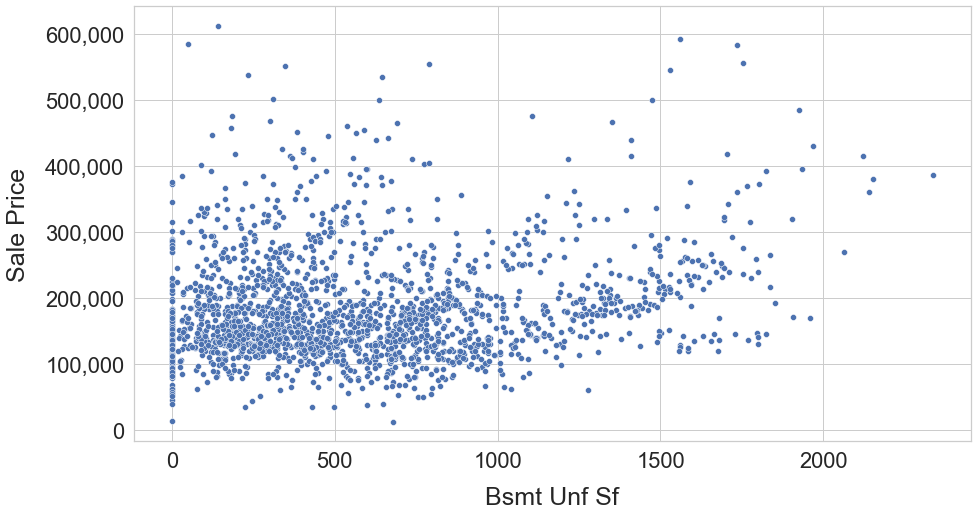

In [1025]:
# bsmt_unf_sf Unfinished square feet of basement area - Boxplot to find outliers
bp = num_col_box_plot('bsmt_unf_sf')
bp.set_xticks(range(0, 2500, 200))

#Histogram to look at distribution
num_col_dist_plot('bsmt_unf_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('bsmt_unf_sf')

df_ames['bsmt_unf_sf'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for **bsmt_unf_sf (Unfinished square feet of basement area)** lie within the range of 0 to 1700 sq feet. Values outside this range are being considered as outliers. The interquartile range shows that most houses have unfinished basement area between 210 to 810 sq feet and the median bsmt_unf_sf is around 480 square feet. 

However there are many data points which are categorise by the box plot as outliers. Thus the outliers may actually be valid data points. The scatter plot also indicates that although these data points could be valid data points. Hence we accept these outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the bsmtfin_sf_2 and the sales price, the pearson's coeeficient is 0.19. This could be because basements with high unfinished area have a bigger basement area in general. 


0.6654641533374095

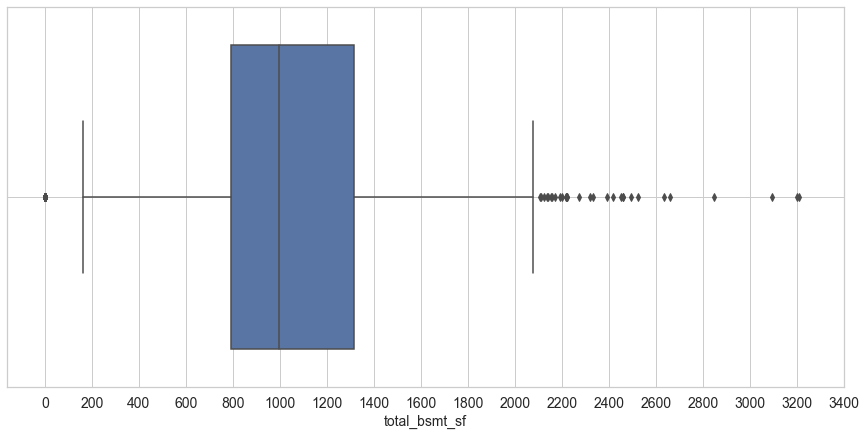

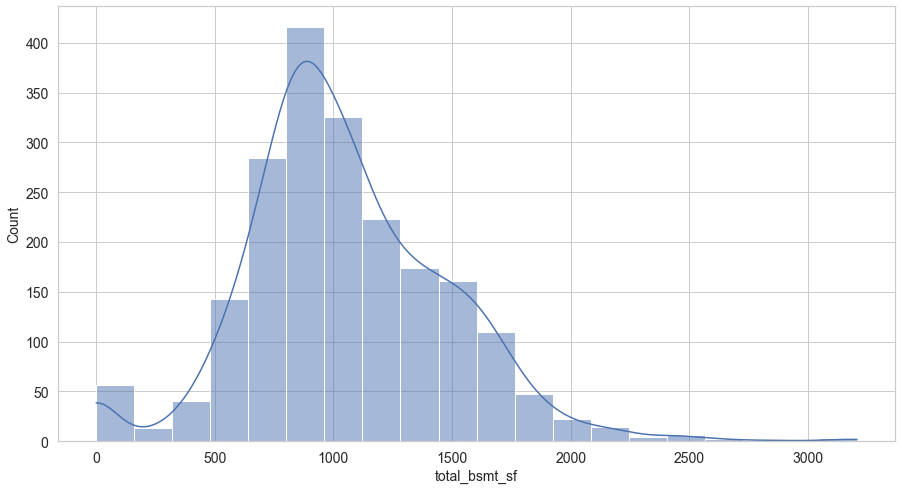

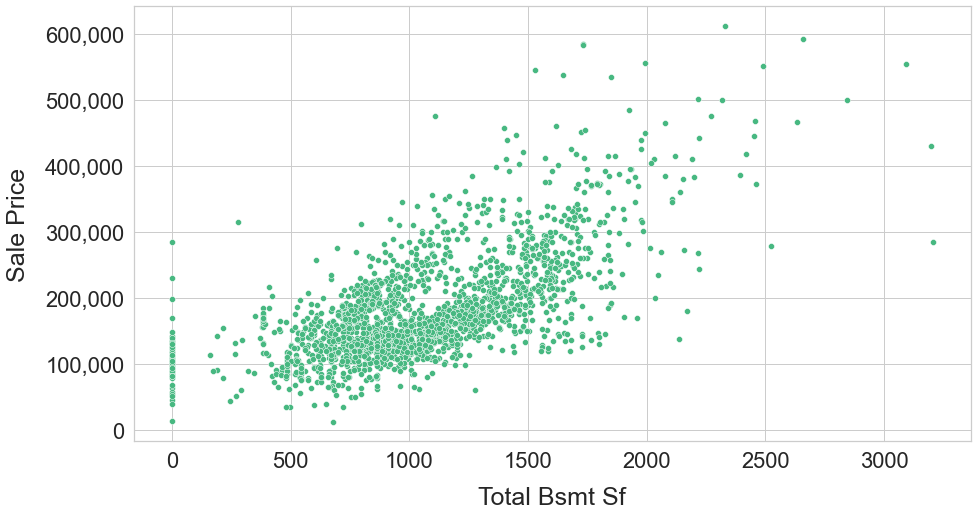

In [1026]:
# total_bsmt_sf - Boxplot to find outliers
bp = num_col_box_plot('total_bsmt_sf')
bp.set_xticks(range(0, 3500, 200))

#Histogram to look at distribution
num_col_dist_plot('total_bsmt_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('total_bsmt_sf', colour="#47B881")

df_ames['total_bsmt_sf'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for **total_bsmt_sf (Total square feet of basement area)** lie within the range of 180 to 2080 sq feet. Values outside this range are being considered as outliers. The interquartile range shows that most houses have unfinished basement area between 800 to 1320 sq feet and the median total_bsmt_sf is around 1000 square feet. 

However there are many data points which are categorise by the box plot as outliers. Thus the outliers may actually be valid data points. The scatter plot also indicates that although these data points are scarce could be valid data points. Hence we accept the outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a high degree of correlation between the Total square feet of basement area and the sales price, the pearson's coeeficient is 0.66. 

0.6480829193454273

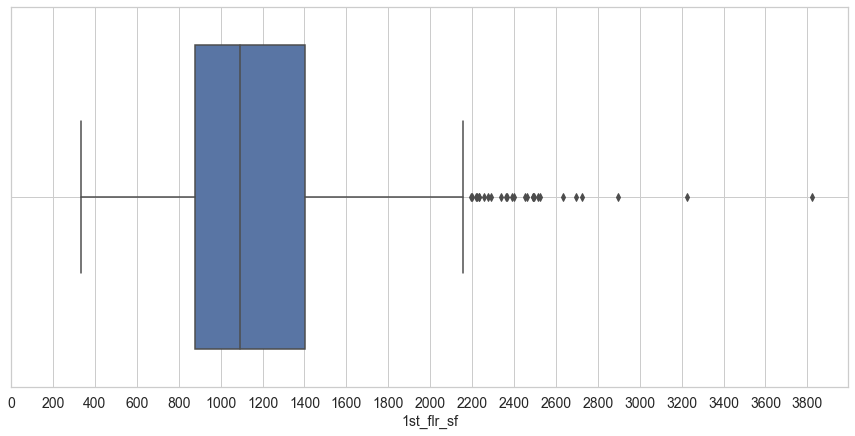

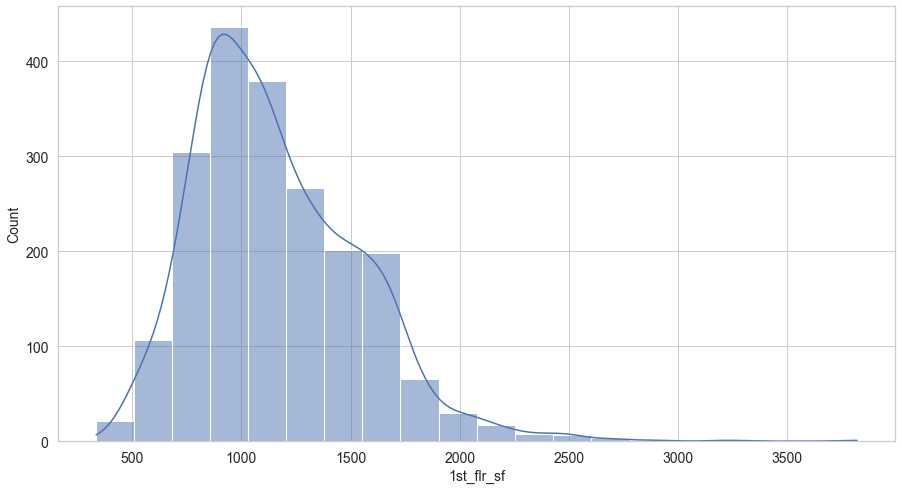

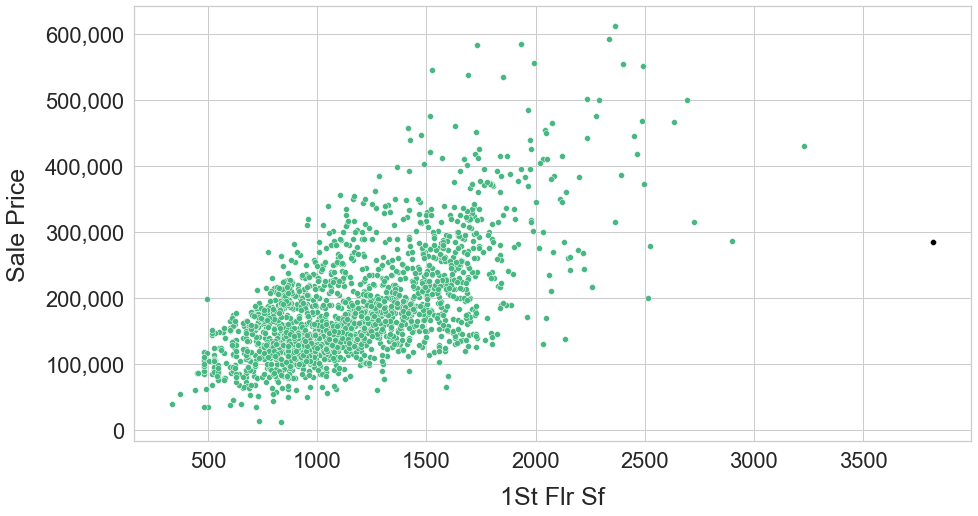

In [1027]:
# 1st_flr_sf - Boxplot to find outliers
bp = num_col_box_plot('1st_flr_sf')
bp.set_xticks(range(0, 4000, 200))

#Histogram to look at distribution
num_col_dist_plot('1st_flr_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('1st_flr_sf', colour="#47B881", outlier_dataset=df_ames[df_ames['1st_flr_sf'] > 3800])

df_ames['1st_flr_sf'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for **1st_flr_sf (First Floor square feet)** lie within the range of 260 to 2180 sq feet. Values outside this range are being considered as outliers. The interquartile range shows that most houses have unfinished basement area between 840 to 1400 sq feet and the median total_bsmt_sf is around 1300 square feet. 

However there are many data points which are categorised by the box plot as outliers. Thus the outliers may actually be valid data points. The scatter plot also indicates that although these data points are scarce, they could be valid data points. Hence we accept most outliers as valid data except with values greater than 3500.

**Scatter Plot & Correlation**
The scatter plot shows that there is a high degree of correlation between the Total square feet of basement area and the sales price, the pearson's coeeficient is 0.65. 

In [1028]:
# We consider the values above 3500 to be outliers

df_ames[df_ames['1st_flr_sf'] > 3800]['1st_flr_sf']

616    3820
Name: 1st_flr_sf, dtype: int64

In [1029]:
print(len(df_ames[df_ames['1st_flr_sf'] > 3800]))
df_ames.drop(df_ames[df_ames['1st_flr_sf'] > 3800].index, inplace=True)
print(df_ames['1st_flr_sf'].corr(df_ames['saleprice']))

1
0.6517902262169837


0.24982687940748577

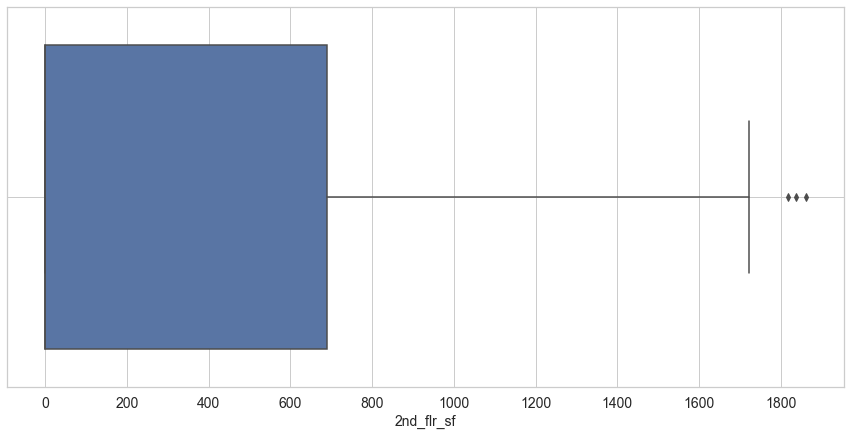

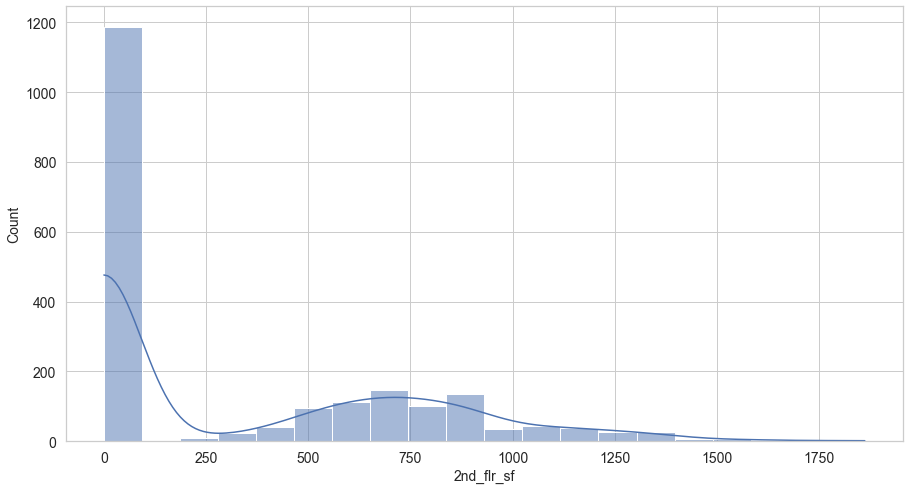

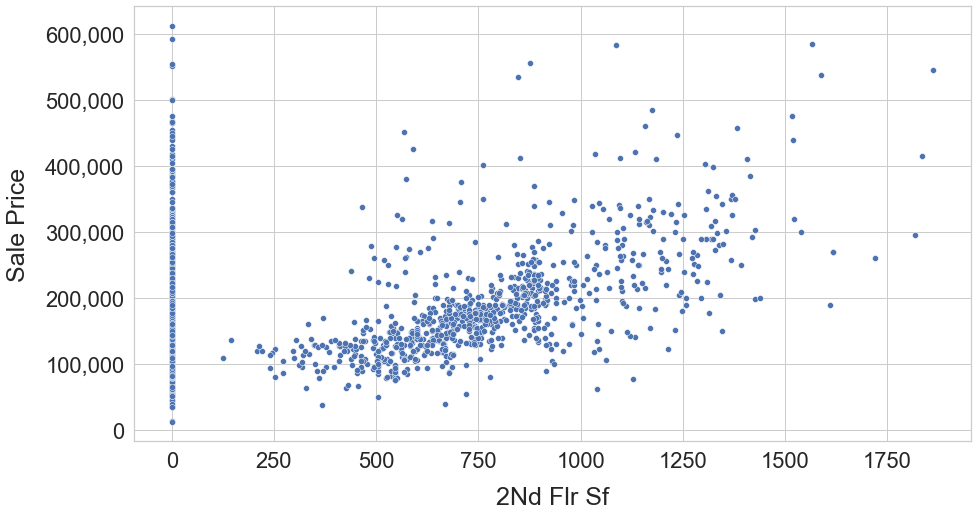

In [1030]:
# 2nd_flr_sf - Boxplot to find outliers
bp = num_col_box_plot('2nd_flr_sf')
bp.set_xticks(range(0, 2000, 200))


#Histogram to look at distribution
num_col_dist_plot('2nd_flr_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('2nd_flr_sf')
df_ames['2nd_flr_sf'].corr(df_ames['saleprice'])

In [1031]:
df_ames['2nd_flr_sf'].agg('median')

0.0

**Boxplot Interpretation:** The box plot shows that values for **2nd_flr_sf (Second Floor square feet)** lie within the range of 0 to 1720 sq feet. Values outside this range are being considered as outliers. The interquartile range shows that most houses have unfinished basement area between 0 to 680 sq feet and the median 2nd_flr_sf is 0 square feet. This could be because many house don't have a 2nd floor. 

However there are many data points which are categorised by the box plot as outliers. Thus the outliers may actually be valid data points. The scatter plot also indicates that although these data points are scarce, they could be valid data points. Hence we accept the outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the Total square feet of basement area and the sales price, the pearson's coeeficient is 0.25.

In [1032]:
df_ames_nums.iloc[:, np.r_[0:20]]

,lot_frontage,lot_area,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,bsmtfin_sf_1,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr
0,68.0,13517,6,8,1976,2005,289.0,533.0,0.0,192.0,725.0,725,754,0,1479,0.0,0.0,2,1,3
1,43.0,11492,7,5,1996,1997,132.0,637.0,0.0,276.0,913.0,913,1209,0,2122,1.0,0.0,2,1,4
2,68.0,7922,5,7,1953,2007,0.0,731.0,0.0,326.0,1057.0,1057,0,0,1057,1.0,0.0,1,0,3
3,73.0,9802,5,5,2006,2007,0.0,0.0,0.0,384.0,384.0,744,700,0,1444,0.0,0.0,2,1,3
4,82.0,14235,6,8,1900,1993,0.0,0.0,0.0,676.0,676.0,831,614,0,1445,0.0,0.0,2,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2046,79.0,11449,8,5,2007,2007,0.0,1011.0,0.0,873.0,1884.0,1728,0,0,1728,1.0,0.0,2,0,3
2047,68.0,12342,4,5,1940,1950,0.0,262.0,0.0,599.0,861.0,861,0,0,861,0.0,0.0,1,0,1
2048,57.0,7558,6,6,1928,1950,0.0,0.0,0.0,896.0,896.0,1172,741,0,1913,0.0,0.0,1,1,3
2049,80.0,10400,4,5,1956,1956,0.0,155.0,750.0,295.0,1200.0,1200,0,0,1200,1.0,0.0,1,0,3


-0.041383561087766356

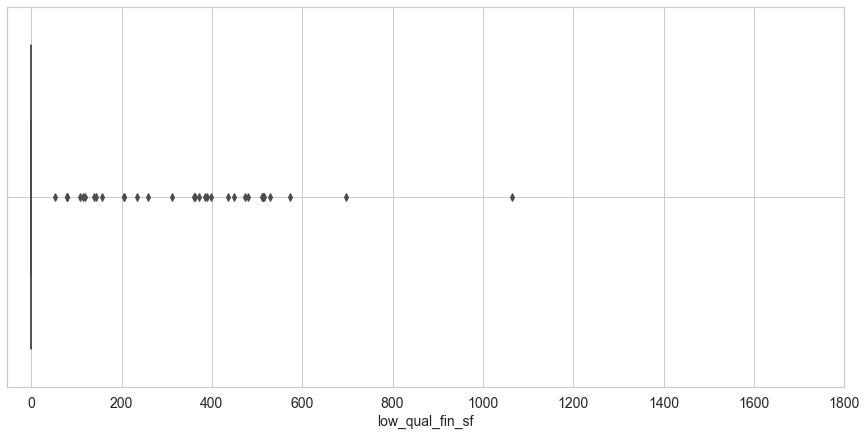

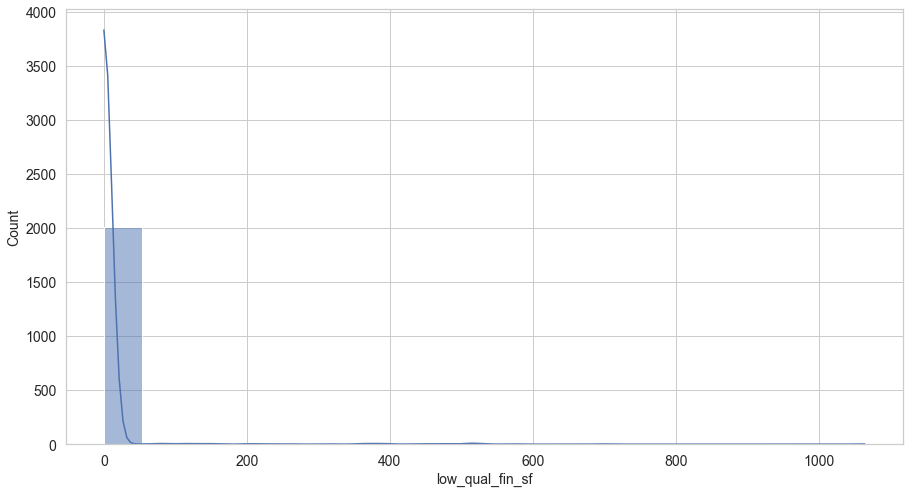

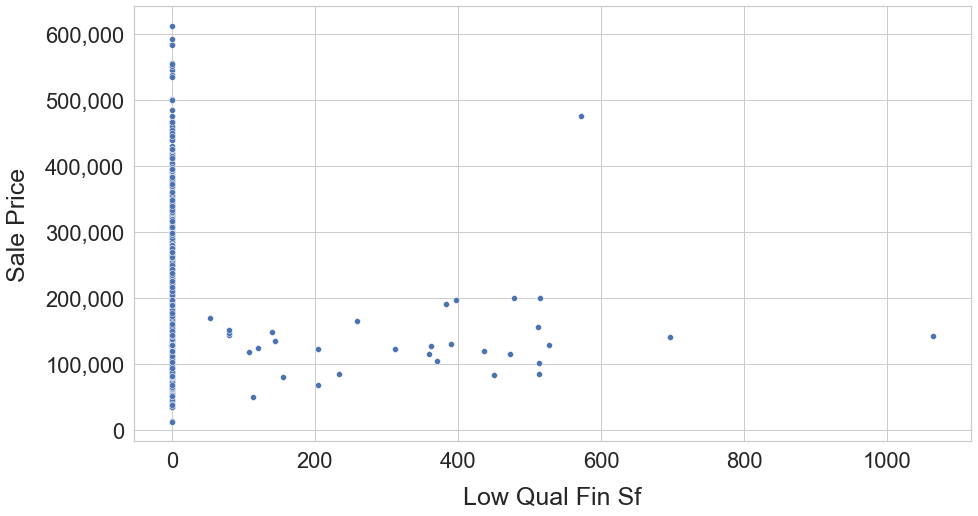

In [1033]:
# low_qual_fin_sf - Boxplot to find outliers
bp = num_col_box_plot('low_qual_fin_sf')
bp.set_xticks(range(0, 2000, 200))


#Histogram to look at distribution
num_col_dist_plot('low_qual_fin_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('low_qual_fin_sf')
df_ames['low_qual_fin_sf'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for **low_qual_fin_sf (Low quality finished square feet)** have mostly value of 0. Values above zero are being considered outliers. The median and IQR of the data is also 0

However there are many data points which are categorised by the box plot as outliers. Thus the outliers may actually be valid data points. The scatter plot also indicates that houses with lower unfinished area are selling at lower prices and hence the data may be valid . Hence we accept the outliers as valid data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the low quality finish and the sales price, the pearson's coeeficient is -0.04.

0.28526164872493004

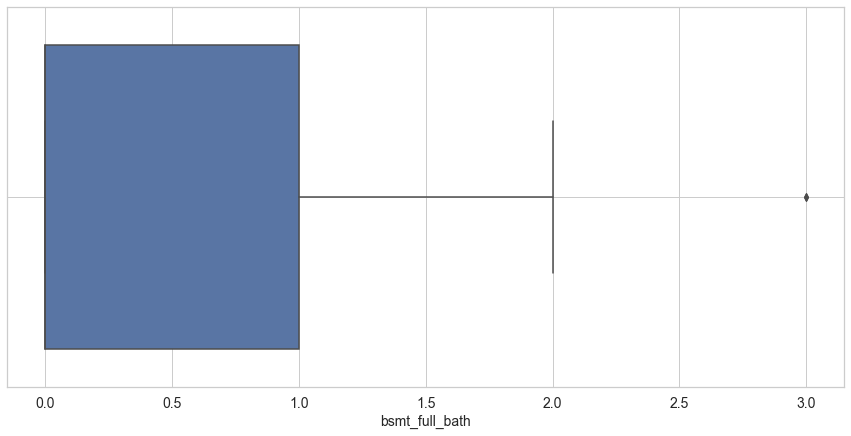

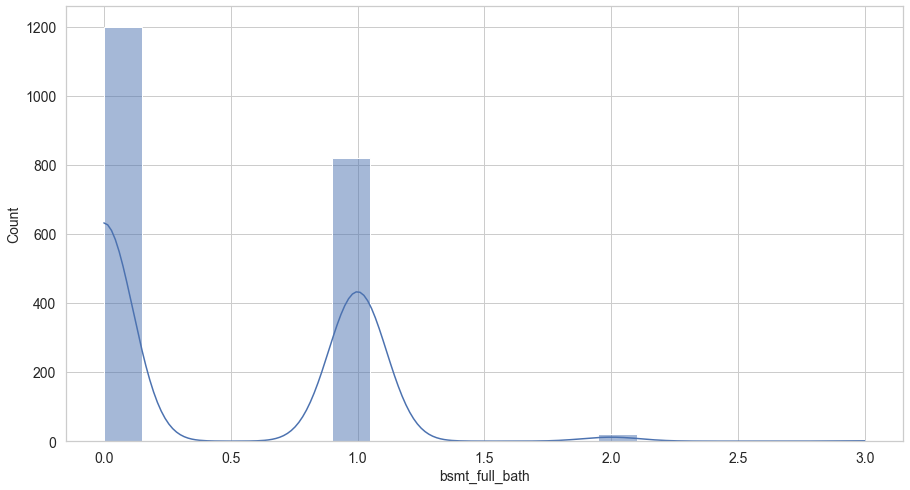

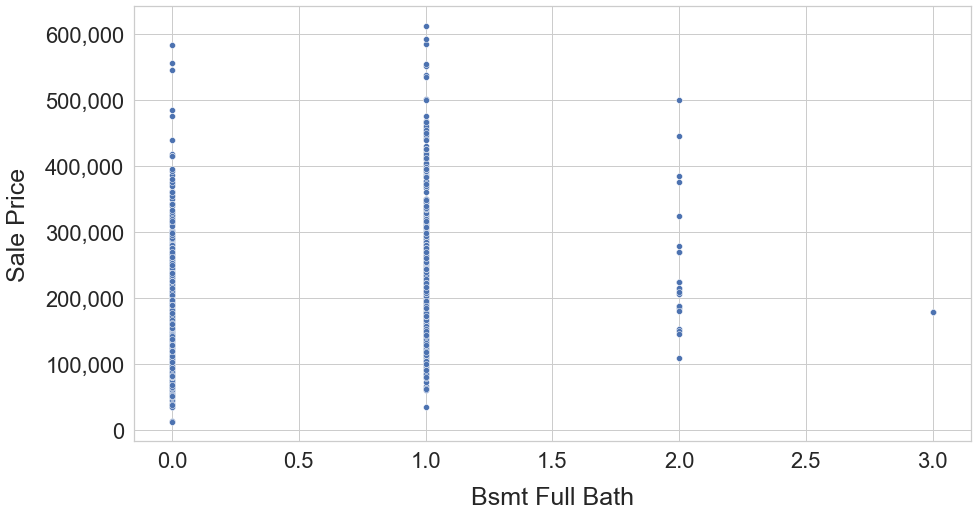

In [1034]:
# bsmt_full_bath - Boxplot to find outliers
bp = num_col_box_plot('bsmt_full_bath')
#bp.set_xticks(range(0, 2000, 200))

#Histogram to look at distribution
num_col_dist_plot('bsmt_full_bath')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('bsmt_full_bath')
df_ames['bsmt_full_bath'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for **bsmt_full_bath (Basement full bathrooms)** have values between 0 and 2. Values above 2 are being considered as outliers. 

Even though the box plot categorises the house with 3 basement bathrooms as an outlier, simce it is not considerably higher than he normal range, we accept the outlier.  

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the low quality finish and the sales price, the pearson's coeeficient is 0.29.

-0.04744706689019334

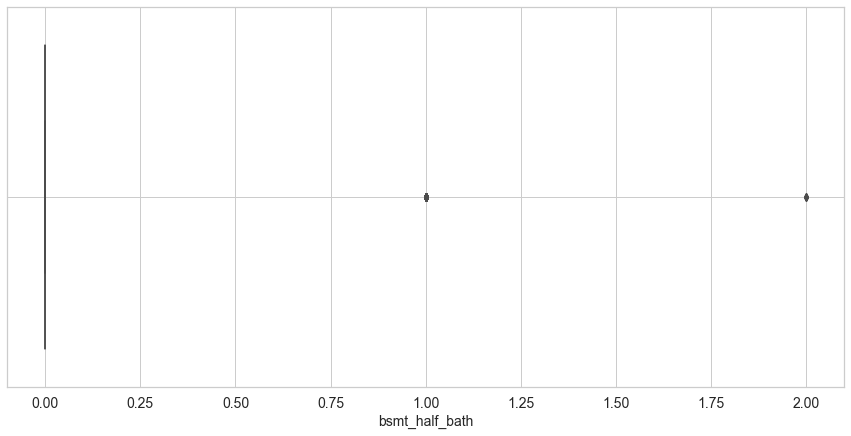

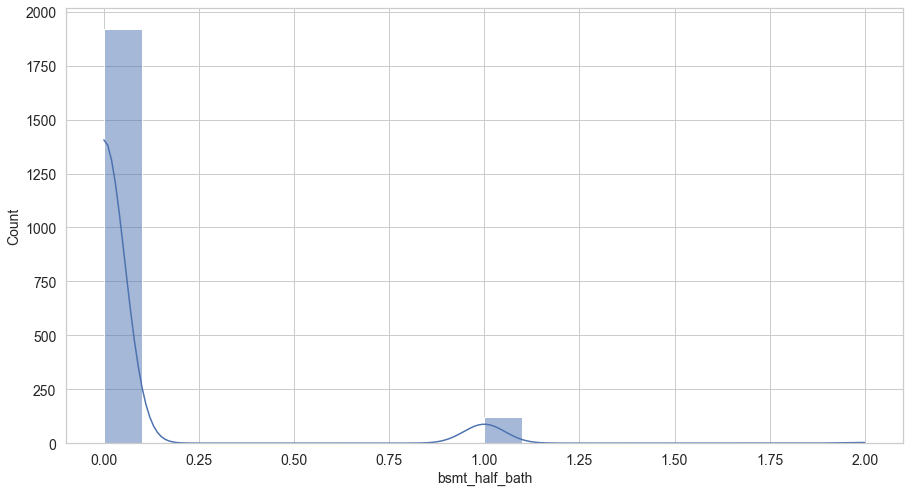

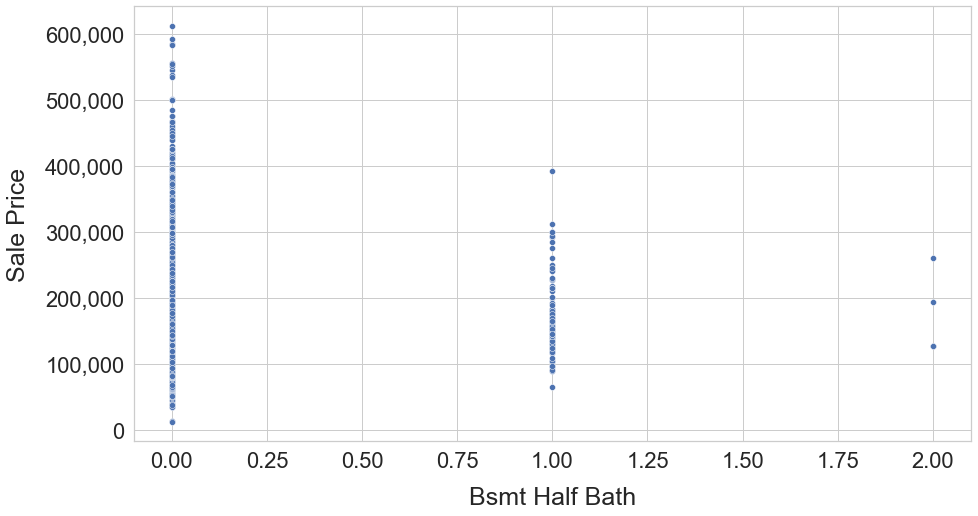

In [1035]:
# bsmt_half_bath - Boxplot to find outliers
bp = num_col_box_plot('bsmt_half_bath')
#bp.set_xticks(range(0, 2000, 200))


#Histogram to look at distribution
num_col_dist_plot('bsmt_half_bath')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('bsmt_half_bath')
df_ames['bsmt_half_bath'].corr(df_ames['saleprice'])

In [1036]:
df_ames['bsmt_half_bath'].value_counts()

0.0    1920
1.0     120
2.0       4
Name: bsmt_half_bath, dtype: int64

**Boxplot Interpretation:** The box plot shows that most values for **bsmt_half_bath (Basement half bathrooms)** are 0. Values above 0 are being considered as outliers. 

However, even though the box plot categorises the house with 1 and 2 basement half bathrooms as outlier, it may be common to have 1 or 2 half bathrooms inthe basement. 

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the bsmt_half_bath and the sales price, the pearson's coeeficient is -0.04.


0.5370423563306976

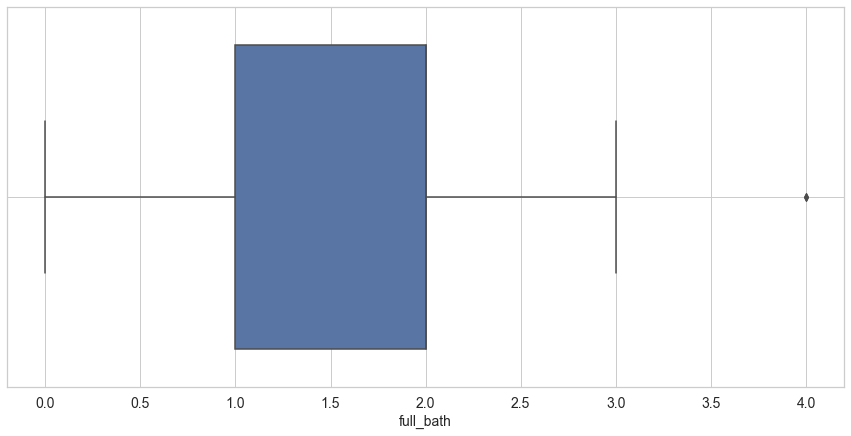

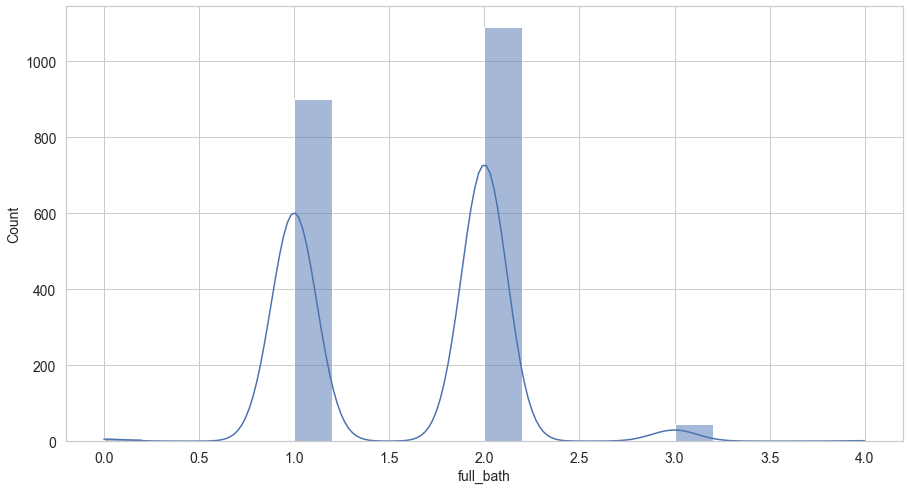

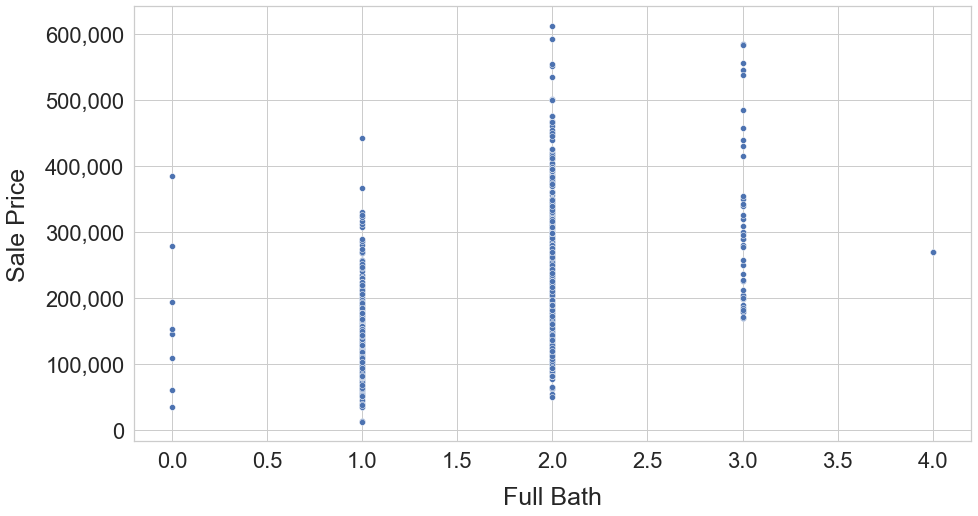

In [1037]:
# full_bath - Boxplot to find outliers
bp = num_col_box_plot('full_bath')
#bp.set_xticks(range(0, 2000, 200))


#Histogram to look at distribution
num_col_dist_plot('full_bath')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('full_bath')
df_ames['full_bath'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for *full_bath (Full bathrooms)** are between 0 and 3. Values above 3 are being considered as outliers. The interquartile range shows that most houses have between 0 to 2 full bathrooms, with a median of 2. 

However, even though the box plot categorises the house 4 full bathrooms as an outlier, we don't remove the data point, as it is not much further away from typical values. 

**Scatter Plot & Correlation**
The scatter plot shows that there is a moderate degree of correlation between the number of Full Bathrooms and the sales price, the pearson's coeeficient is 0.54.


0.28417602992905294

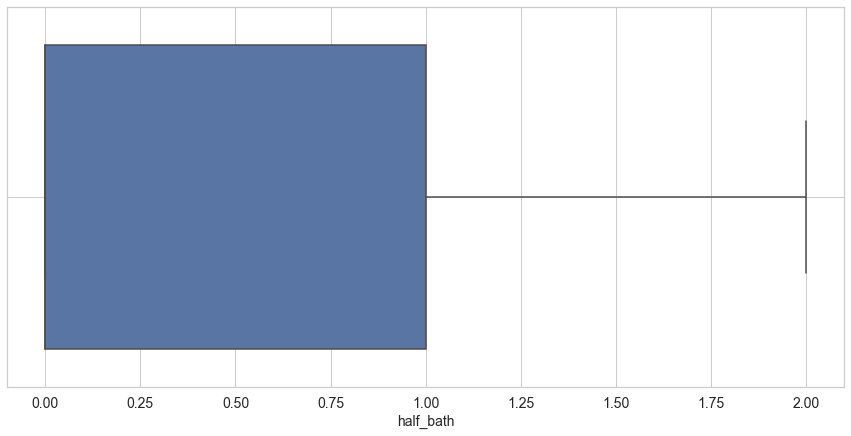

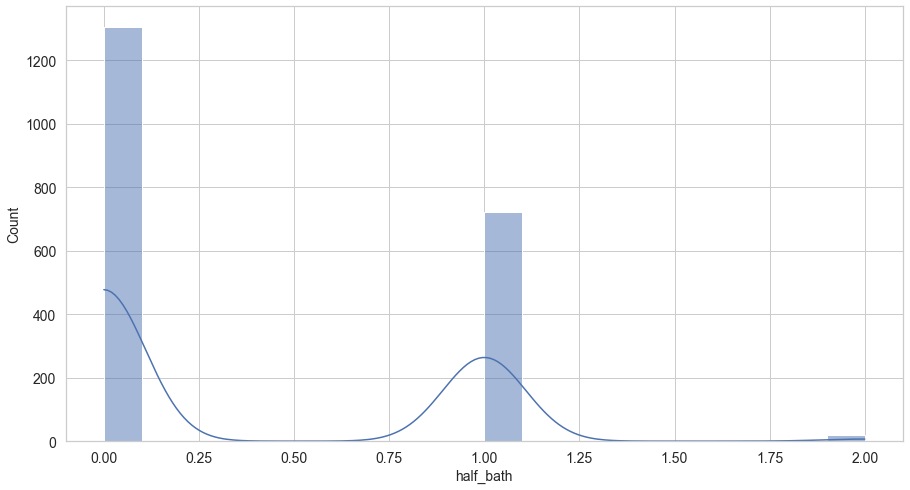

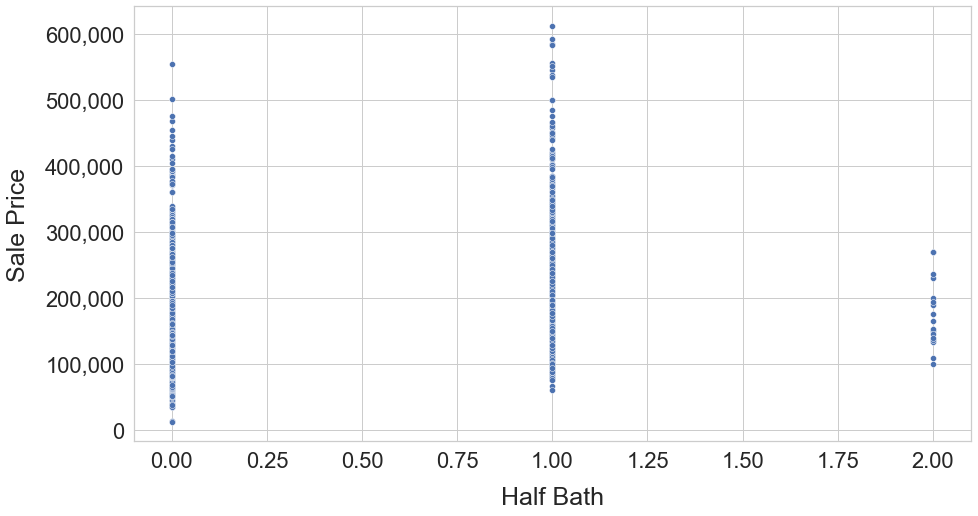

In [1038]:
# half_bath - Boxplot to find outliers
bp = num_col_box_plot('half_bath')
#bp.set_xticks(range(0, 2000, 200))


#Histogram to look at distribution
num_col_dist_plot('half_bath')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('half_bath')
df_ames['half_bath'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that values for *half_bath (Half bathrooms)** are between 0 and 2. No outliers are found in the data.

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the number of half Bathrooms and the sales price, the pearson's coeeficient is 0.28.

0.13543648246135845

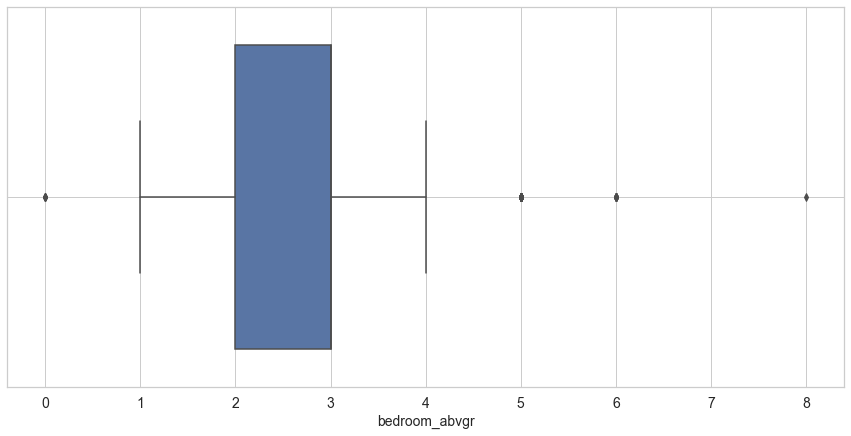

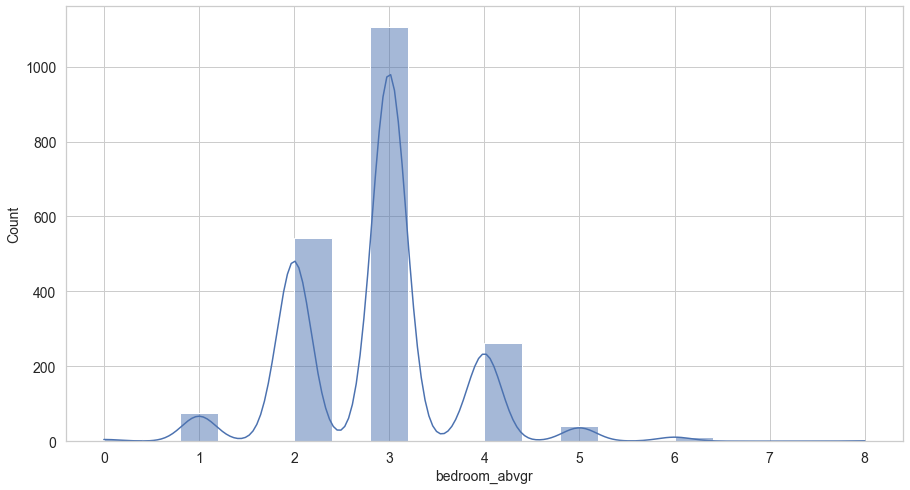

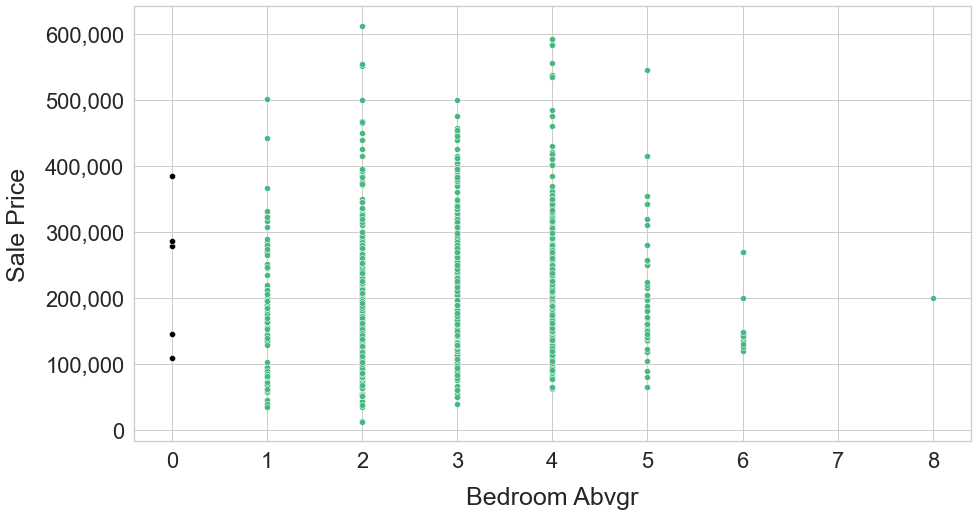

In [1039]:
# bedroom_abvgr - Bedrooms above grade (does NOT include basement bedrooms)
# Boxplot to find outliers
bp = num_col_box_plot('bedroom_abvgr')
#bp.set_xticks(range(0, 2000, 200))

#Histogram to look at distribution
num_col_dist_plot('bedroom_abvgr')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('bedroom_abvgr', colour='#47B881', outlier_dataset=df_ames[(df_ames['bedroom_abvgr'] == 0)])
df_ames['bedroom_abvgr'].corr(df_ames['saleprice'])

**Boxplot Interpretation:** The box plot shows that most values for *bedroom_abvgr (Bedrooms above grade)** are between 1 and 4. Values above 4 are being considered as outliers. The interquartile range shows that most houses have between 2 to 3 bedrooms above grade, with a median of 3. 

However, even though the box plot categorises the houses with bedrooms above 4 as outliers, we don't remove these data points, as they could be valid values. However, houses with 0 bedrooms above grade are highly unusual and we consider them as  outliers. 

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of correlation between the number of  Bedrooms above grade and the sales price, the pearson's coeeficient is 0.14.

In [1040]:
print(df_ames['bedroom_abvgr'].agg('median'))
df_ames[(df_ames['bedroom_abvgr'] == 0)]

3.0


,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
191,2119,906475170,20,RL,155.0,20064,Pave,NA,IR1,Low,...,0,0,NA,NA,NA,0,5,2007,WD,279000
346,2724,905200490,80,RL,68.0,10246,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,5,2006,WD,145000
744,1386,905200090,90,RL,60.0,12900,Pave,NA,Reg,Lvl,...,0,0,NA,NA,NA,0,1,2008,WD,108959
1308,1000,527127140,120,RL,41.0,4923,Pave,NA,Reg,Lvl,...,224,0,NA,NA,NA,0,8,2008,WD,286000
1571,2523,533350050,20,RL,68.0,50271,Pave,NA,IR1,Low,...,0,0,NA,NA,NA,0,11,2006,WD,385000


In [1041]:
print(len(df_ames[(df_ames['bedroom_abvgr'] == 0)]))

df_ames.drop(df_ames[(df_ames['bedroom_abvgr'] == 0)].index, inplace=True)

print(df_ames['bedroom_abvgr'].corr(df_ames['saleprice']))


5
0.14427404314234166


-0.12359286523623085

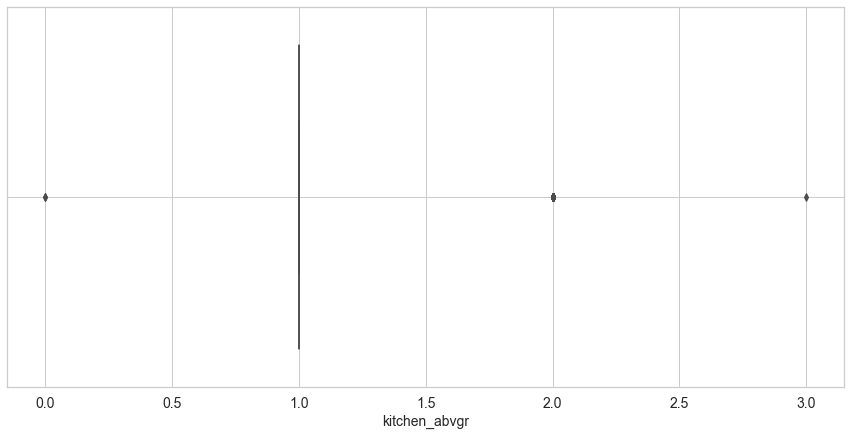

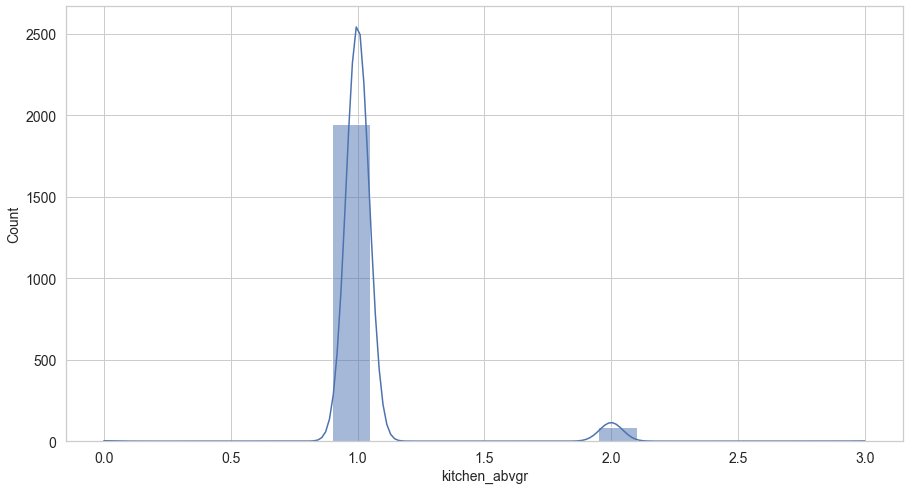

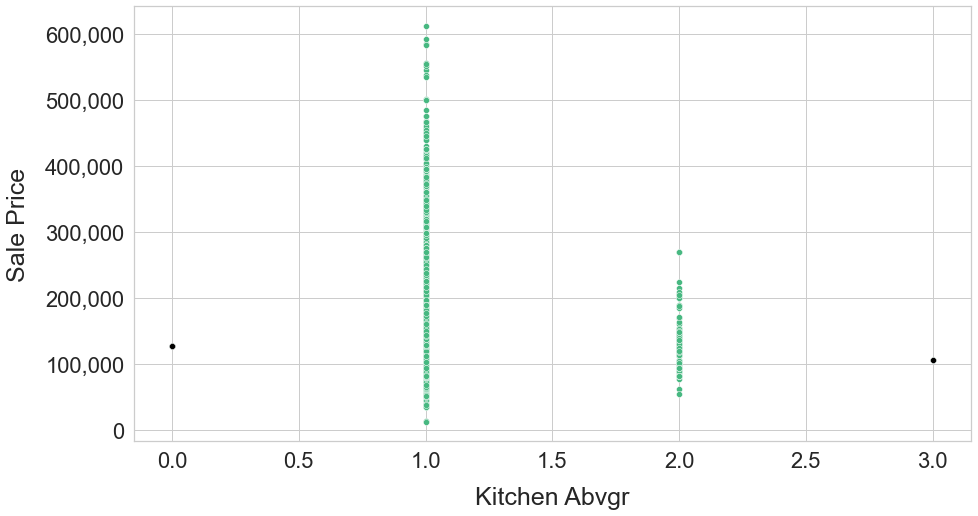

In [1042]:
# kitchen_abvgr - Kitchen above grade (does NOT include basement bedrooms)
# Boxplot to find outliers
bp = num_col_box_plot('kitchen_abvgr')
#bp.set_xticks(range(0, 2000, 200))

#Histogram to look at distribution
num_col_dist_plot('kitchen_abvgr')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('kitchen_abvgr', colour="#47B881", outlier_dataset=df_ames[(df_ames['kitchen_abvgr'] == 0) | (df_ames['kitchen_abvgr'] == 3)])
df_ames['kitchen_abvgr'].corr(df_ames['saleprice'])

**Interpretation**

The box plot shows that most houses have 1 kitchen Above Grade. Houses with kitchens above and below 1 are being considered as outliers. We consider houses with 0 and 3 kitchens as outliers as it is quite unusual and we remove them from the dataset. 

**Scatter Plot & Correlation**
The scatter plot shows that there is a low degree of negative correlation between the number of  Kitchens Abv Grade above grade and the sales price, the pearson's coefficient is -0.12.

In [1043]:
df_ames[(df_ames['kitchen_abvgr'] == 0)]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
1137,2821,908103320,90,RL,35.0,9400,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,10,2006,WD,127500
1519,2820,908103310,90,RL,38.0,7840,Pave,NA,IR1,Lvl,...,0,0,NA,NA,NA,0,10,2006,WD,127500


In [1044]:
print(len(df_ames[df_ames['kitchen_abvgr'] == 0]))

df_ames.drop(df_ames[(df_ames['kitchen_abvgr'] == 0) | (df_ames['kitchen_abvgr'] == 3)].index, inplace=True)

print(df_ames['kitchen_abvgr'].corr(df_ames['saleprice']))

2
-0.12694844873757496


0.5163469237619236

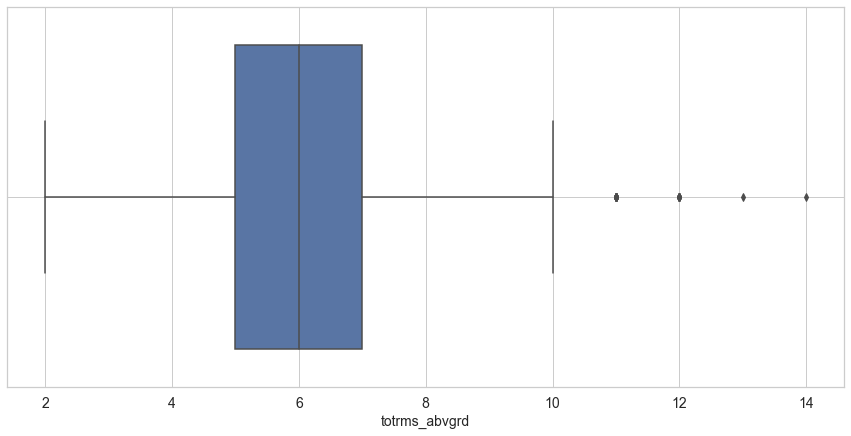

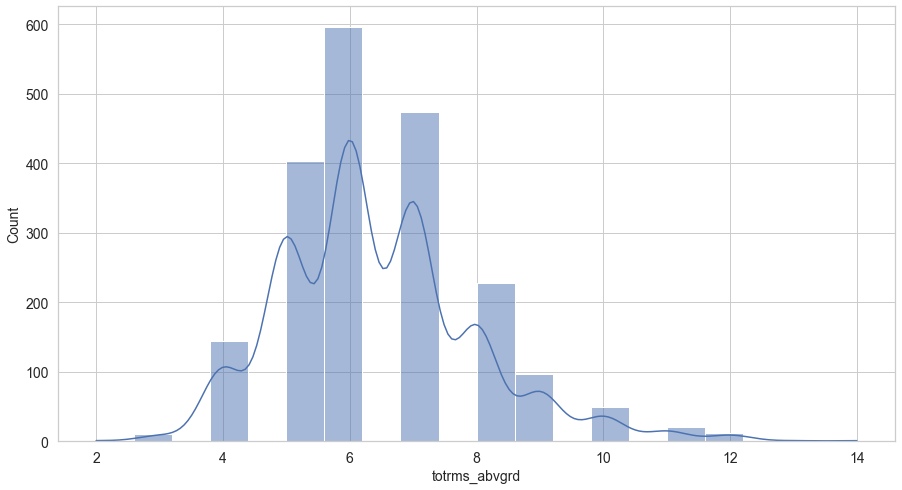

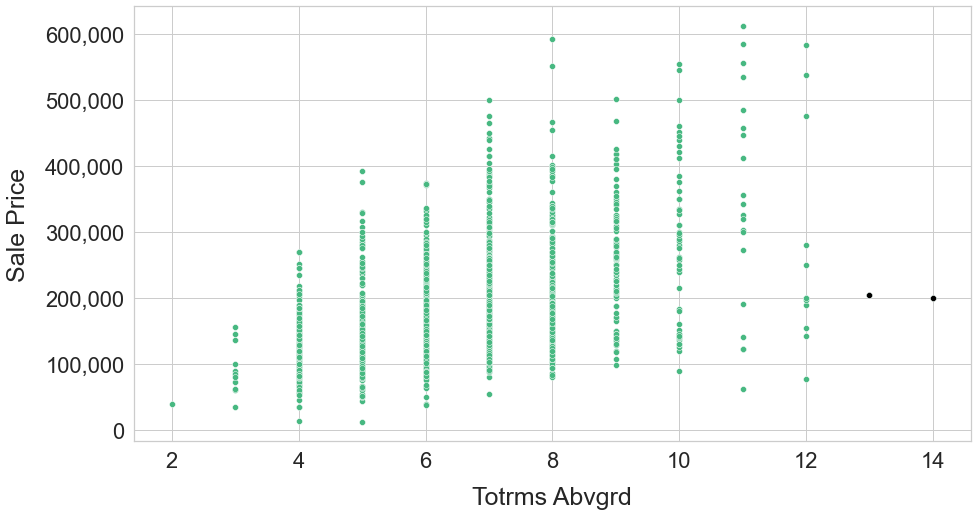

In [1045]:
# totrms_abvgrd - Total rooms above grade (does not include bathrooms)

# Boxplot to find outliers
bp = num_col_box_plot('totrms_abvgrd')

#Histogram to look at distribution
num_col_dist_plot('totrms_abvgrd')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('totrms_abvgrd', colour='#47B881', outlier_dataset=df_ames[df_ames['totrms_abvgrd'] > 12])
df_ames['totrms_abvgrd'].corr(df_ames['saleprice'])

**Interpretation**

The box plot for Total rooms above grade (does not include bathrooms), shows values forthis variable range between 2 and 10. Houses with total rooms above grade, above and below this range are being considered as outliers. However we consider houses with more than 12 total rooms above grade as outliers, as it is quite unusual and we remove them from the dataset especially for a fairly reasonable sale price. 

**Scatter Plot & Correlation**
The scatter plot shows that there is a moderate degree of correlation between the number of  Total Rooms Abv Grade and the sales price, the pearson's coefficient is 0.51.


In [1046]:
print(len(df_ames[df_ames['totrms_abvgrd'] > 12]))

df_ames.drop(df_ames[df_ames['totrms_abvgrd'] > 12].index, inplace=True)

print(df_ames['totrms_abvgrd'].corr(df_ames['saleprice']))


2
0.5206359741568264


0.47034353793804196

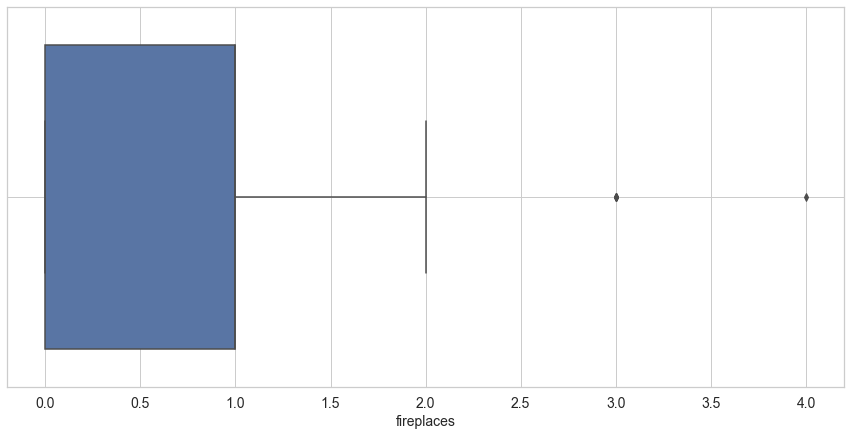

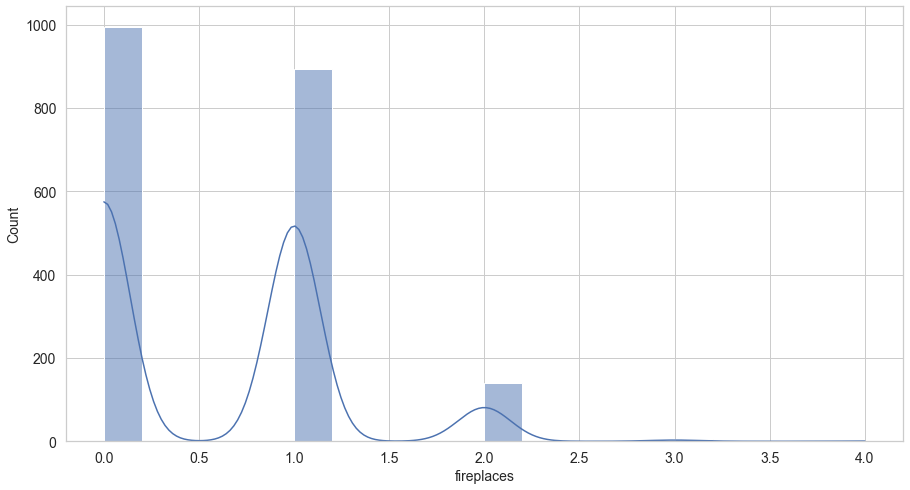

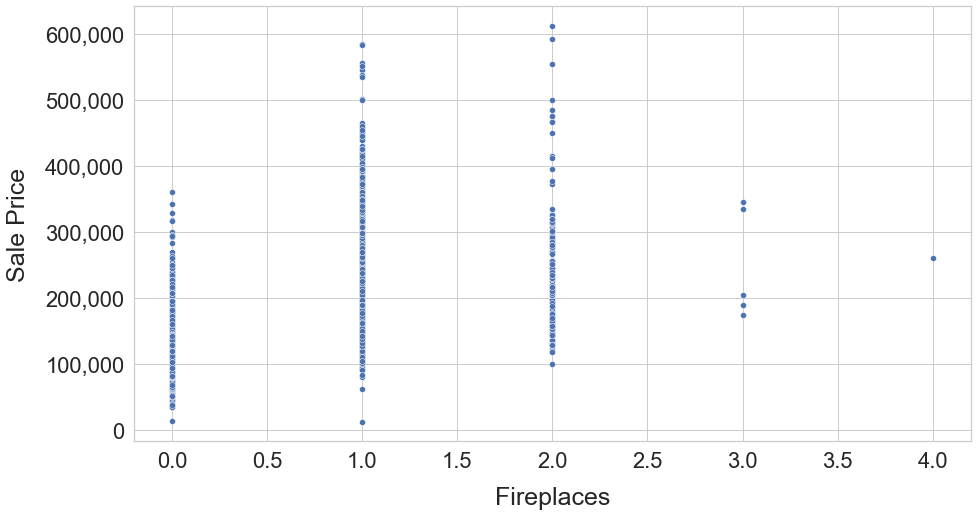

In [1047]:
# fireplaces - Number of fireplaces

# Boxplot to find outliers
bp = num_col_box_plot('fireplaces')
#bp.set_xticks(range(0, 2000, 200))

#Histogram to look at distribution
num_col_dist_plot('fireplaces')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('fireplaces')
df_ames['fireplaces'].corr(df_ames['saleprice'])

In [1048]:
df_ames[df_ames['fireplaces'] >= 3].iloc[:, np.r_[60:79]]

,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold
761,1974.0,RFn,2.0,550.0,TA,TA,Y,641,100,0,0,0,800,Gd,GdPrv,NA,0,1,2006
1000,1955.0,Fin,1.0,303.0,TA,TA,Y,476,0,0,0,142,0,NA,GdWo,NA,0,11,2009
1304,1972.0,Fin,2.0,538.0,TA,TA,Y,269,111,0,0,0,0,NA,MnPrv,NA,0,7,2009
1572,1965.0,Unf,2.0,486.0,TA,TA,Y,0,42,0,0,189,0,NA,NA,NA,0,10,2009
1729,1957.0,Unf,2.0,464.0,TA,TA,Y,0,0,0,0,0,0,NA,NA,NA,0,4,2007
1737,1992.0,RFn,3.0,888.0,TA,TA,Y,177,208,186,0,0,0,NA,NA,NA,0,10,2006


**Interpretation**

The box plot for fireplaces , shows values forthis variable range between 0 and 2. Houses with total rooms above grade, above and below this range are being considered as outliers. However we keep the outliers as they could be valid data. 

**Scatter Plot & Correlation**
The scatter plot shows that there is a moderate degree of correlation between the number of  Fireplaces and the sales price, the pearson's coefficient is 0.47.

0.5179774204634066

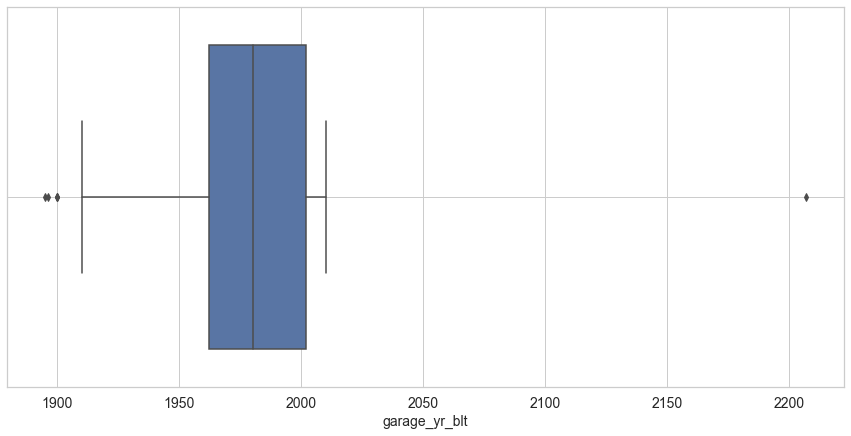

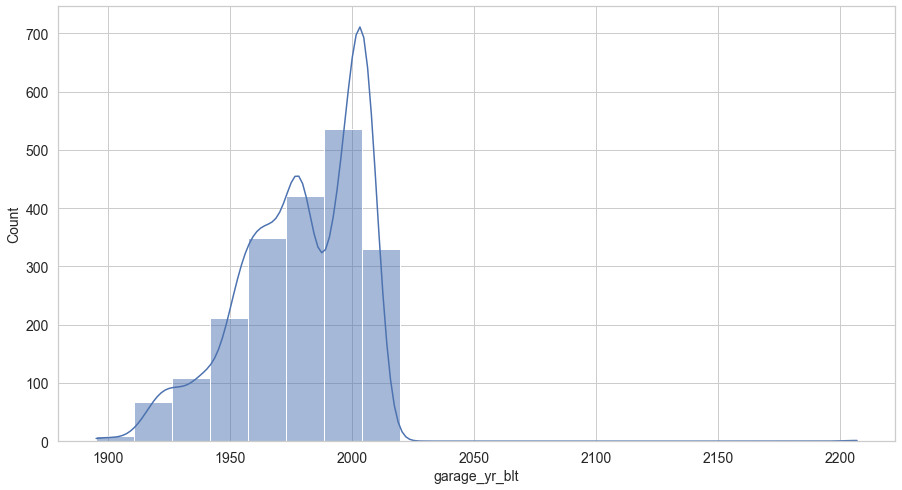

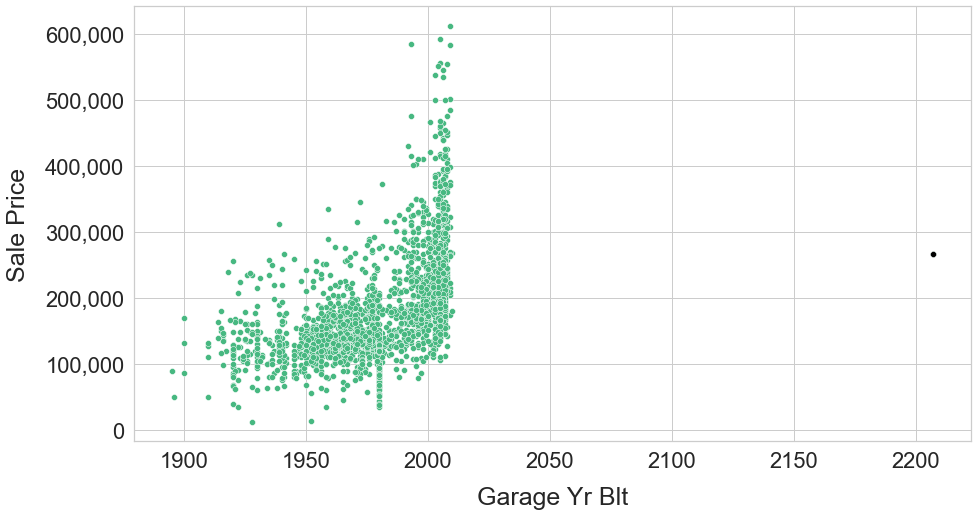

In [1049]:
# garage_yr_blt - Year garage was built

# Boxplot to find outliers
bp = num_col_box_plot('garage_yr_blt')
#bp.set_xticks(range(0, 2000, 200))

#Histogram to look at distribution
num_col_dist_plot('garage_yr_blt')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('garage_yr_blt', colour='#47B881', outlier_dataset=df_ames[df_ames['garage_yr_blt'] > 2021])
df_ames['garage_yr_blt'].corr(df_ames['saleprice'])

Boxplot shows outlier at garage_yr_blt = 2207 is an anomaly. So we replace it with the 'year_remod/add' for that house. 

Scatter plot shows a moderate degree correlation of garage year built with SalePrice, Pearson's coefficient is 0.52. 

In [1050]:
df_ames.loc[df_ames['garage_yr_blt'] == 2207, ['garage_yr_blt']] = df_ames[df_ames['garage_yr_blt'] == 2207]['year_remod/add'].astype(int)


0.6501473396139706

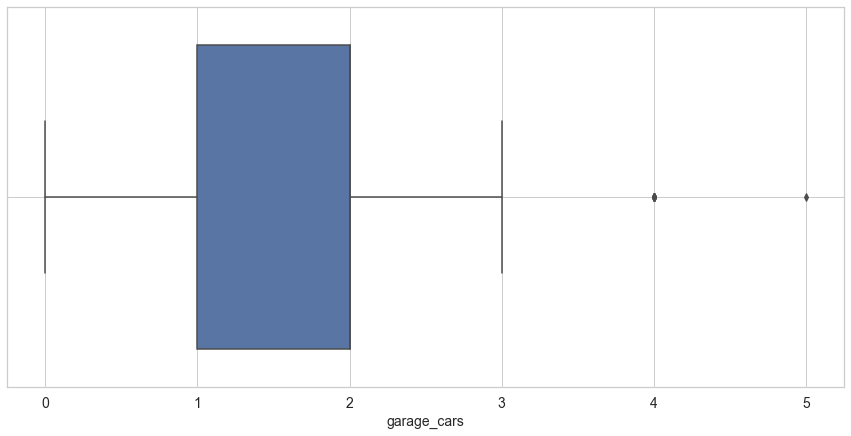

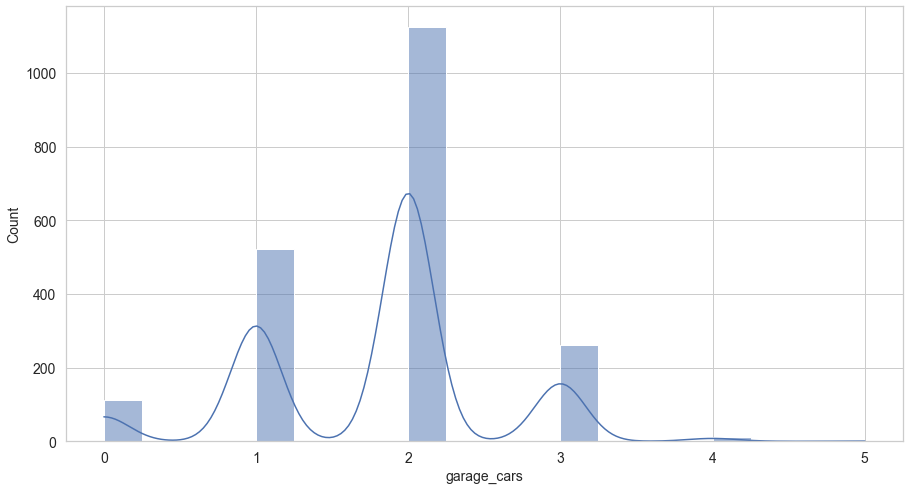

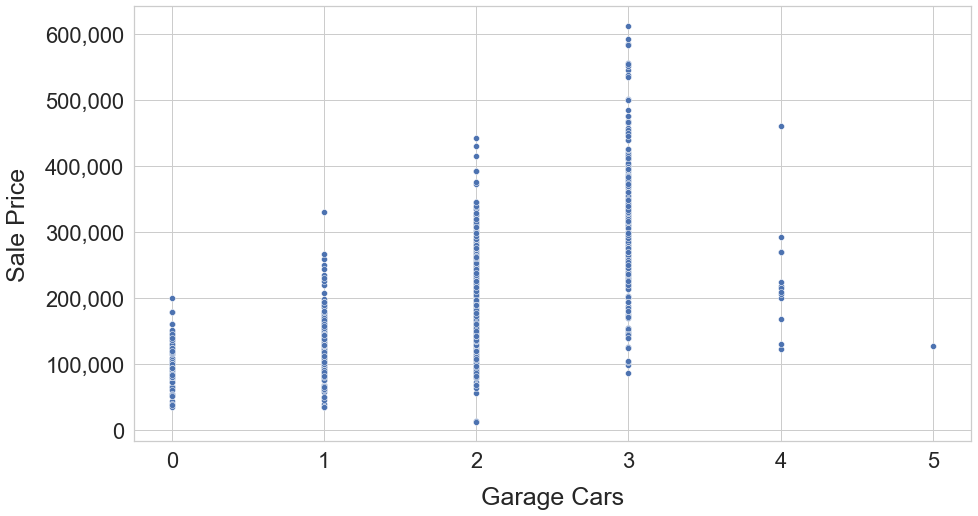

In [1051]:
# garage_cars - Size of garage in car capacity

# Boxplot to find outliers
bp = num_col_box_plot('garage_cars')

#Histogram to look at distribution
num_col_dist_plot('garage_cars')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('garage_cars')
df_ames['garage_cars'].corr(df_ames['saleprice'])

Box plot shows valid valuesof Garage Cars between 0 and 3, values above 3 are being shown as outlers, however we don't remove outliers as it could be valid data. 
High degree of correlation with Sale Price, Person's coefficient 0.65

0.655552751133635

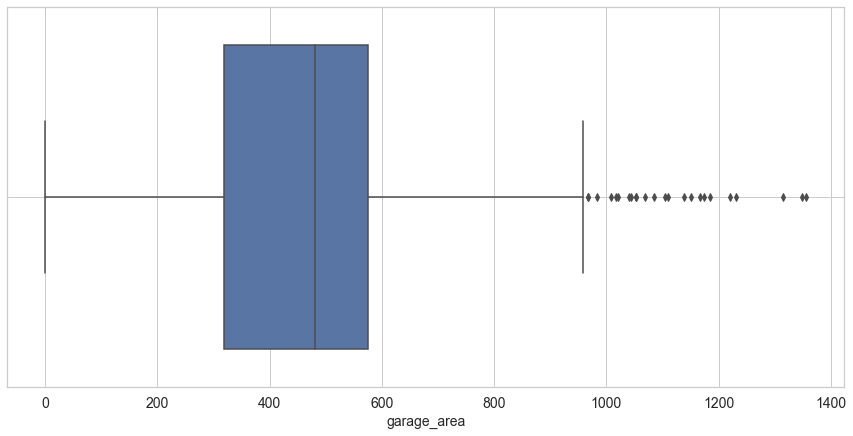

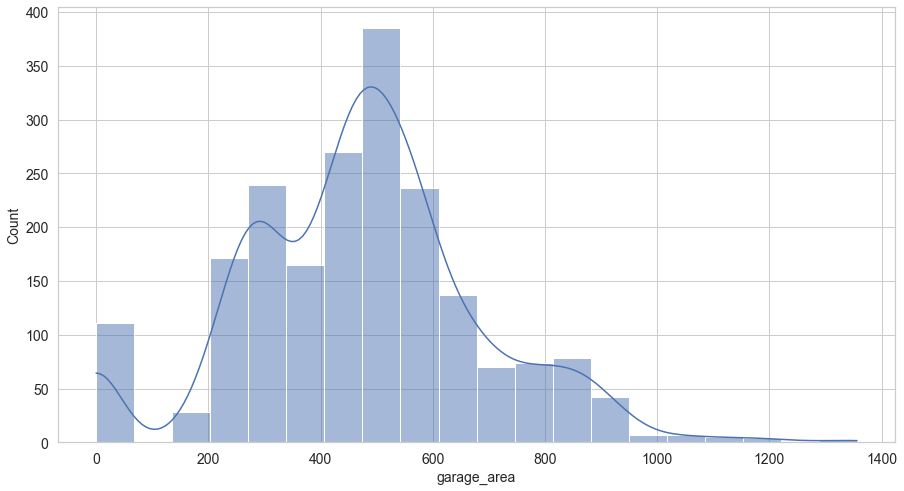

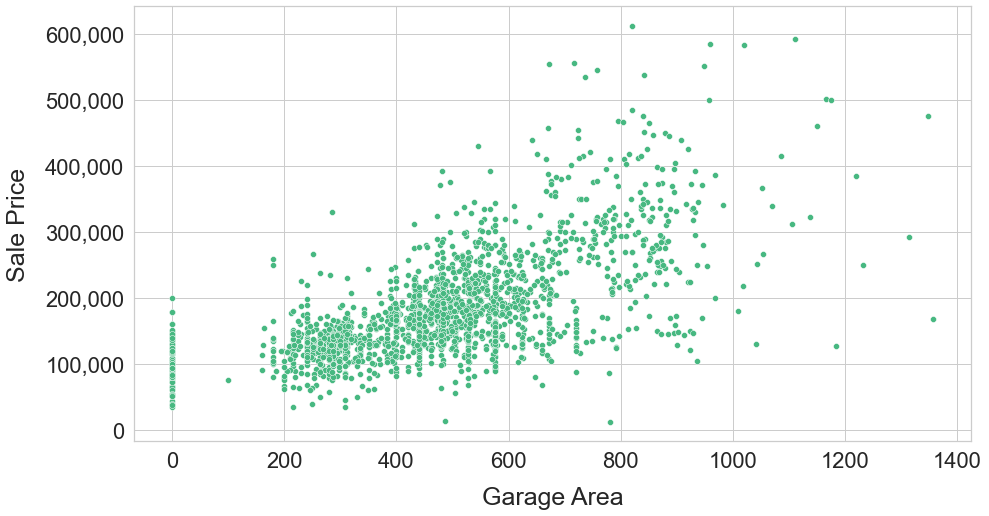

In [1052]:
# garage_area - Size of garage in square feet

# Boxplot to find outliers
bp = num_col_box_plot('garage_area')

#Histogram to look at distribution
num_col_dist_plot('garage_area')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('garage_area', colour="#47B881")
df_ames['garage_area'].corr(df_ames['saleprice'])

Box plot shows valid values for Garage Area between 0 and 950. Values above 950 are showns as outlers. However we don't remove the outliers as they are high in number and could repesent valid data. 

High degree of correlation with Sale Price. Pearson's coefficient :0.66

0.3240203219695415

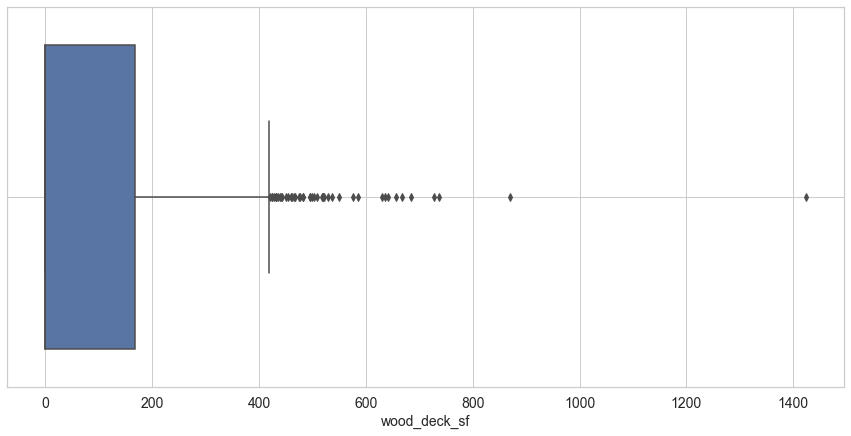

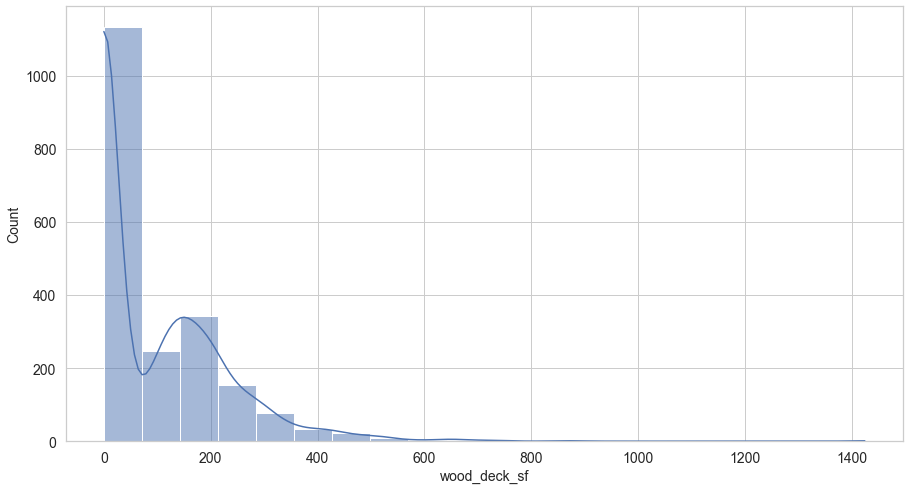

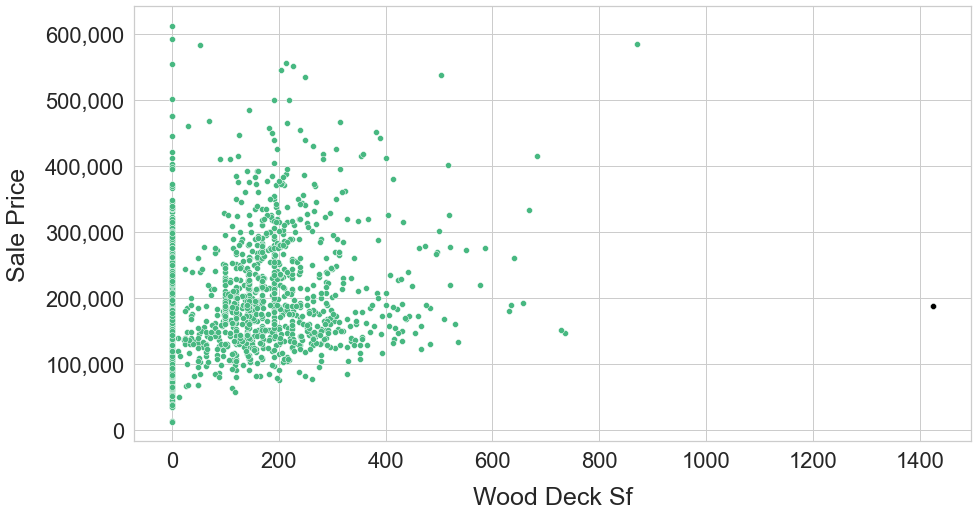

In [1053]:
# wood_deck_sf - Wood deck area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('wood_deck_sf')

#Histogram to look at distribution
num_col_dist_plot('wood_deck_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('wood_deck_sf', colour='#47B881', outlier_dataset=df_ames[df_ames['wood_deck_sf'] > 1400])
df_ames['wood_deck_sf'].corr(df_ames['saleprice'])

Boxplot shows values for wooden deck squarefeet to be between 0 and 400. Values abovethis range are shown as outliers. However, we opnly remove the extreme outlier with wood_deck_sf > 1400. 

Scatter plot shows a low degree correlation with Sale Price, Pearson's coefficient: 0.32

In [1054]:
print(len(df_ames[df_ames['wood_deck_sf'] > 1400]))

df_ames.drop(df_ames[df_ames['wood_deck_sf'] > 1400].index, inplace=True)

print(df_ames['wood_deck_sf'].corr(df_ames['saleprice']))

1
0.3327440483969182


0.338946281532849

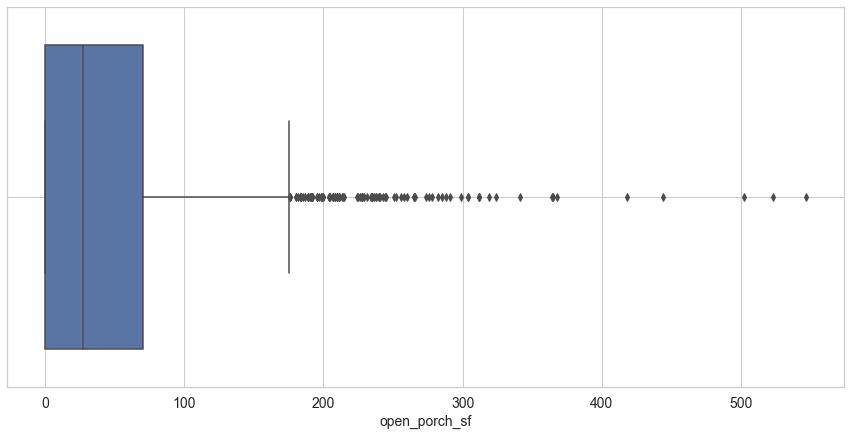

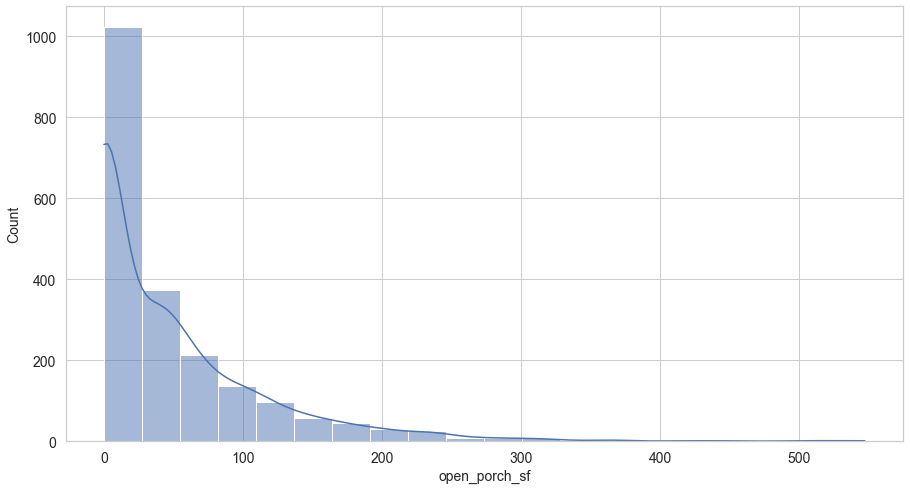

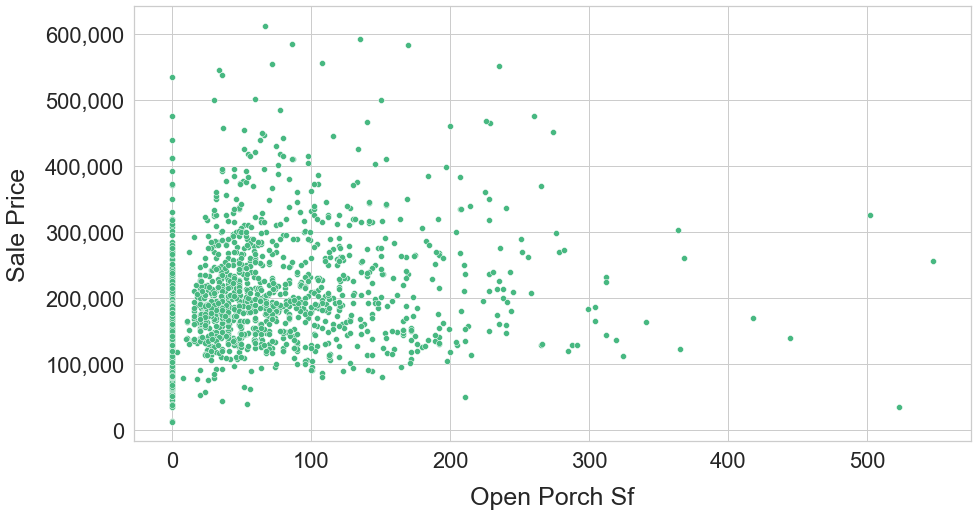

In [1055]:
# open_porch_sf - Open porch area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('open_porch_sf')

#Histogram to look at distribution
num_col_dist_plot('open_porch_sf')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('open_porch_sf', colour='#47B881')
df_ames['open_porch_sf'].corr(df_ames['saleprice'])

Boxplot shows values for open porch squarefeet to be between 0 and 180. Values above this range are shown as outliers. However, we don't remove outliers as they are high in number and don't seem extreme or unusual data. 

Scatter plot shows a low degree correlation with Sale Price, Pearson's coefficient: 0.34. 

In [1056]:
df_ames[df_ames['open_porch_sf'] >=500].iloc[:, np.r_[40:60]]


,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type
974,GasW,Ex,Y,SBrkr,1584,1208,0,2792,0.0,0.0,2,0,5,1,TA,8,Mod,2,TA,Detchd
1141,GasA,Gd,Y,SBrkr,1521,1254,0,2775,0.0,0.0,3,1,3,1,Gd,9,Typ,1,Gd,Detchd
1309,GasA,TA,N,FuseA,720,0,0,720,0.0,0.0,1,0,2,1,TA,4,Typ,0,NA,NA


-0.13517464497958498

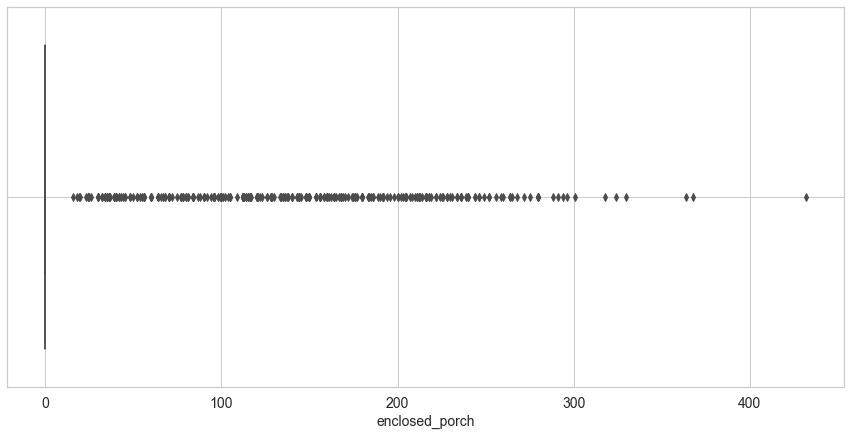

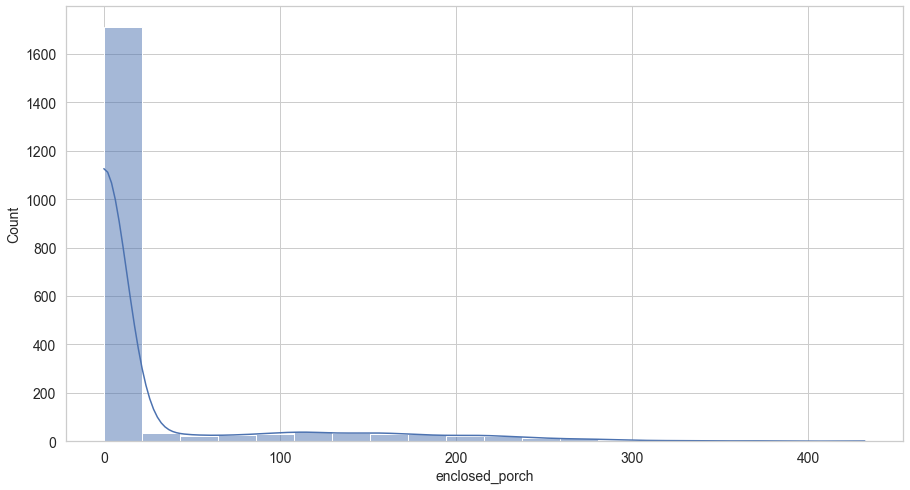

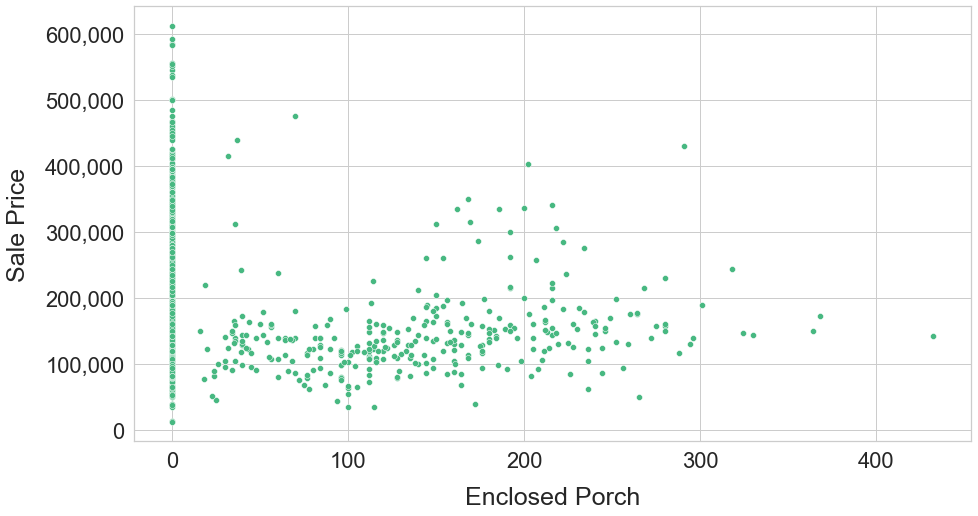

In [1057]:
# enclosed_porch - Enclosed porch area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('enclosed_porch')

#Histogram to look at distribution
num_col_dist_plot('enclosed_porch')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('enclosed_porch', colour='#47B881')
df_ames['enclosed_porch'].corr(df_ames['saleprice'])

Boxplot shows most values for enclosed porch area in squarefeet to be 0. Values above this are shown as outliers. However, we don't remove the outliers as they seem like valid area of enclosed porch and not very extreme. 

Scatter plot shows a low degree of negative correlation between Enclosed porch area in square feet and price, Pearson's coefficient: -0.13


In [1058]:
len(df_ames)

2033

0.04933994352276463

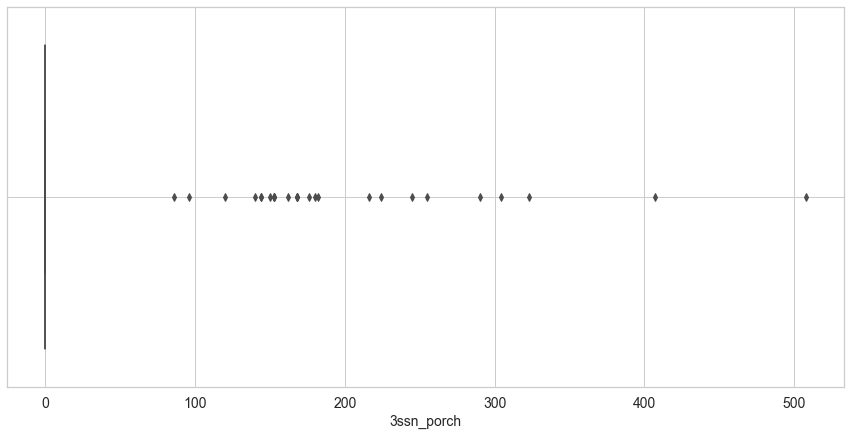

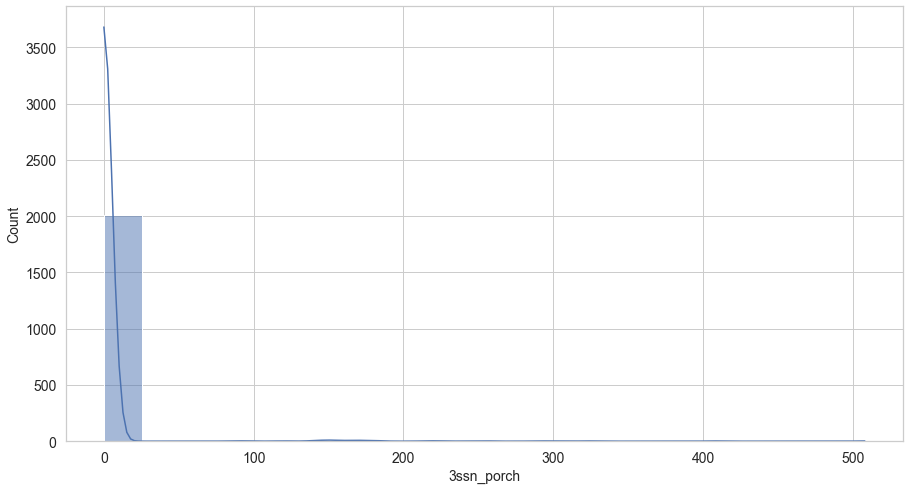

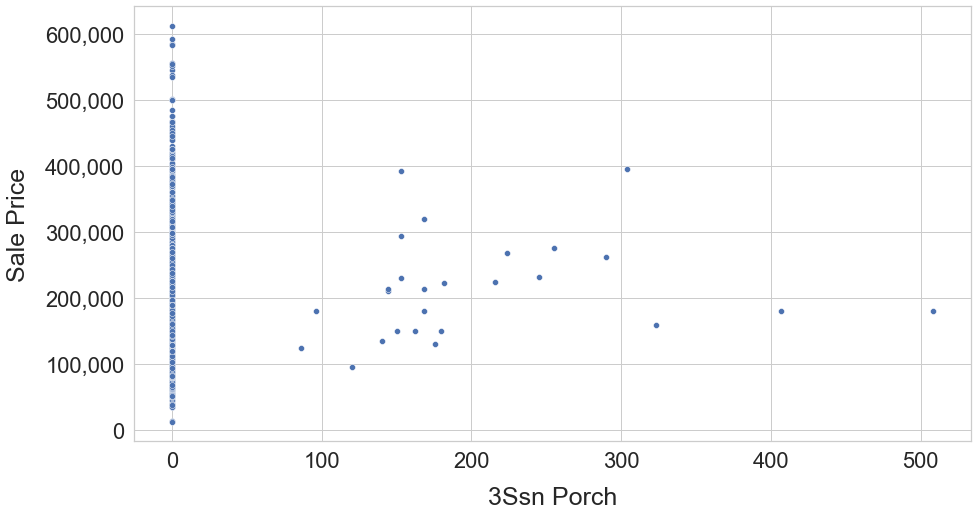

In [1059]:
# open_porch_sf - Three season porch area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('3ssn_porch')

#Histogram to look at distribution
num_col_dist_plot('3ssn_porch')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('3ssn_porch')
df_ames['3ssn_porch'].corr(df_ames['saleprice'])

Boxplot shows most values for 3 season porch area in squarefeet to be 0. Values above this are shown as outliers. However, we don't remove the outliers as they seem like valid area of 3 season porch area and not very extreme. 

Scatter plot shows a very low degree of correlation between 3 season porch area in square feet and price, Pearson's coefficient: 0.05

In [1060]:
df_ames_nums.iloc[:, np.r_[0:16]]

,lot_frontage,lot_area,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,bsmtfin_sf_1,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath
0,68.0,13517,6,8,1976,2005,289.0,533.0,0.0,192.0,725.0,725,754,0,1479,0.0
1,43.0,11492,7,5,1996,1997,132.0,637.0,0.0,276.0,913.0,913,1209,0,2122,1.0
2,68.0,7922,5,7,1953,2007,0.0,731.0,0.0,326.0,1057.0,1057,0,0,1057,1.0
3,73.0,9802,5,5,2006,2007,0.0,0.0,0.0,384.0,384.0,744,700,0,1444,0.0
4,82.0,14235,6,8,1900,1993,0.0,0.0,0.0,676.0,676.0,831,614,0,1445,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2046,79.0,11449,8,5,2007,2007,0.0,1011.0,0.0,873.0,1884.0,1728,0,0,1728,1.0
2047,68.0,12342,4,5,1940,1950,0.0,262.0,0.0,599.0,861.0,861,0,0,861,0.0
2048,57.0,7558,6,6,1928,1950,0.0,0.0,0.0,896.0,896.0,1172,741,0,1913,0.0
2049,80.0,10400,4,5,1956,1956,0.0,155.0,750.0,295.0,1200.0,1200,0,0,1200,1.0


0.13330075675930902

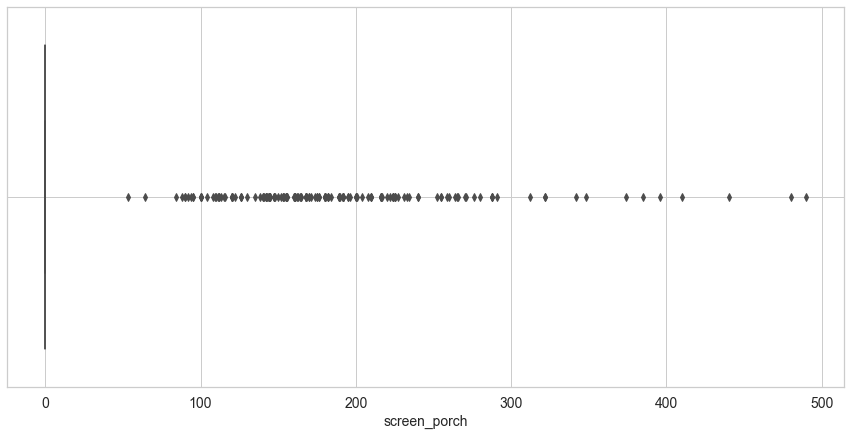

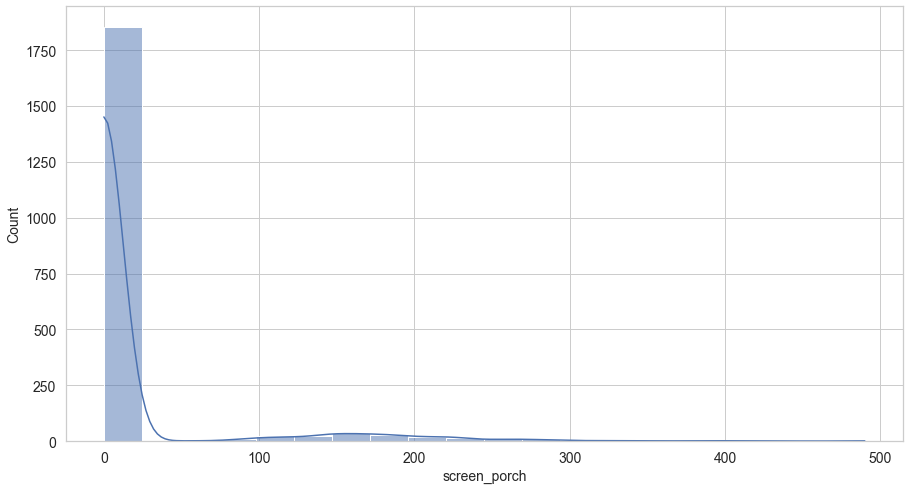

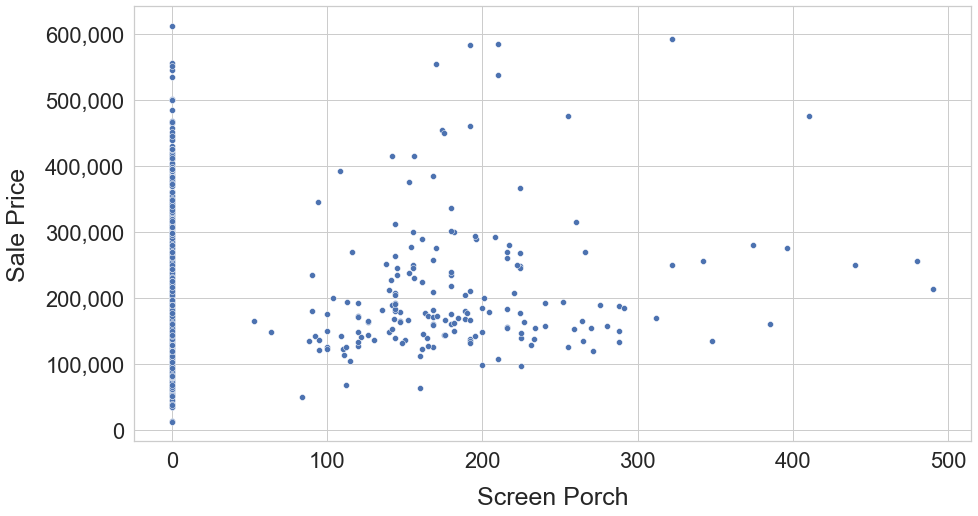

In [1061]:
# screen_porch - Screen porch area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('screen_porch')

#Histogram to look at distribution
num_col_dist_plot('screen_porch')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('screen_porch')
df_ames['screen_porch'].corr(df_ames['saleprice'])

We don't remove outliers as data may be valid

low degree of correlation with Sales Price 0.13

0.02615212956848776

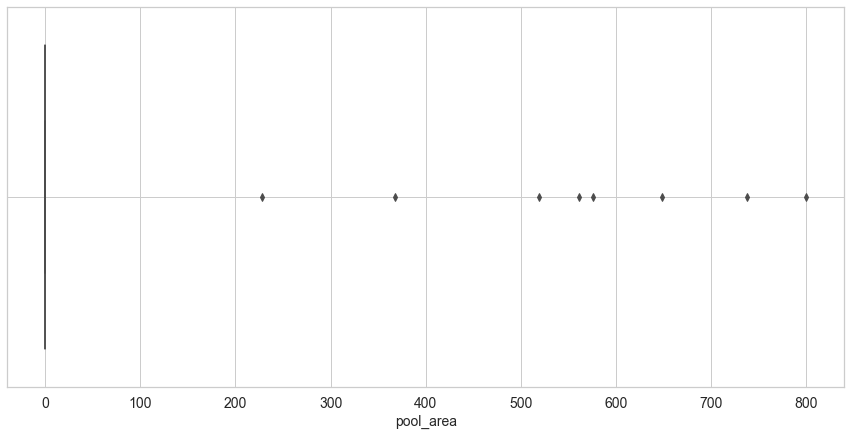

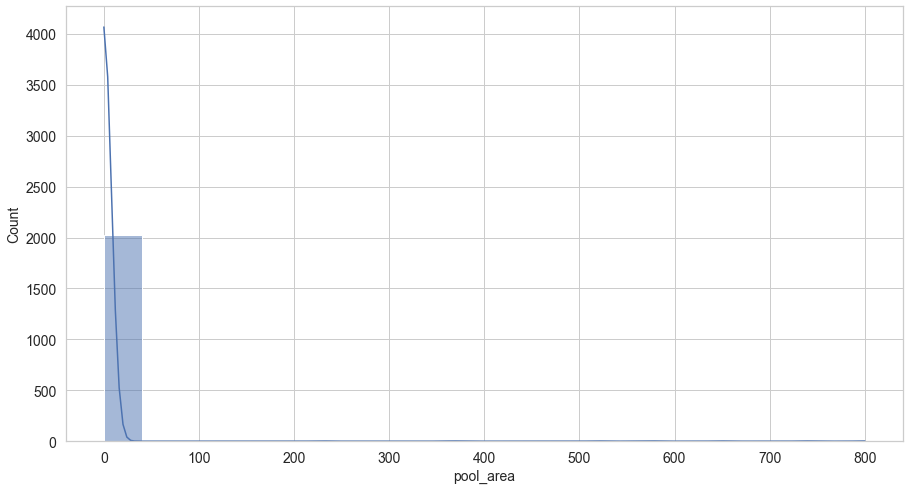

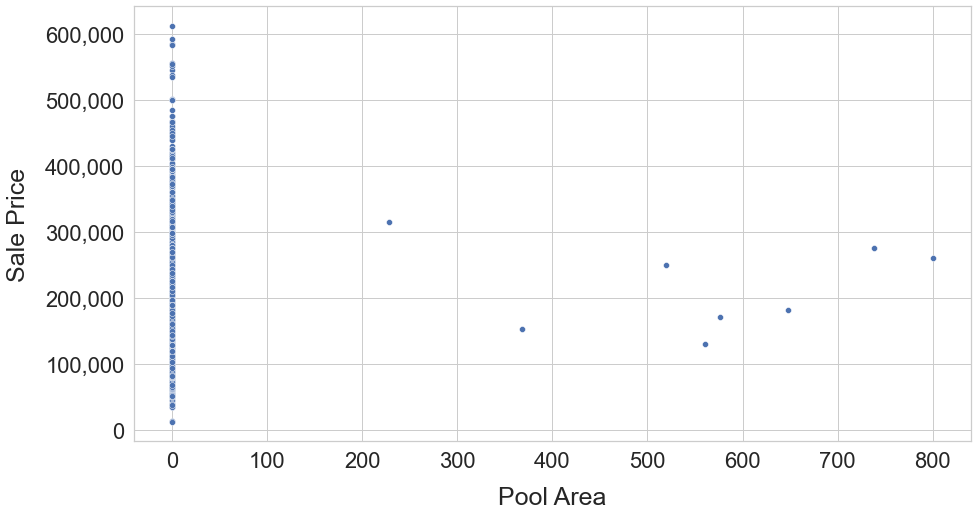

In [1062]:
# screen_porch - Pool Area area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('pool_area')

#Histogram to look at distribution
num_col_dist_plot('pool_area')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('pool_area')
df_ames['pool_area'].corr(df_ames['saleprice'])

We don't remove outliers as data may be valid

Very low degree of correlation with Sales Price 0.03

In [1063]:
df_ames.groupby('misc_feature').misc_val.count()

misc_feature
Gar2       4
NA      1970
Othr       3
Shed      55
TenC       1
Name: misc_val, dtype: int64

-0.010685165458880425

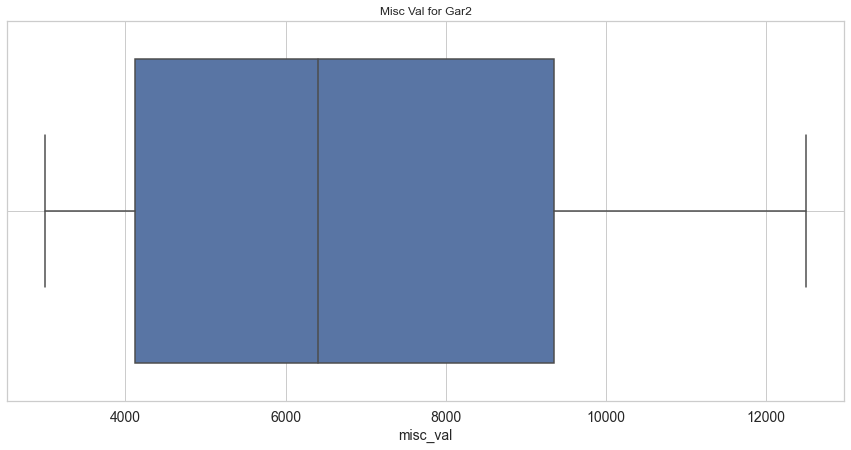

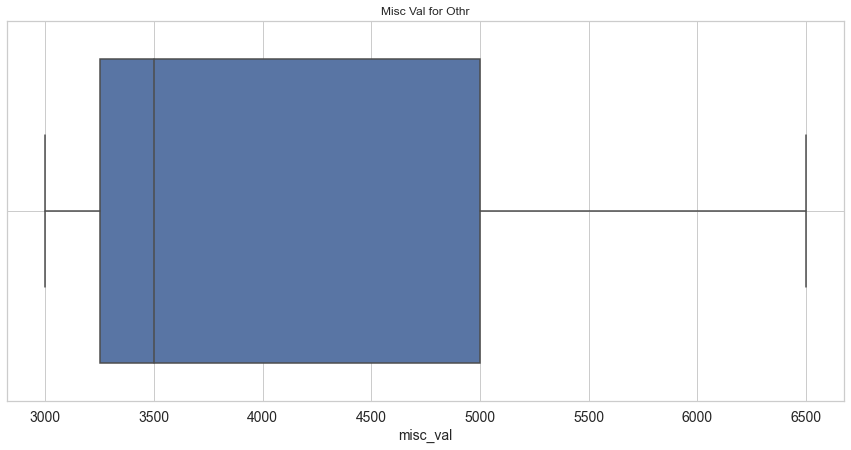

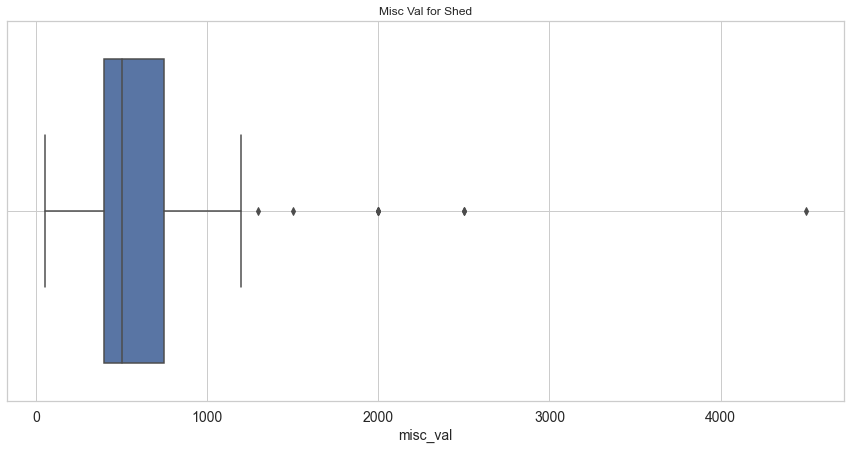

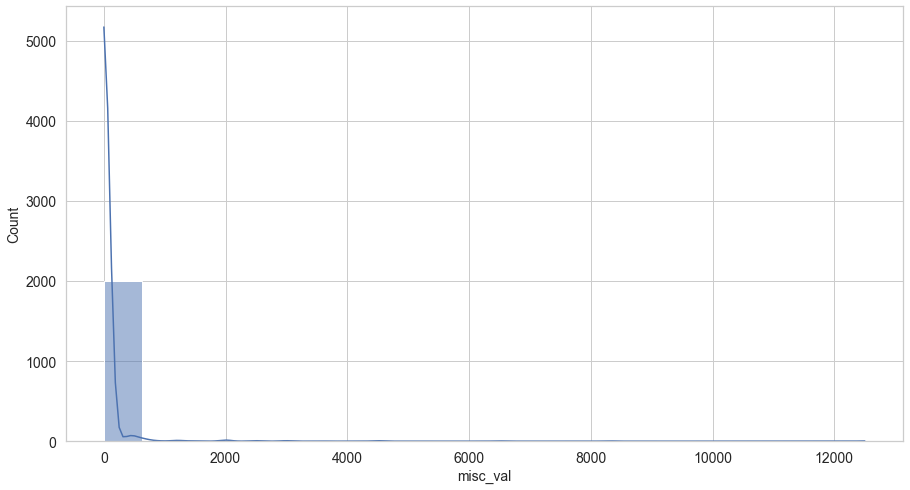

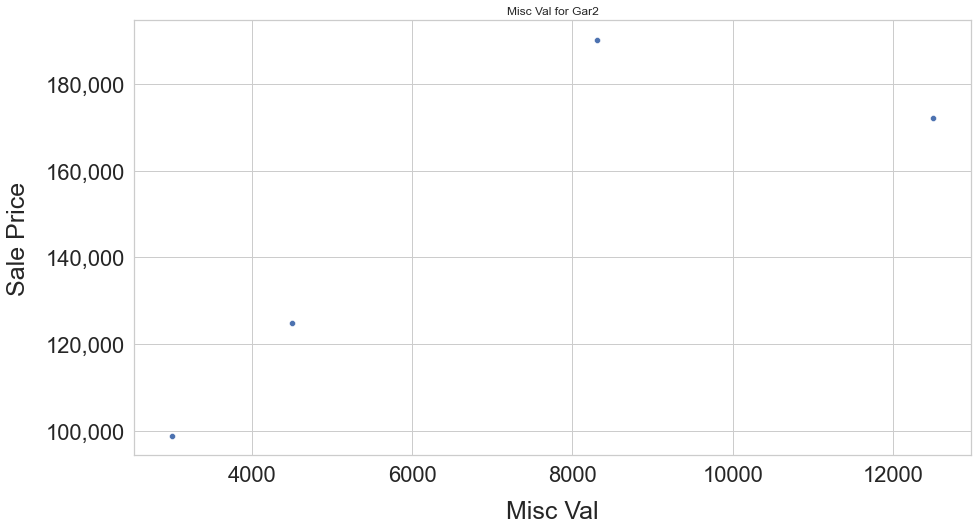

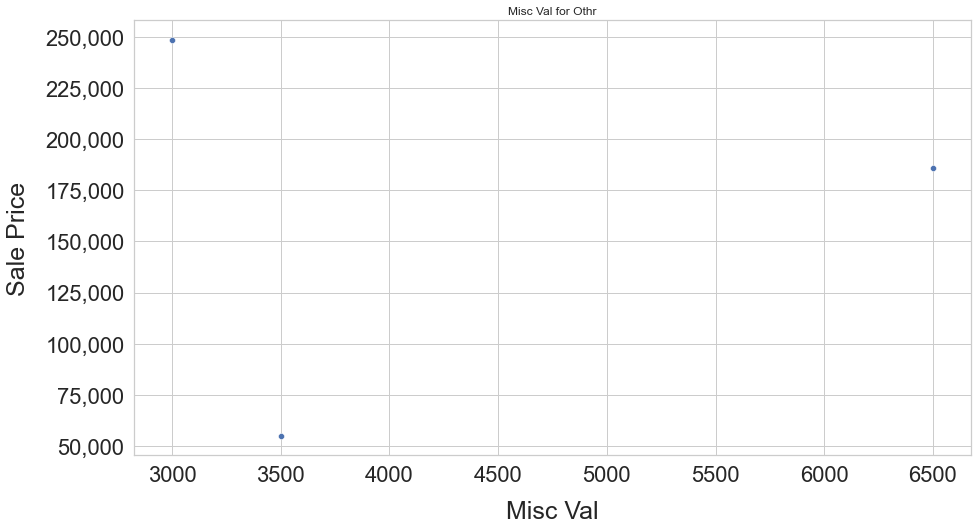

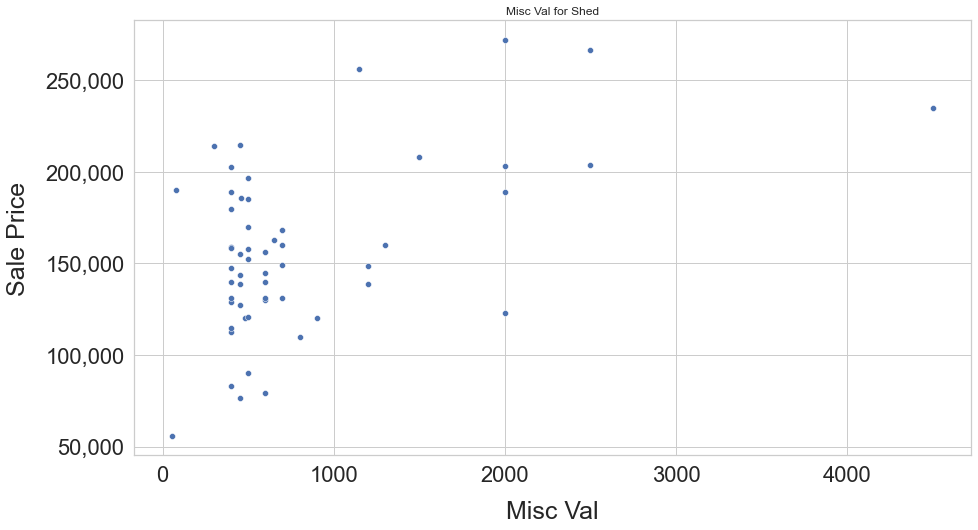

In [1064]:
# Pool Area - Screen porch area in square feet

# Boxplot to find outliers
bp = num_col_box_plot('misc_val', dataset=df_ames[df_ames['misc_feature'] == 'Gar2'], title = 'Misc Val for Gar2')
bp = num_col_box_plot('misc_val', dataset=df_ames[df_ames['misc_feature'] == 'Othr'], title = 'Misc Val for Othr')
bp = num_col_box_plot('misc_val', dataset=df_ames[df_ames['misc_feature'] == 'Shed'], title = 'Misc Val for Shed')

#Histogram to look at distribution
num_col_dist_plot('misc_val')


#Scatter Plot to look at distribution
scatter_plot_with_saleprice('misc_val', data_set=df_ames[df_ames['misc_feature'] == 'Gar2'], title = 'Misc Val for Gar2')
scatter_plot_with_saleprice('misc_val', data_set=df_ames[df_ames['misc_feature'] == 'Othr'], title = 'Misc Val for Othr')
scatter_plot_with_saleprice('misc_val', data_set=df_ames[df_ames['misc_feature'] == 'Shed'], title = 'Misc Val for Shed')


df_ames['misc_val'].corr(df_ames['saleprice'])

We don't delete the outliers as they are valid values, but being shown as outliers as this variable has very little data, most of the values are 0.

Very low negative correlation with SalePrice

0.03059082128421763

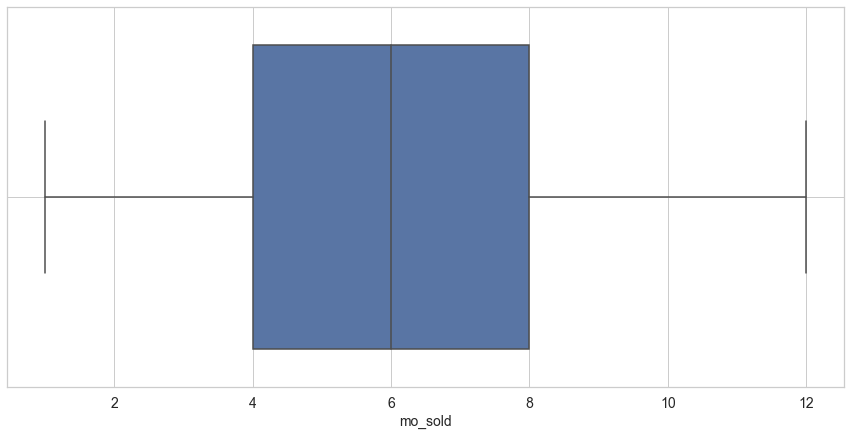

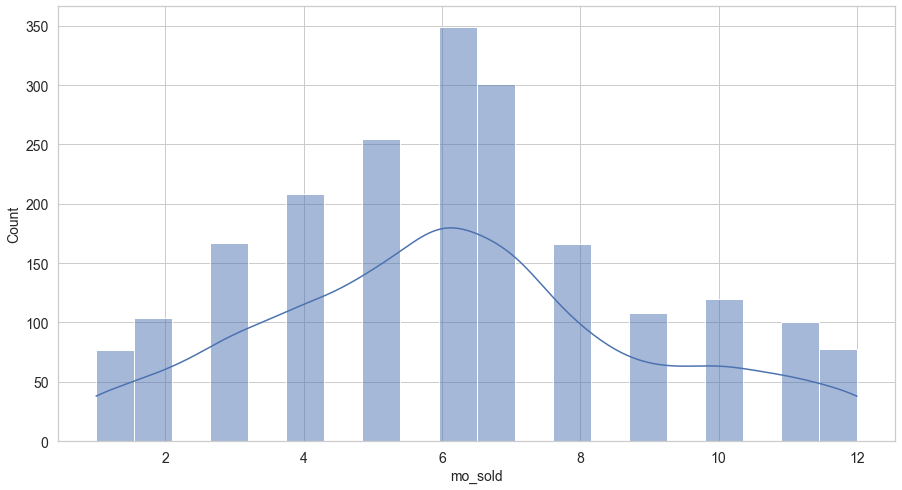

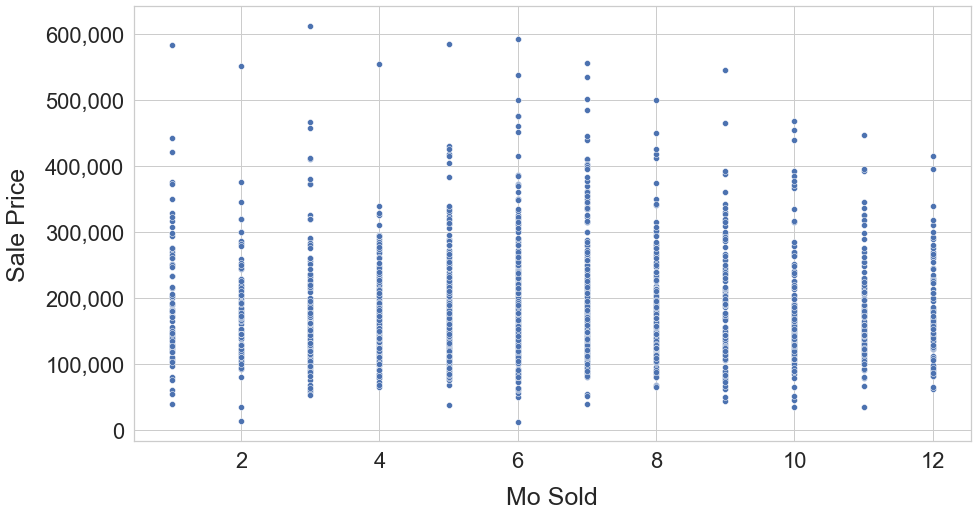

In [1065]:
# mo_sold - Month Sold (MM)

# Boxplot to find outliers
bp = num_col_box_plot('mo_sold')

#Histogram to look at distribution
num_col_dist_plot('mo_sold')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('mo_sold')
df_ames['mo_sold'].corr(df_ames['saleprice'])

No outliers. 

Very low degree of correlation with Sale Price

-0.013234403130294309

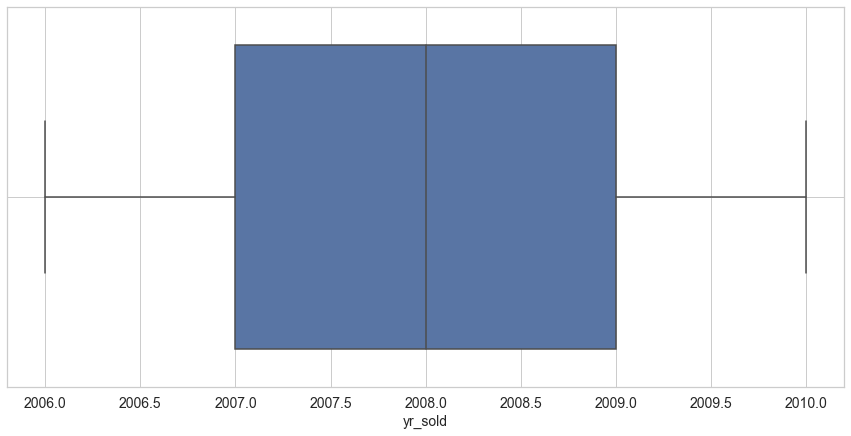

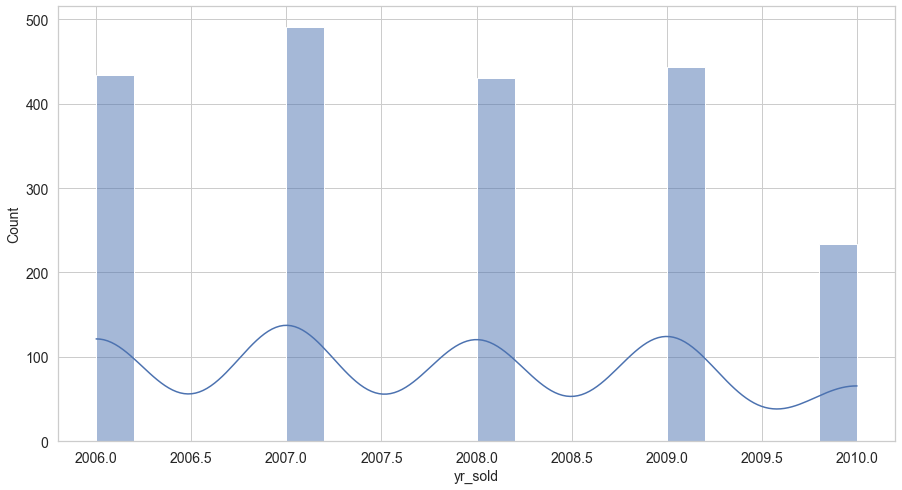

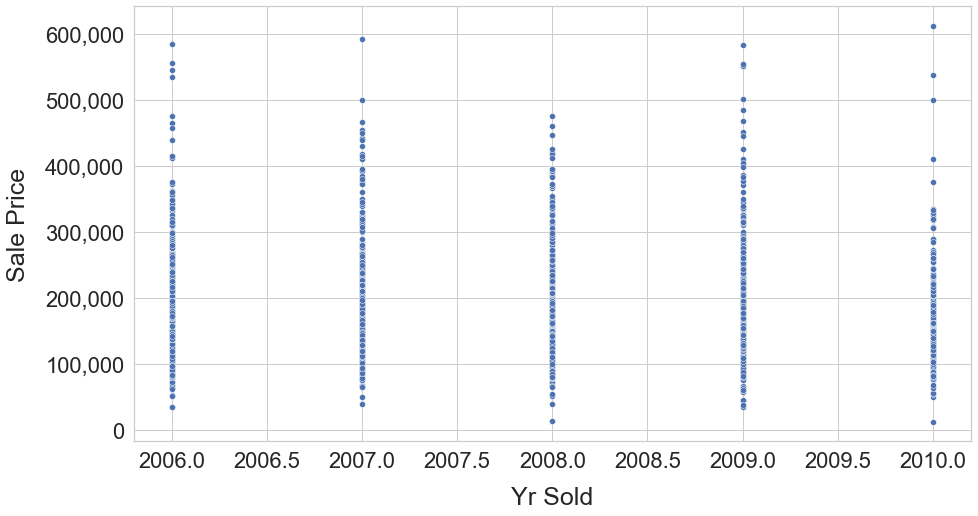

In [1066]:
# yr_sold -Year Sold (YYYY)

# Boxplot to find outliers
bp = num_col_box_plot('yr_sold')

#Histogram to look at distribution
num_col_dist_plot('yr_sold')

#Scatter Plot to look at distribution
scatter_plot_with_saleprice('yr_sold')
df_ames['yr_sold'].corr(df_ames['saleprice'])

In [1067]:
df_ames['yr_sold'].value_counts()

2007    491
2009    444
2006    434
2008    430
2010    234
Name: yr_sold, dtype: int64

yr_sold No outliers. 

Very low degree of correlation with Sale Price, -0.01

<AxesSubplot:xlabel='saleprice', ylabel='Count'>

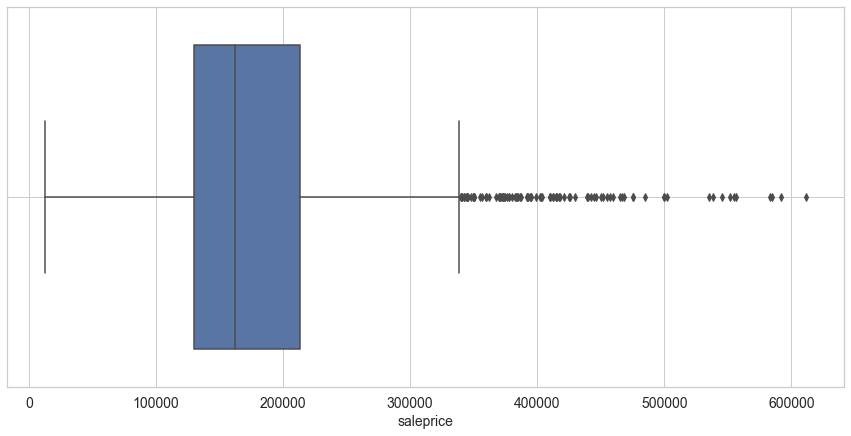

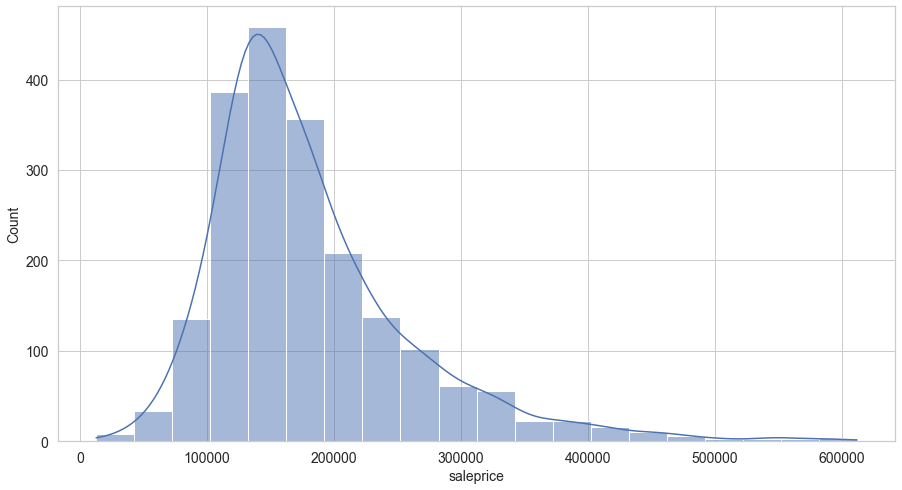

In [1068]:

# lot_area - Boxplot to find outliers
num_col_box_plot('saleprice')

#Histogram to look at distribution
num_col_dist_plot('saleprice')



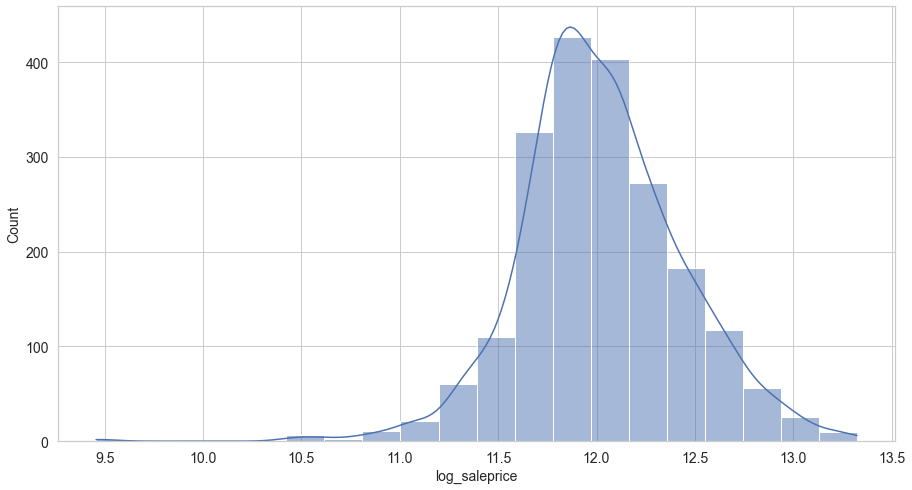

In [1069]:
df_ames['log_saleprice'] = np.log(df_ames['saleprice'])
num_col_dist_plot('log_saleprice')
df_ames.drop(columns='log_saleprice', inplace=True)

The distribution of Sale Price is right skewed, taking a log of Sale Price makes the distribution normal which makes it better suited for linear regression. 

### EDA of Categorical Data ###

In [1070]:

df_ames.select_dtypes(include='object').iloc[:, np.r_[0:20]]


,id,pid,ms_subclass,ms_zoning,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,roof_style,roof_matl,exterior_1st,exterior_2nd
0,109,533352170,60,RL,Pave,NA,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,Gable,CompShg,HdBoard,Plywood
1,544,531379050,60,RL,Pave,NA,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd
2,153,535304180,20,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd
3,318,916386060,60,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd
4,255,906425045,50,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,Wd Sdng,Plywood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2046,1587,921126030,20,RL,Pave,NA,IR1,HLS,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd
2047,785,905377130,30,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd
2048,916,909253010,50,RL,Pave,NA,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Stone
2049,639,535179160,20,RL,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,Plywood,Plywood


In [1071]:

df_ames.select_dtypes(include='object').iloc[:, np.r_[21:41]]


,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,heating,heating_qc,central_air,electrical,kitchen_qual,functional,fireplace_qu,garage_type,garage_finish,garage_qual,garage_cond,paved_drive
0,Gd,TA,CBlock,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,Attchd,RFn,TA,TA,Y
1,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y
2,TA,Gd,CBlock,TA,TA,No,GLQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NA,Detchd,Unf,TA,TA,Y
3,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,NA,BuiltIn,Fin,TA,TA,Y
4,TA,TA,PConc,Fa,Gd,No,Unf,Unf,GasA,TA,Y,SBrkr,TA,Typ,NA,Detchd,Unf,TA,TA,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2046,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y
2047,TA,TA,CBlock,TA,TA,No,BLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NA,Detchd,Unf,TA,TA,Y
2048,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Detchd,Unf,Fa,Fa,Y
2049,TA,TA,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y


In [1072]:
df_ames.select_dtypes(include='object').iloc[:, np.r_[41:45]]

,pool_qc,fence,misc_feature,sale_type
0,NA,NA,NA,WD
1,NA,NA,NA,WD
2,NA,NA,NA,WD
3,NA,NA,NA,WD
4,NA,NA,NA,WD
...,...,...,...,...
2046,NA,NA,NA,WD
2047,NA,NA,NA,WD
2048,NA,NA,NA,WD
2049,NA,NA,NA,WD


In [1073]:
df_ames.to_csv('datasets/Ames_Post_EDA.csv')

In [1074]:
df_ames_test.to_csv('datasets/Ames_Test_Post_EDA.csv')

In [1075]:
#ms_subclass, street, lot_shape, neighborhood, house_style, electrical, kitchen_qual, exter_qual, garage_qual, bsmt_qual, sale_type


<AxesSubplot:xlabel='Sale Price ($)', ylabel='Ms Subclass'>

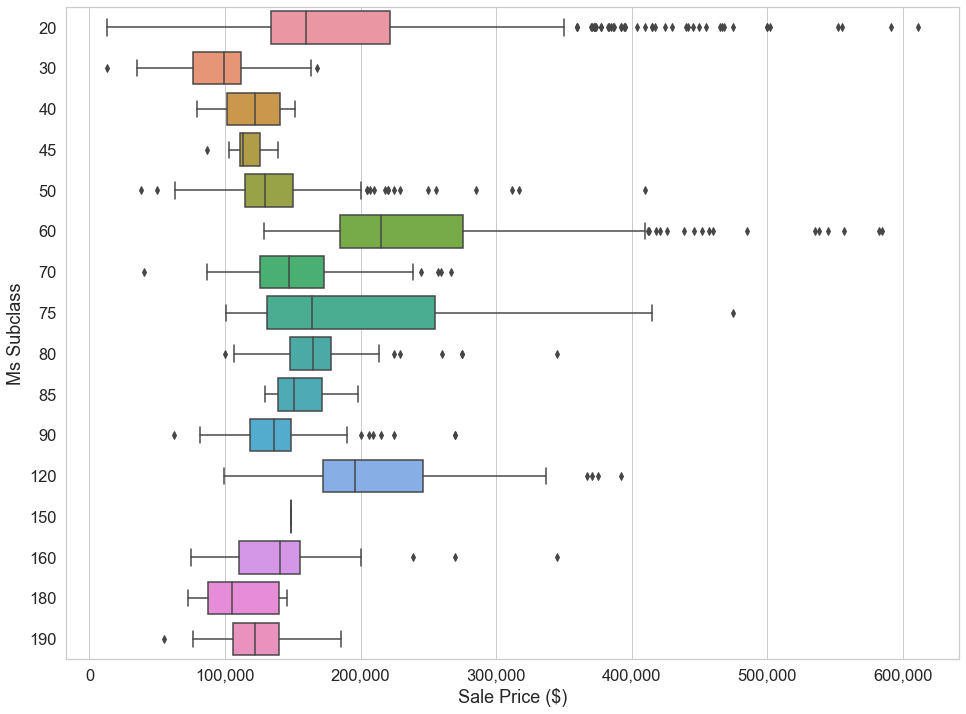

In [1076]:
cat_col_box_plot('ms_subclass', orient='h')

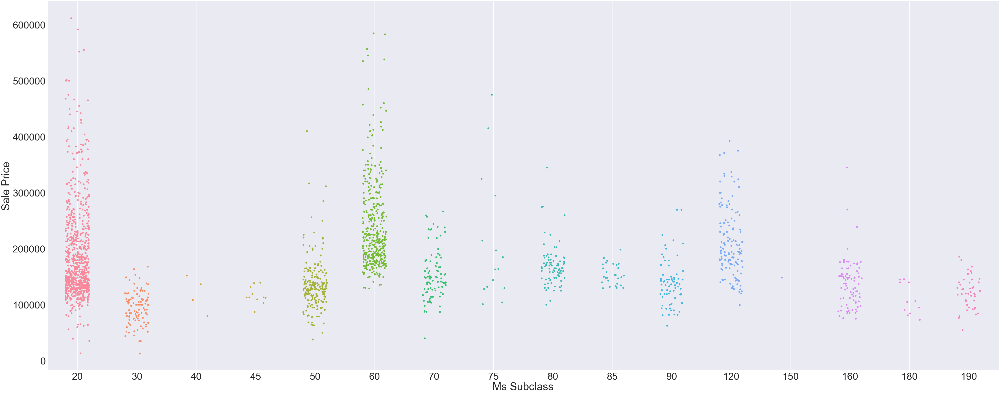

In [1077]:
cat_plot('ms_subclass', kind='strip', font_scale=4, jitter=0.2);

The Box Plot shows that MS Subclass value of 60 (*2-STORY 1946 & NEWER*) has the maximum median Sale Price among all MS subclasses, of approximately 210,000$. The strip plot shows the distribution of the houses of various  MS Subclasses. 

Maximum houses fall under MS Subclass = 20 (*1-STORY 1946 & NEWER ALL STYLES*) and the next highest number fall under MS Subclass value of 60 (*2-STORY 1946 & NEWER*)

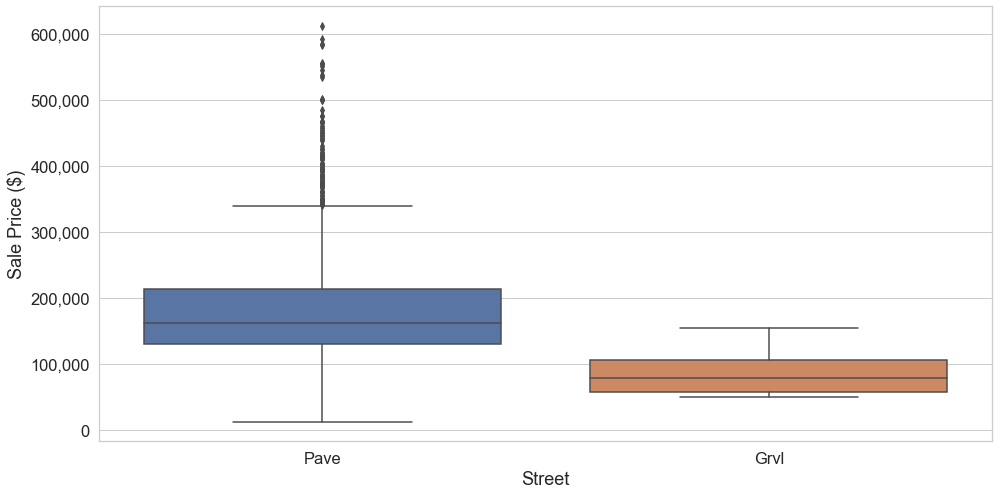

In [1078]:
cat_col_box_plot('street');

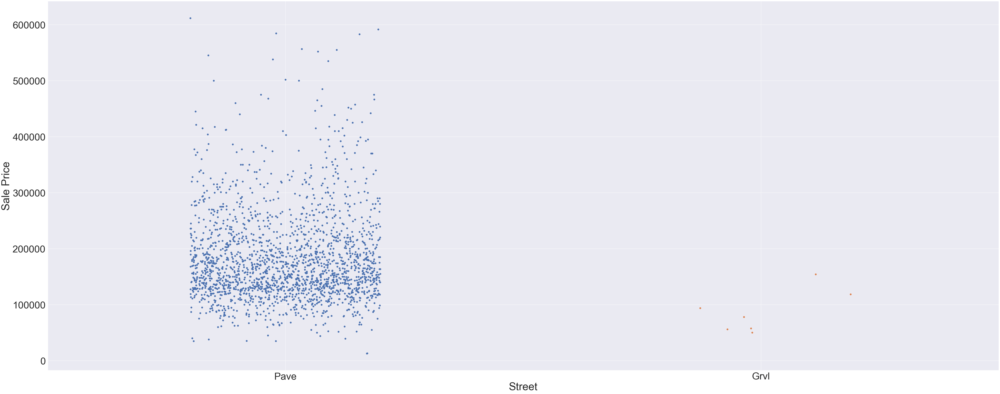

In [1079]:
cat_plot('street', kind='strip', font_scale=4, jitter=0.2);

The boxplot, shows that the median sale price of houses with paved street is higher than median sale price of houses with gravel streets. The strip plot shows that most houses have Paved streets vs Gravel streets. 

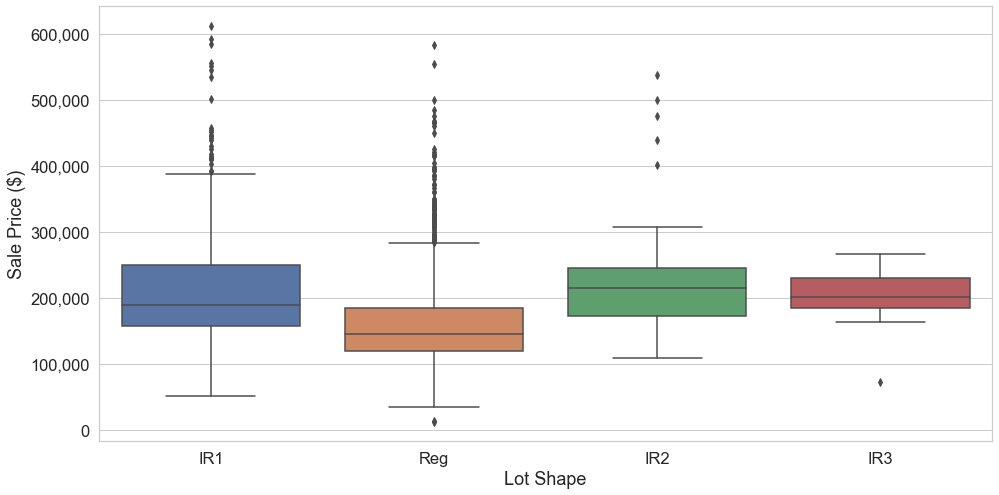

In [1080]:
cat_col_box_plot('lot_shape');

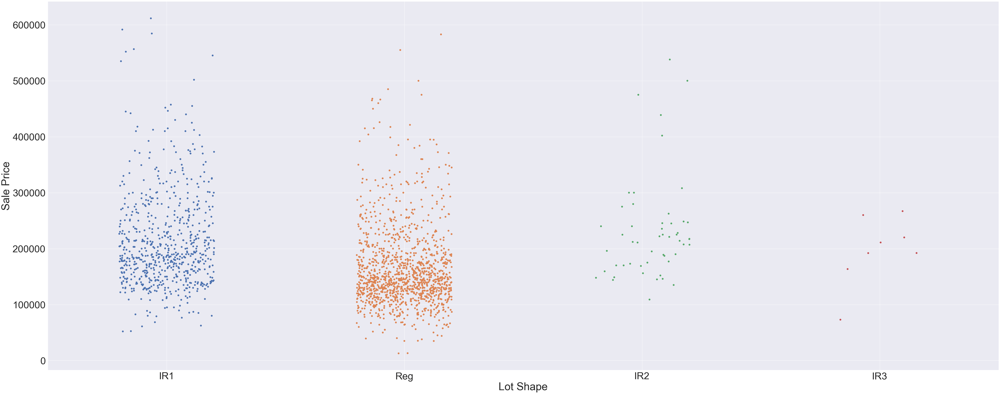

In [1081]:
cat_plot('lot_shape', kind='strip', font_scale=4, jitter=0.2);

The box plot shows that houses with moderately irregular (ir2) lot shapes have a higher median price, however when we look at the strip plot we can tell that there are very few houses with moderately irregular lot shapes. 

Most houses have regular lot shapes, and the next highest number of houses have slightly irregular lot shapes. However as seen in the boxplot, the median price of slightly irregular plots is higher than regular plots. 

<AxesSubplot:xlabel='Sale Price ($)', ylabel='Neighborhood'>

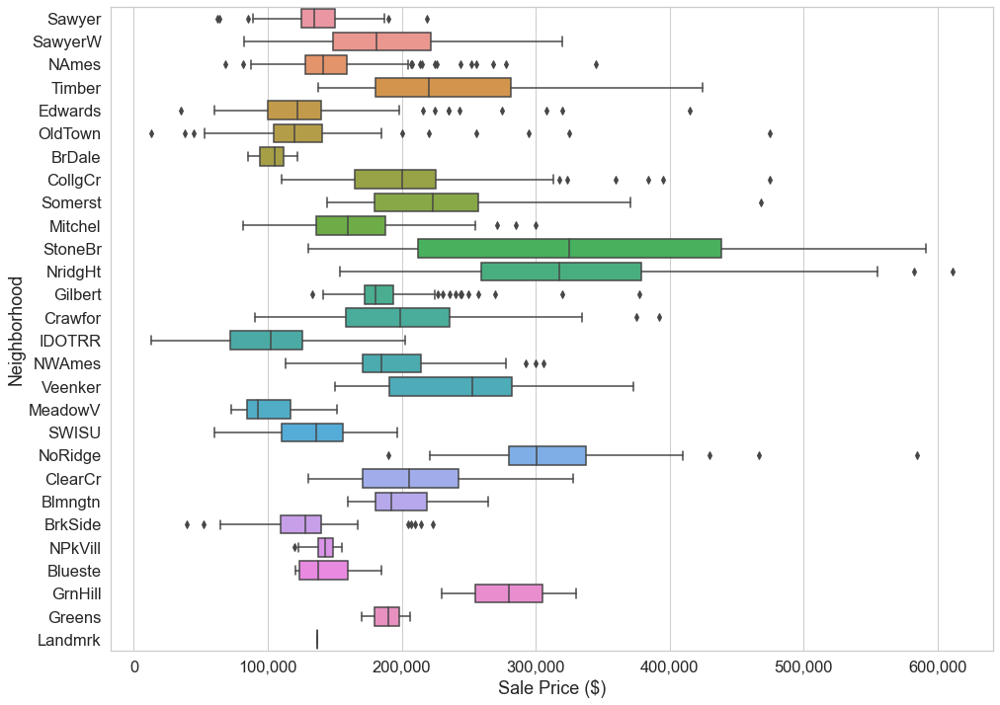

In [1082]:
cat_col_box_plot('neighborhood', orient='h')

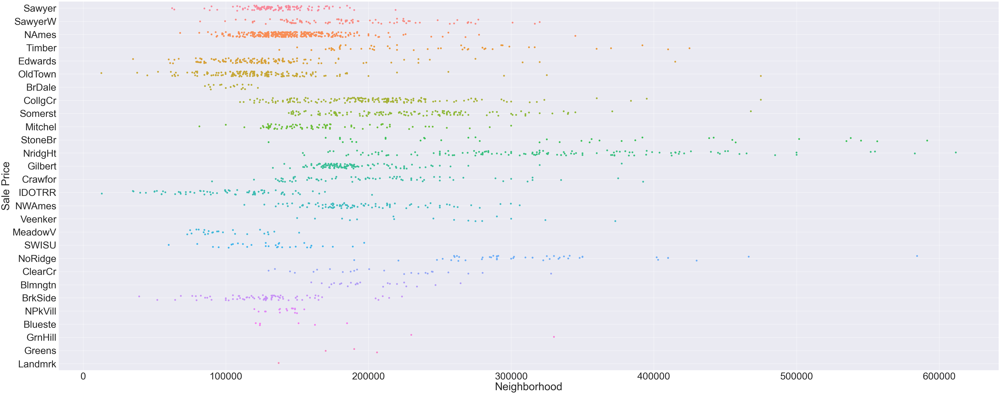

In [1083]:
cat_plot('neighborhood', kind='strip', font_scale=4, jitter=0.2, orient='h');

The boxplot shows that medians of sale price of houses across neighbourhoods vary greatly. *StoneBr(Stone Brook)* neighbourhood has the highest median sale price (around 320,000\$ ), where as *MeadowV (Meadow Village)* neighbourhood has the lowest median sale price (around 90,000$). It appears that *NAmes (North Ames)* neighbourhood has the maximum houses from our dataset, whereas *Landmrk (Landmark)* has the fewest

<AxesSubplot:xlabel='House Style', ylabel='Sale Price ($)'>

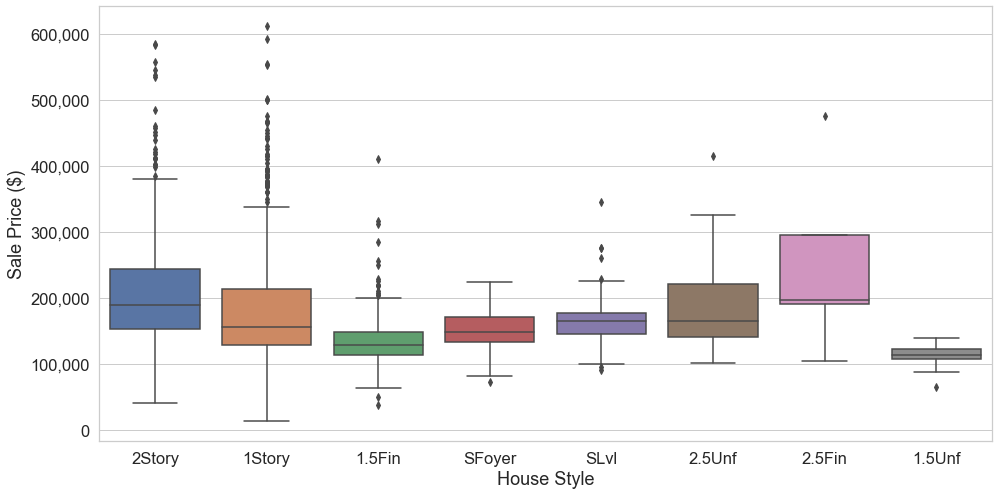

In [1084]:
cat_col_box_plot('house_style')

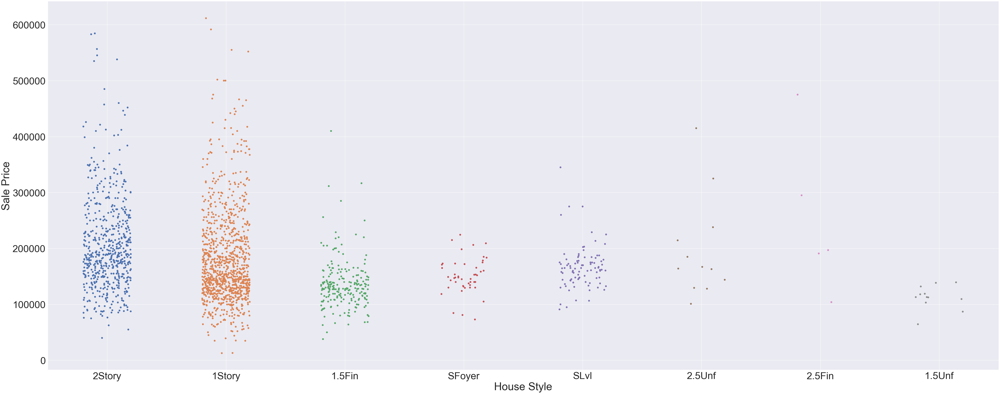

In [1085]:
cat_plot('house_style', kind='strip', font_scale=4, jitter=0.2);

From the strip plot we observe that, maximum houses in our dataset are 1 and 2 story houses. Even though from the boxplot we see that the 2.5Fin (Two and one-half story: 2nd level finished) houses have a highest median there are very few of them. 

The boxplot shoews that, 2story houses have the 2nd highest median sale price of around 190,000\\$ while 2.5Unf (Two and one-half story: 2nd level unfinished),SLvl (Split Level),1story style houses have similar median sale prices of around 160,000 \\$. However as noted above, there are many more houses of style 1Story than the other two. 


<AxesSubplot:xlabel='Electrical', ylabel='Sale Price ($)'>

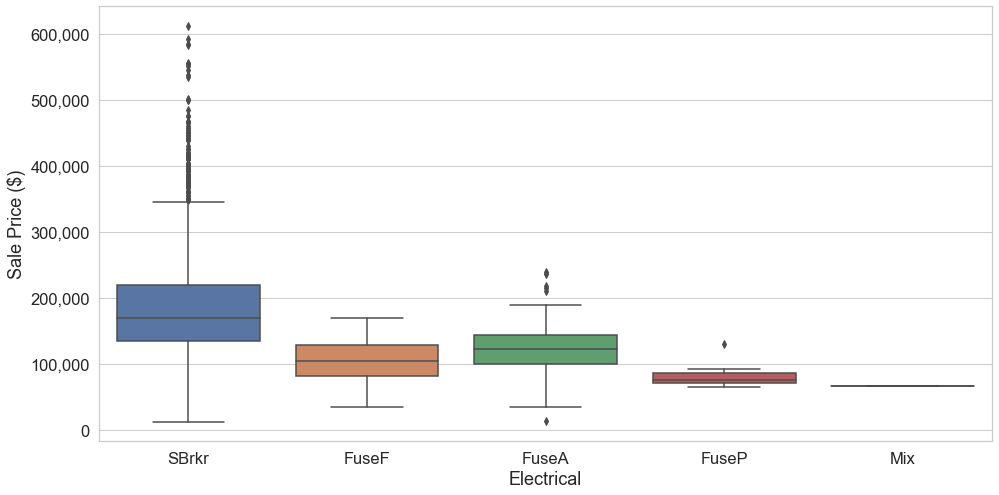

In [1086]:
cat_col_box_plot('electrical')

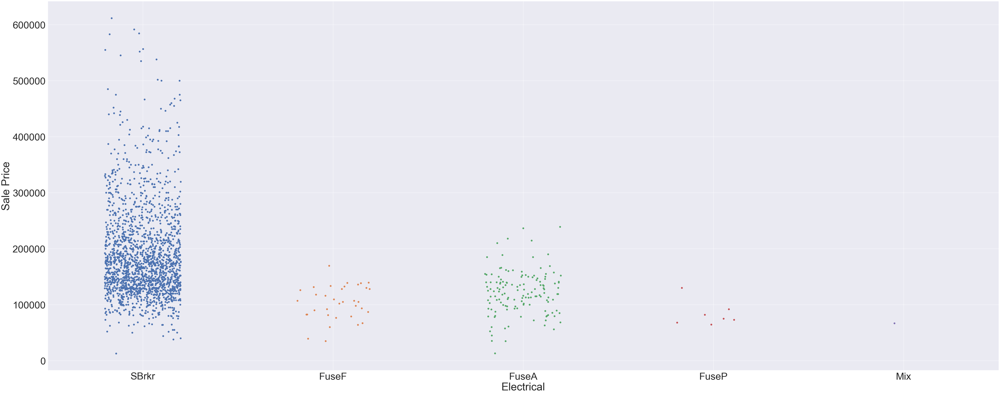

In [1087]:
cat_plot('electrical', kind='strip', font_scale=4, jitter=0.2);

The strip plot shows that maximum houses in the dataset have SBrkr (Standard Circuit Breakers & Romex) electrical system. This category of houses also has the highest median of Sale Price or around 185,000\\$ compared to other electrical systems. Similarly minimum houses are in the Mix electrical system category which also has the lowest median sale price of around 70,000.

<AxesSubplot:xlabel='Kitchen Qual', ylabel='Sale Price ($)'>

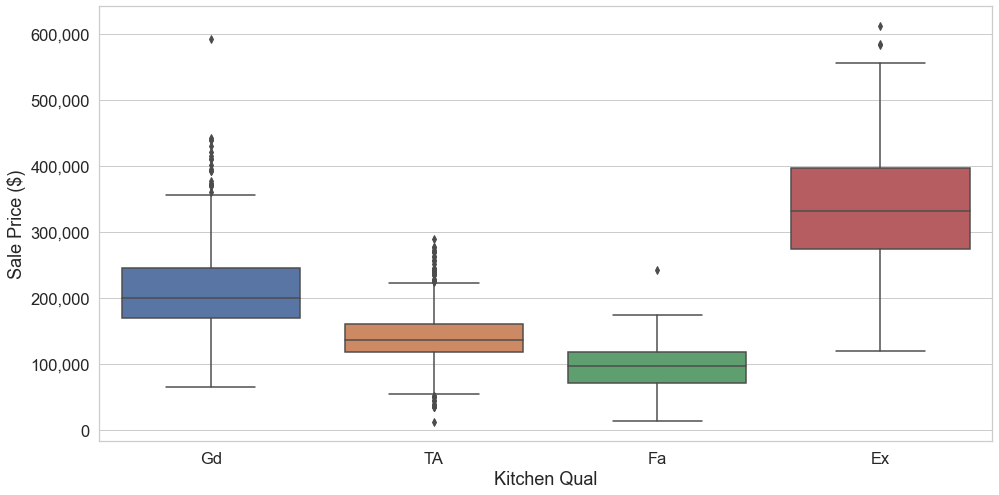

In [1088]:
cat_col_box_plot('kitchen_qual')

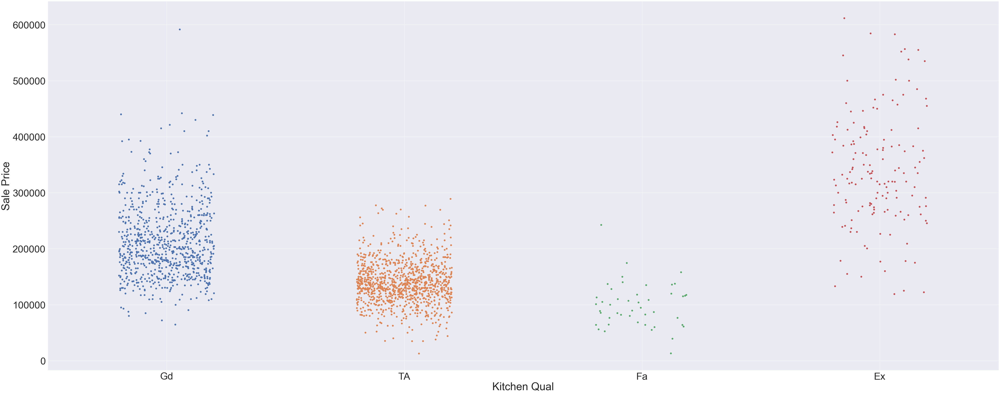

In [1089]:
cat_plot('kitchen_qual', kind='strip', font_scale=4, jitter=0.2);

The boxplot indicates that houses with kitchens of excelent quality have the highest median of around - 320,000\\$, followed by Good and Typical categories in that order,and houses with Fair kitchen quality have the lowest median sale price of around = 100,000\\$.  The strip plot shows that maximum number of houses have Typical kitchen quality and the fair kitchen quality category have the minimum houses. 

In [1090]:
#exter_qual, garage_qual, bsmt_qual, sale_type

<AxesSubplot:xlabel='Garage Qual', ylabel='Sale Price ($)'>

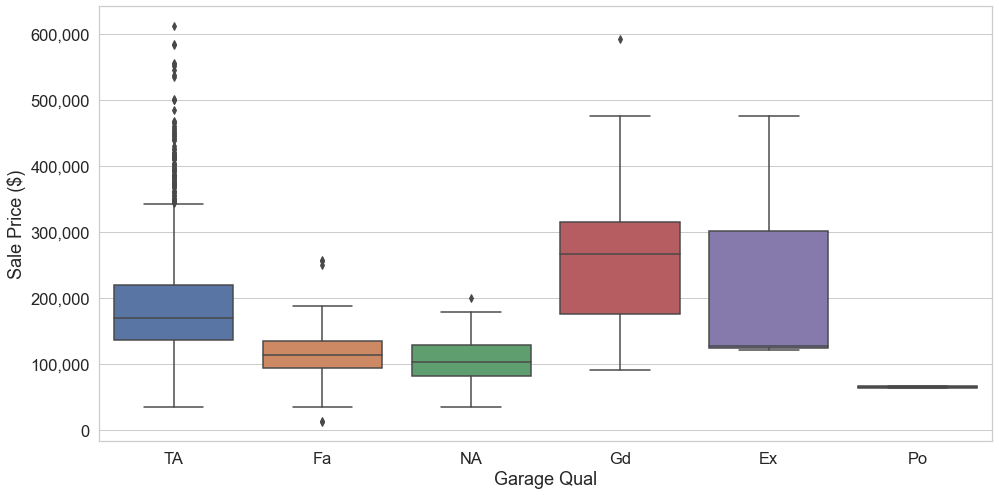

In [1091]:
cat_col_box_plot('garage_qual')

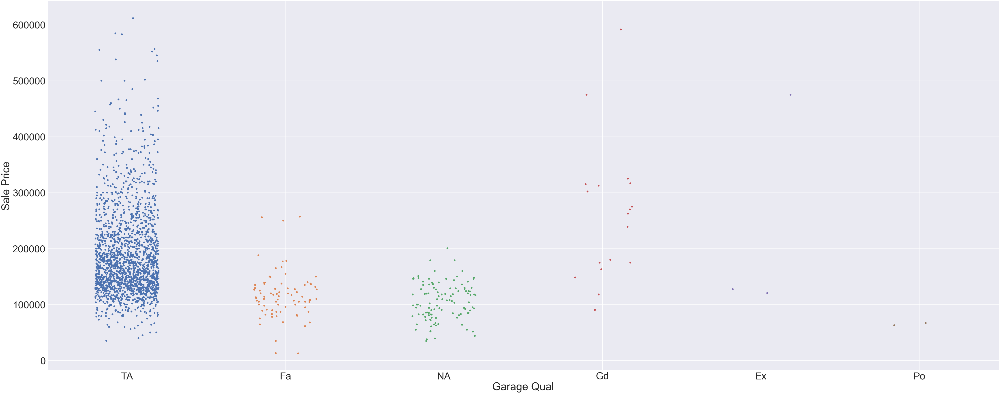

In [1092]:
cat_plot('garage_qual', kind='strip', font_scale=4, jitter=0.2);

The boxplot shows that houses with Po (poor) Garage Quality have the lowest median Sale Price of around - 70,000\\$, whereas houses with the Go(Good) Garage Quality has the highest median Sale Price of around 260,000\\$. 

Most houses belong to the TA (Typical) garage quality category which has the next highest median of around 170,000\\$. Interestingly there are very few houses in the Ex (excellent) Garage Quality category and the median sale price of this category is quite low at around 120,000\\$. 

<AxesSubplot:xlabel='Bsmt Qual', ylabel='Sale Price ($)'>

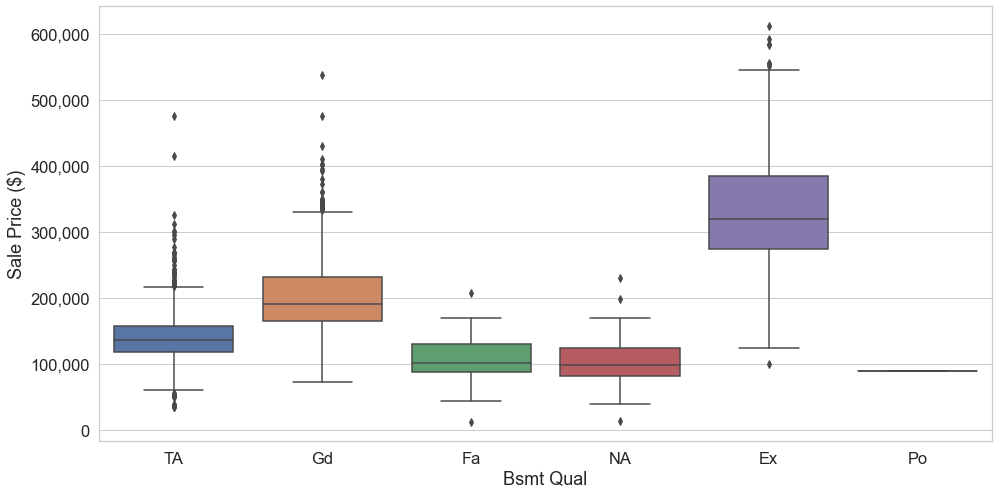

In [1093]:
cat_col_box_plot('bsmt_qual')

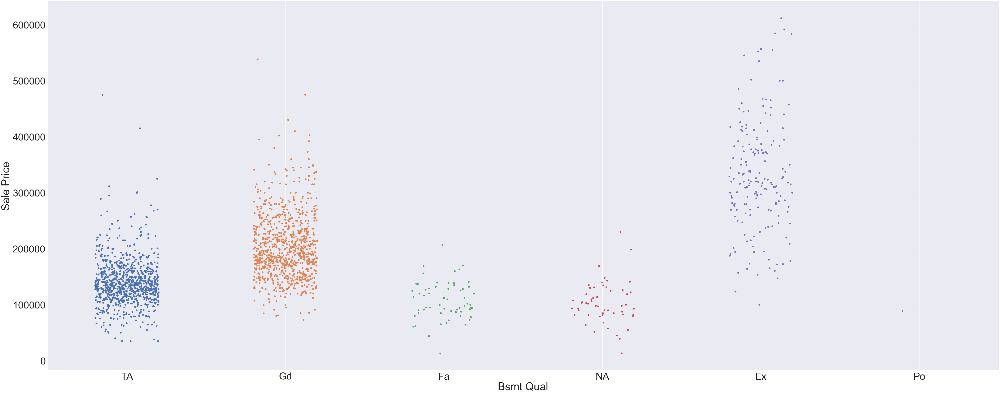

In [1094]:
cat_plot('bsmt_qual', kind='strip', font_scale=4, jitter=0.2);

The boxplot shows that houses with Po (poor) Bsmt Quality have the lowest median Sale Price of around 90,000\\$, whereas houses with the Ex(Excellent) Basement Quality have the highest median Sale Price of around 320,000\\$. 

Most houses belong to the Gd (Good) garage quality category which has the next highest median of around 190,000\\$. There are very few houses in the Fa (Fair) and NA (Not Applicable) Basement Quality category and the median sale price of these categories is similar at around 100,000\\$. 


<AxesSubplot:xlabel='Sale Type', ylabel='Sale Price ($)'>

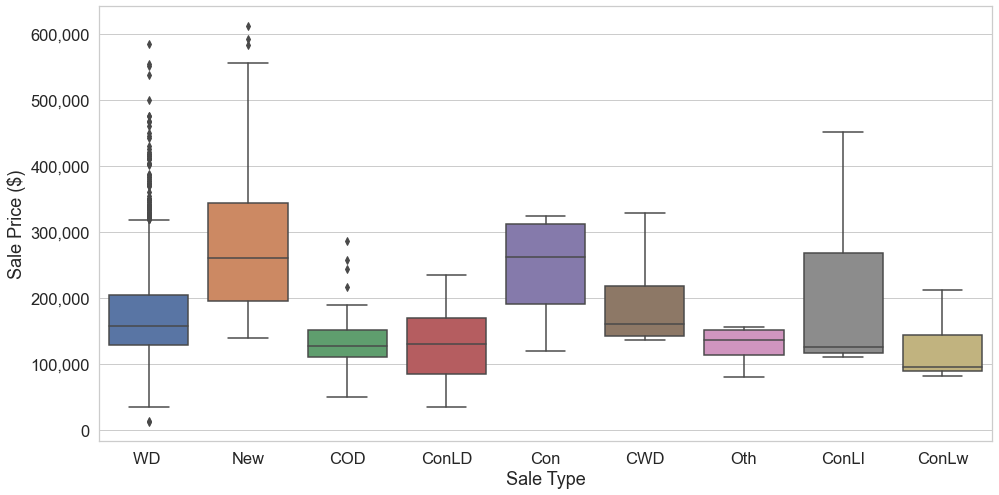

In [1095]:
cat_col_box_plot('sale_type')


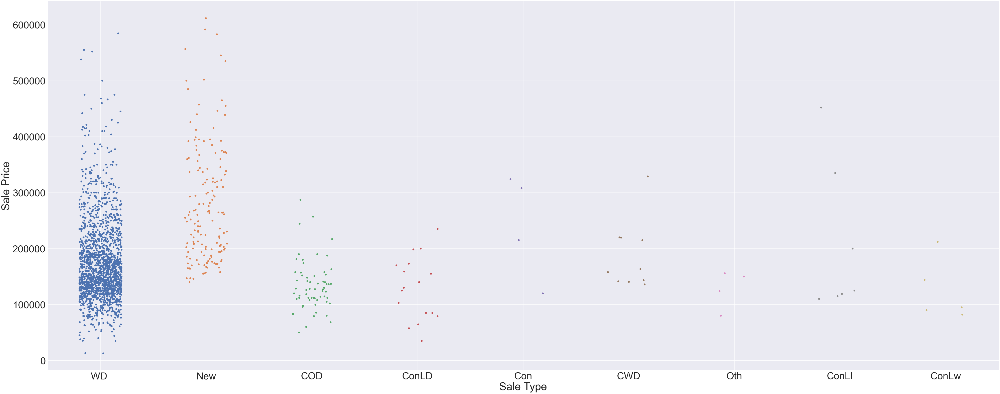

In [1096]:
cat_plot('sale_type', kind='strip', font_scale=4, jitter=0.2);

From the boxplot we see that the highest median price is observed for Sale Types New (Home just constructed and sold) and Con (Contract 15% Down payment regular terms) at around - 250,000\\$. The lowest median sale price is observed for sale type ConLw(Contract Low Down payment and low interest) at around 100,000\\$.

In terms of the distribution, maximum houses in the dataset were sold by WD (Warranty Deed - Conventional) sale type, followed by New sale type. Con(Contract 15\% Down payment regular terms), Oth (other), ConLi(Contract Low Interest) and ConLw(Contract Low Down payment and low interest) sale types were applied for  very few houses each.

<AxesSubplot:xlabel='Kitchen Qual', ylabel='Sale Price ($)'>

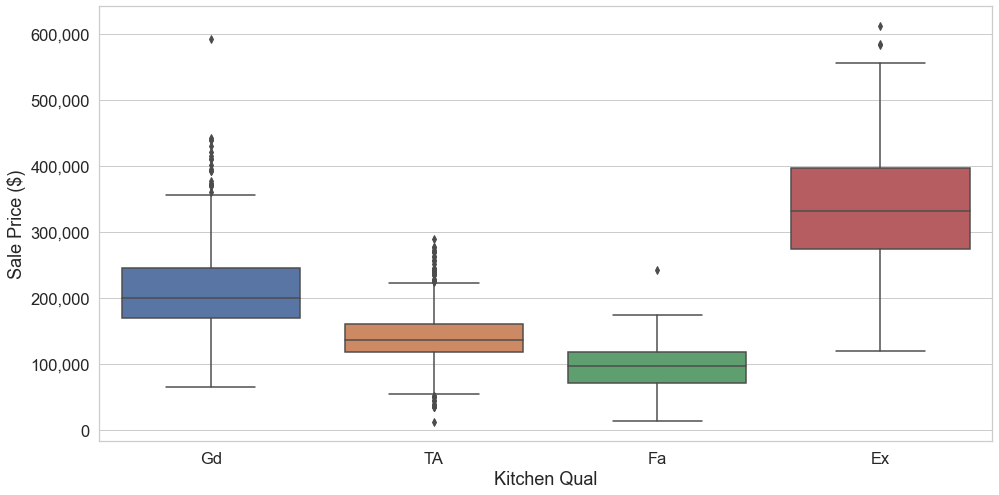

In [1097]:
cat_col_box_plot('kitchen_qual')